In [14]:
import os
import sys
cwd = os.getcwd()
module_path = os.path.abspath(os.path.join('..'))
sys.path.insert(0, os.path.join(cwd, "../"))

import pickle
import torch
import importlib
import numpy as np
import pandas as pd
import copy

import src.bin.tensorify as tensorify
import src.utils.data_conversion_utils as conversions
import src.data_manager.student_life_var_binned_data_manager as data_manager
import src.bin.trainer as trainer

from sklearn import metrics

from torch import nn
from copy import copy
from copy import deepcopy
from src import definitions
from src.bin import validations
from src.bin import statistics
from src.bin import plotting
from src.utils.read_utils import read_pickle
from src.utils import student_utils
from src.data_manager import sub_sampler
from src.data_manager import cross_val
from src.data_manager import helper as data_manager_helper
from tabulate import tabulate


from src.models.multitask_learning import multitask_autoencoder


pd.set_option('max_rows', 10000)

importlib.reload(validations)
importlib.reload(multitask_autoencoder)
importlib.reload(sub_sampler)
importlib.reload(statistics)
importlib.reload(cross_val)
importlib.reload(definitions)
importlib.reload(conversions)
importlib.reload(tensorify)
importlib.reload(plotting)
importlib.reload(trainer)
importlib.reload(data_manager)
importlib.reload(student_utils)
importlib.reload(data_manager_helper)
feature_list = data_manager.FEATURE_LIST


In [6]:

# ##### Pickle #####
data = read_pickle('../data/training_data/shuffled_splits/training_date_normalized_shuffled_splits_select_features.pkl')

#### Data ####
# student_list = student_list =  [53, 46, 7, 49, 22, 24, 2]
# # student_list = [2]
# data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=True, 
#                                                          fill_na=True, flatten_sequence=False)

# ###### Randomize ######
# train_ids, val_ids, test_ids = cross_val.random_stratified_splits(data)
# data['train_ids'] = train_ids
# data['val_ids'] = val_ids
# data['test_ids'] = test_ids

# data = sub_sampler.get_sub_sampled_sequences(data)

############# Stats ############# 
# unnormalized_data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=False, fill_na=False)
# statistics_df, raw_df = statistics.get_statistics_on_data_dict(unnormalized_data, feature_list)
# print(statistics.get_train_test_val_label_counts_from_raw_data(data))


#### Data ####
# student_list =  [1, 2, 4 , 7,10, 22, 24, 33, 42, 46, 49, 53, 57 ]
# data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=True, 
#                                                          fill_na=True, flatten_sequence=False)

# ###### Randomize ######
# train_ids, val_ids, test_ids = cross_val.random_stratified_splits(data, stratify_by='students')
# data['train_ids'] = train_ids
# data['val_ids'] = val_ids
# data['test_ids'] = test_ids

# data = sub_sampler.get_sub_sampled_sequences(data)

############ Stats ############# 
# unnormalized_data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=False, fill_na=False)
# statistics_df, raw_df = statistics.get_statistics_on_data_dict(unnormalized_data, feature_list)
print(statistics.get_train_test_val_label_counts_from_raw_data(data))

      Train    Val    Test
--  -------  -----  ------
 0      111     45      29
 1      123     55      38
 2       93     30      21


In [7]:
################################## Init ##################################
use_historgram = True
use_covariates = True
train_only_covariates = True
autencoder_bottle_neck_feature_size = 128
autoencoder_num_layers = 1
# Since just covariates, no point of reconstrution loss.
alpha , beta = 0, 1
decay = 0.0001
first_key = next(iter(data['data'].keys()))
if use_historgram:
    num_features = len(data['data'][first_key][4][0])
else:
    num_features = len(data['data'][first_key][0][0])
num_covariates = len(data['data'][first_key][definitions.COVARIATE_DATA_IDX])
# This has to be set zero since we are not using any covariates.
shared_hidden_layer_size = 128
user_dense_layer_hidden_size = 64
num_classes = 3
learning_rate = 0.000005
n_epochs = 600
shared_layer_dropout_prob=0.00
user_head_dropout_prob=0.00

device = torch.device('cuda') if torch.cuda.is_available else torch.device('cpu')

print("Num Features:", num_features)
print("Device: ", device)
print("Num_covariates:", num_covariates)


Num Features: 9
Device:  cuda
Num_covariates: 5


In [8]:
class_weights = torch.tensor(statistics.get_class_weights_in_inverse_proportion(data))
cuda_enabled = torch.cuda.is_available()
data = tensorify.tensorify_data_gru_d(data, cuda_enabled)

In [15]:
student_list = conversions.extract_distinct_student_idsfrom_keys(data['data'].keys())

model = multitask_autoencoder.MultiTaskAutoEncoderLearner(
   conversions.prepend_ids_with_string(student_list, "student_"),
                               num_features,
                               autencoder_bottle_neck_feature_size,
                               autoencoder_num_layers,
                               shared_hidden_layer_size,
                               user_dense_layer_hidden_size,
                               num_classes,
                               num_covariates,
                               shared_layer_dropout_prob,
                               user_head_dropout_prob,
                               False, #ordinal Regression
                               train_only_covariates)
if cuda_enabled:
    model.cuda()
    class_weights = class_weights.cuda()

reconstruction_criterion = torch.nn.L1Loss(reduction="sum")
classification_criterion = torch.nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=decay)
print(model)

MultiTaskAutoEncoderLearner(
  (shared_linear): Linear(in_features=5, out_features=128, bias=True)
  (shared_activation): ReLU()
  (shared_layer_dropout): Dropout(p=0.0)
  (shared_linear_1): Linear(in_features=128, out_features=64, bias=True)
  (shared_activation_1): ReLU()
  (user_heads): UserDenseHead(
    (student_dense_layer): ModuleDict(
      (student_1): Sequential(
        (0): Linear(in_features=64, out_features=64, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.0)
        (3): Linear(in_features=64, out_features=3, bias=True)
      )
      (student_10): Sequential(
        (0): Linear(in_features=64, out_features=64, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.0)
        (3): Linear(in_features=64, out_features=3, bias=True)
      )
      (student_2): Sequential(
        (0): Linear(in_features=64, out_features=64, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.0)
        (3): Linear(in_features=64, out_features=3, bias=True)
      )
      (stude

/home/abhinavshaw/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/abhinavshaw/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


xxxxxxxxxxxxxx epoch: 0 xxxxxxxxxxxxxx


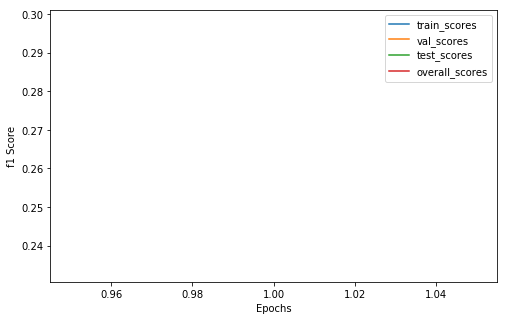

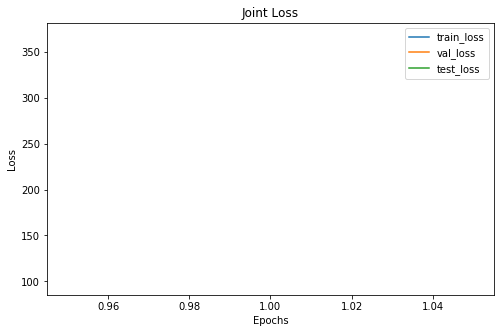

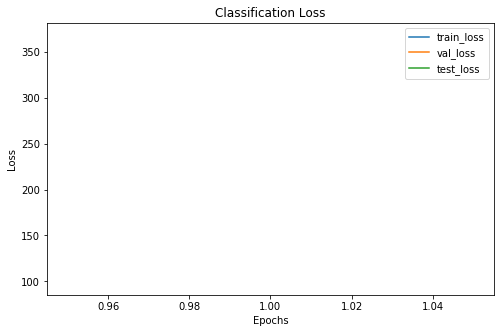

Cofusion Matrix For Val Set: 
--  --  --
 8  14  23
10  23  22
15   9   6
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     33      24
 1      113     46      32
 2      127     51      32
xxxxxxxxxxxxxx epoch: 1 xxxxxxxxxxxxxx


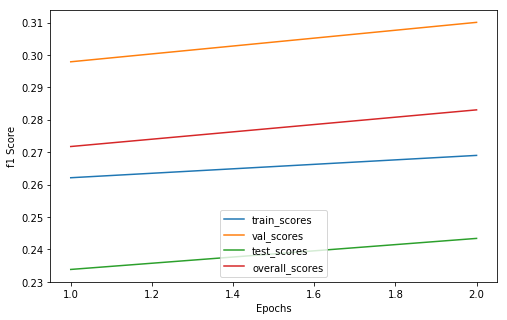

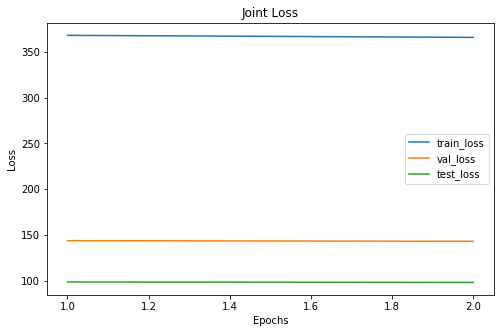

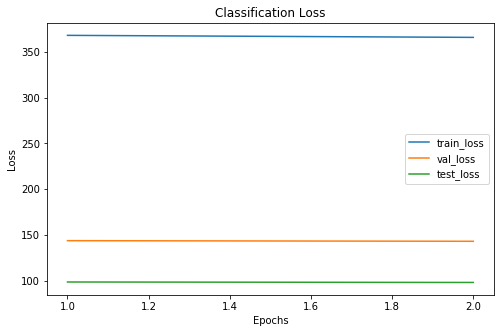

Cofusion Matrix For Val Set: 
--  --  --
 8  14  23
10  23  22
13   9   8
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       78     31      21
 1      115     46      32
 2      134     53      35
xxxxxxxxxxxxxx epoch: 2 xxxxxxxxxxxxxx


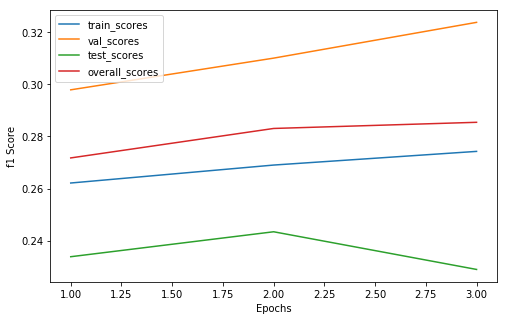

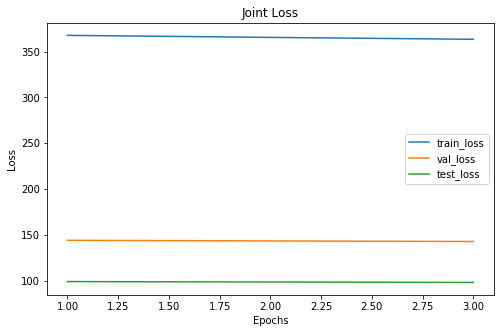

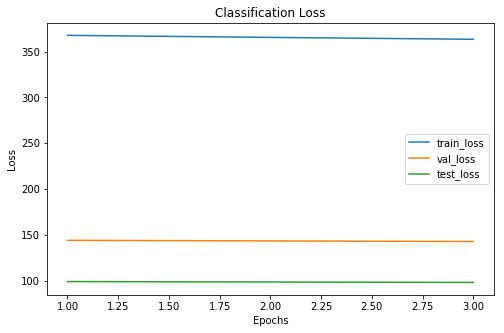

Cofusion Matrix For Val Set: 
--  --  --
 9  15  21
11  24  20
13   9   8
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       79     33      22
 1      121     48      33
 2      127     49      33
xxxxxxxxxxxxxx epoch: 3 xxxxxxxxxxxxxx


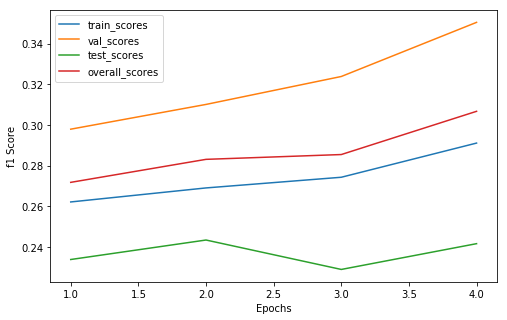

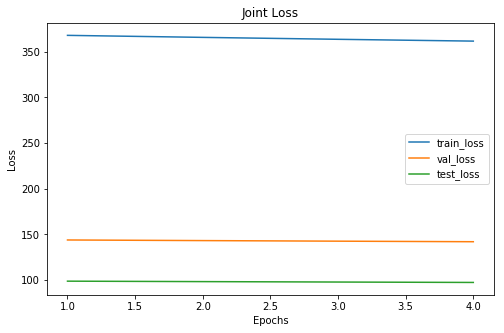

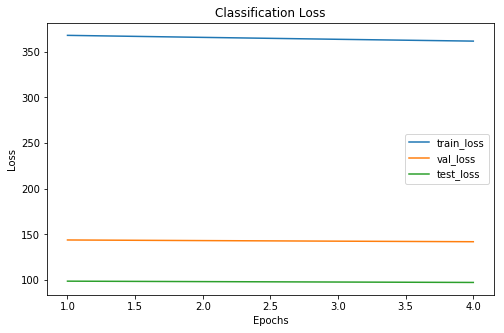

Cofusion Matrix For Val Set: 
--  --  --
 9  15  21
11  27  17
12   9   9
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       83     32      24
 1      128     51      33
 2      116     47      31
xxxxxxxxxxxxxx epoch: 4 xxxxxxxxxxxxxx


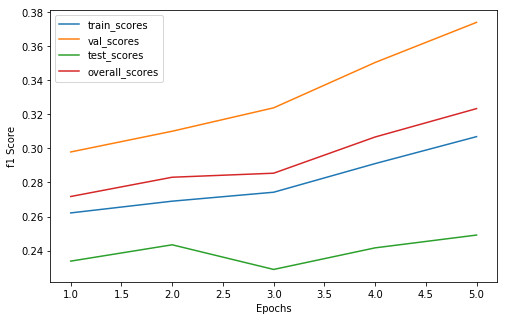

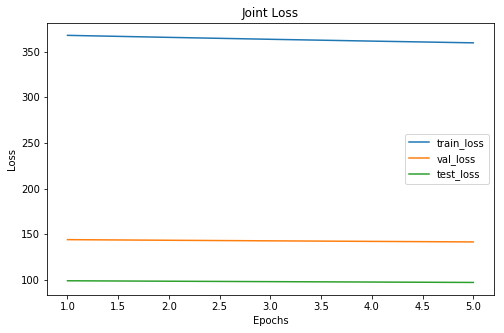

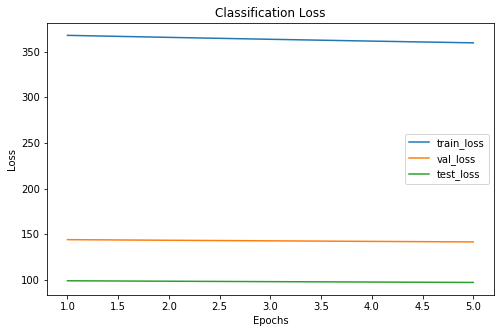

Cofusion Matrix For Val Set: 
--  --  --
11  15  19
11  28  16
12   9   9
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     34      24
 1      134     52      39
 2      106     44      25
xxxxxxxxxxxxxx epoch: 5 xxxxxxxxxxxxxx


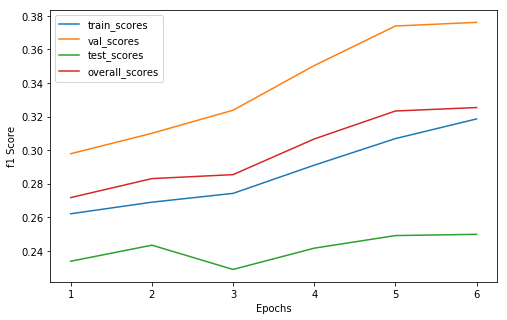

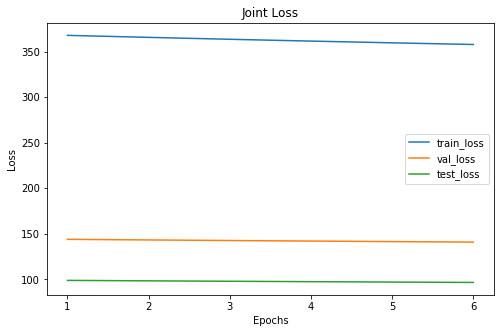

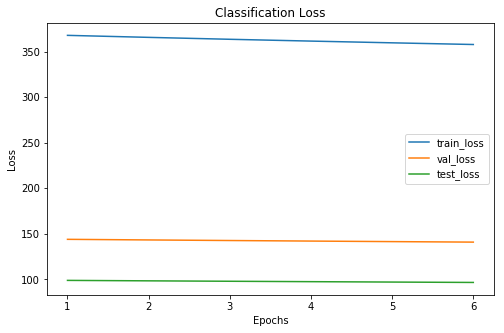

Cofusion Matrix For Val Set: 
--  --  --
11  17  17
12  30  13
12  10   8
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     35      26
 1      147     57      39
 2       89     38      23
xxxxxxxxxxxxxx epoch: 6 xxxxxxxxxxxxxx


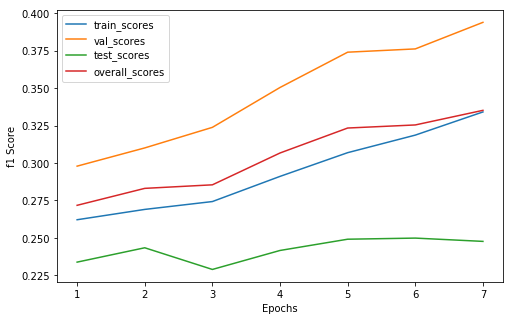

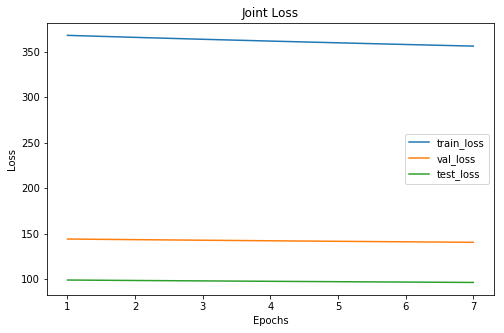

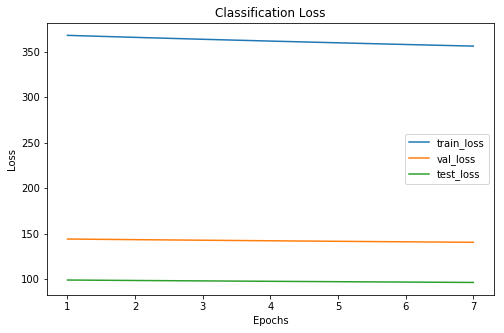

Cofusion Matrix For Val Set: 
--  --  --
11  24  10
12  34   9
12  10   8
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       96     35      27
 1      164     68      40
 2       67     27      21
xxxxxxxxxxxxxx epoch: 7 xxxxxxxxxxxxxx


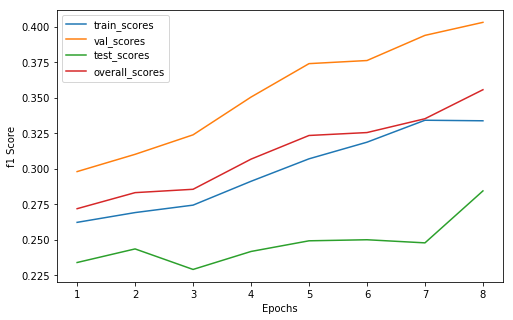

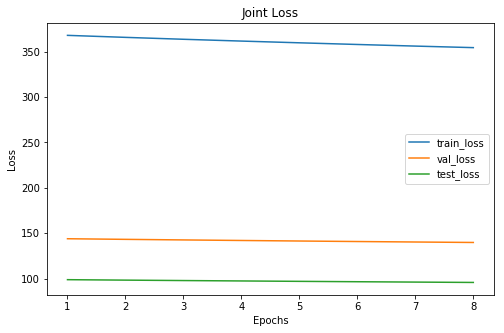

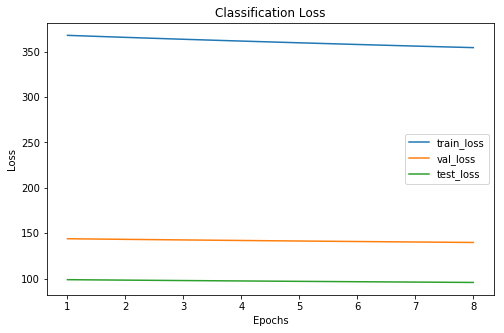

Cofusion Matrix For Val Set: 
--  --  --
12  23  10
14  34   7
12  10   8
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       95     38      29
 1      166     67      44
 2       66     25      15
xxxxxxxxxxxxxx epoch: 8 xxxxxxxxxxxxxx


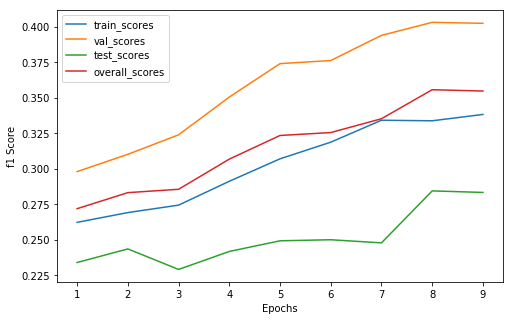

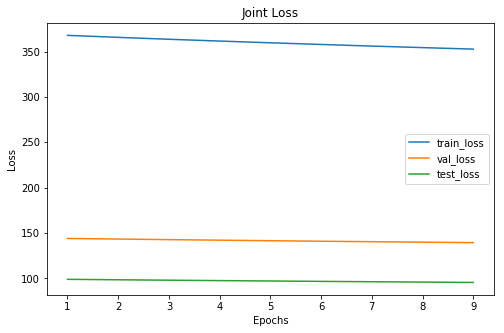

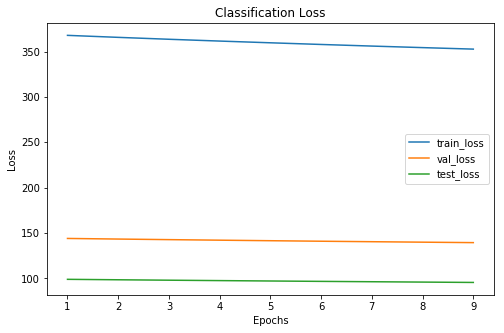

Cofusion Matrix For Val Set: 
--  --  -
12  24  9
14  34  7
12  10  8
--  --  -
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      100     38      28
 1      170     68      45
 2       57     24      15
xxxxxxxxxxxxxx epoch: 9 xxxxxxxxxxxxxx


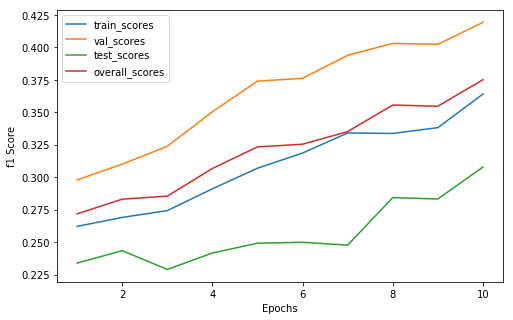

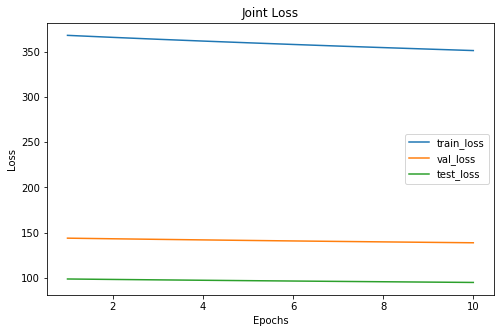

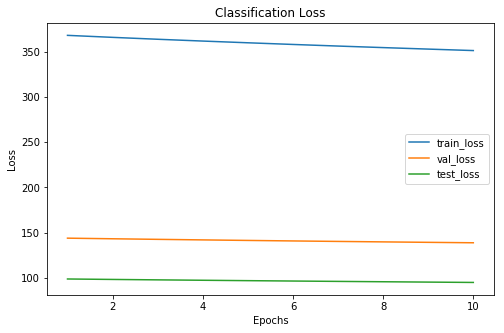

Cofusion Matrix For Val Set: 
--  --  -
13  24  8
14  34  7
11  10  9
--  --  -
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     38      30
 1      166     68      43
 2       55     24      15
xxxxxxxxxxxxxx epoch: 10 xxxxxxxxxxxxxx


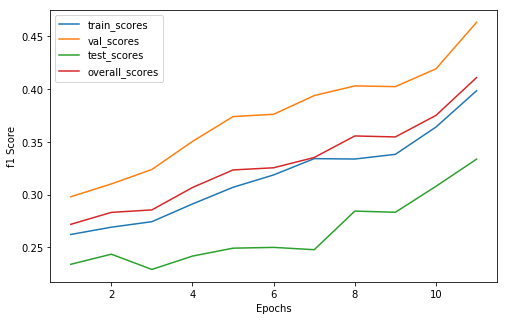

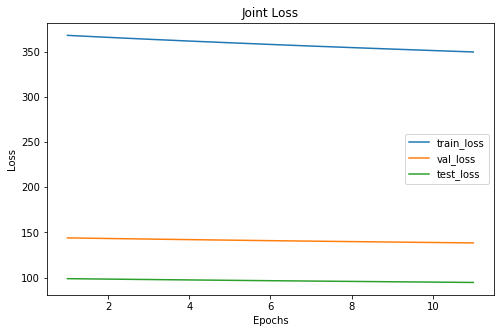

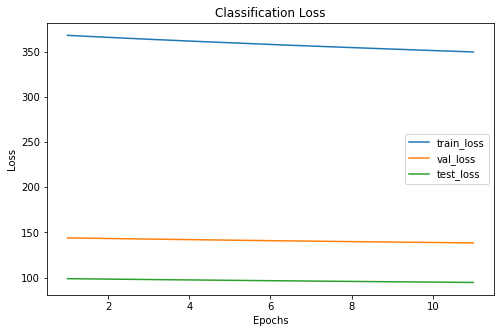

Cofusion Matrix For Val Set: 
--  --  --
18  21   6
15  33   7
10  10  10
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      107     43      30
 1      162     64      42
 2       58     23      16
xxxxxxxxxxxxxx epoch: 11 xxxxxxxxxxxxxx


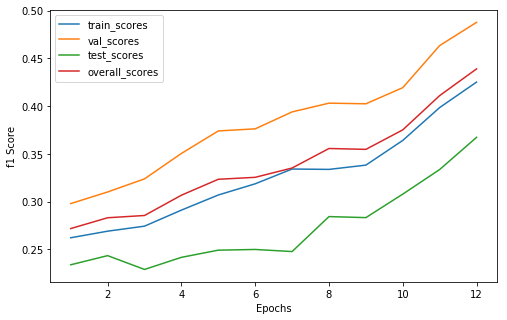

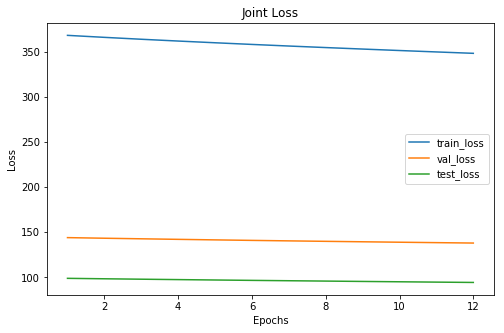

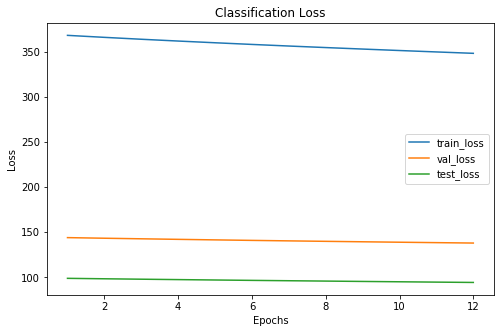

Cofusion Matrix For Val Set: 
--  --  --
20  22   3
13  33   9
 9  10  11
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     42      31
 1      156     65      41
 2       61     23      16
xxxxxxxxxxxxxx epoch: 12 xxxxxxxxxxxxxx


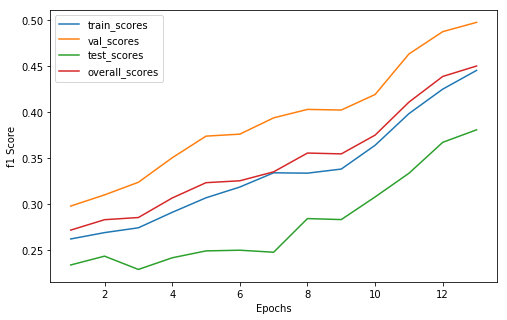

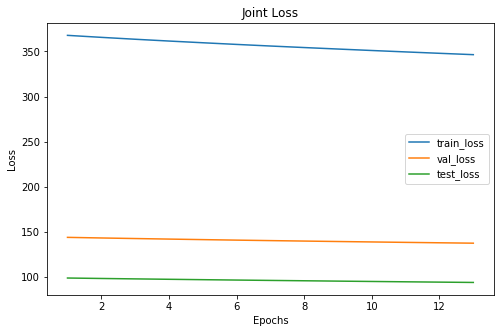

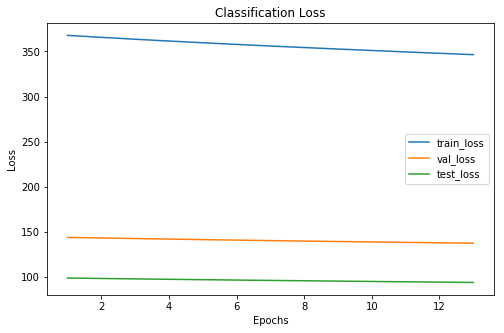

Cofusion Matrix For Val Set: 
--  --  --
20  23   2
14  32   9
 7  10  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      113     41      30
 1      152     65      41
 2       62     24      17
xxxxxxxxxxxxxx epoch: 13 xxxxxxxxxxxxxx


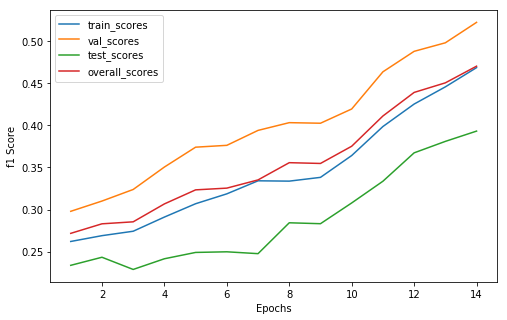

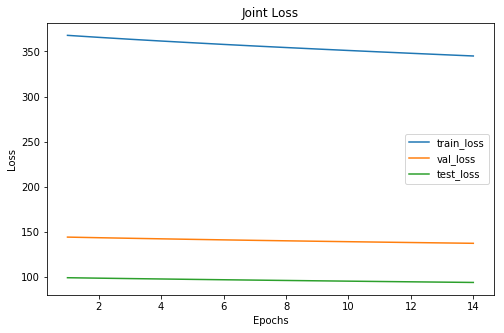

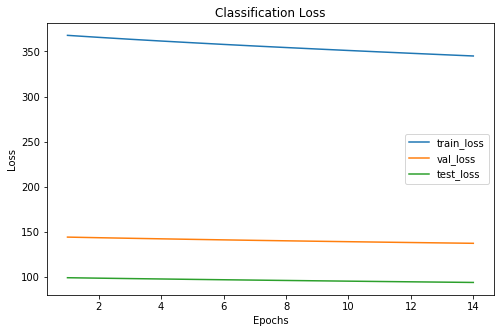

Cofusion Matrix For Val Set: 
--  --  --
22  21   2
12  32  11
 6  10  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     40      29
 1      151     63      41
 2       66     27      18
xxxxxxxxxxxxxx epoch: 14 xxxxxxxxxxxxxx


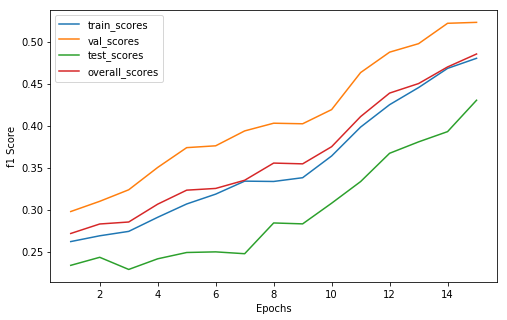

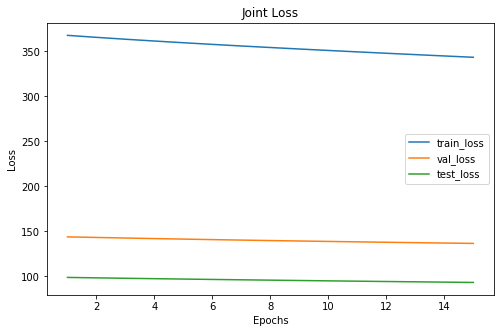

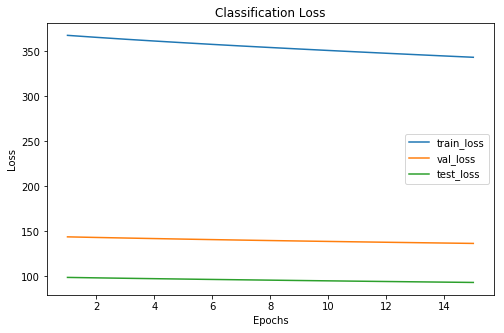

Cofusion Matrix For Val Set: 
--  --  --
24  19   2
13  30  12
 5  11  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     42      29
 1      146     60      39
 2       75     28      20
xxxxxxxxxxxxxx epoch: 15 xxxxxxxxxxxxxx


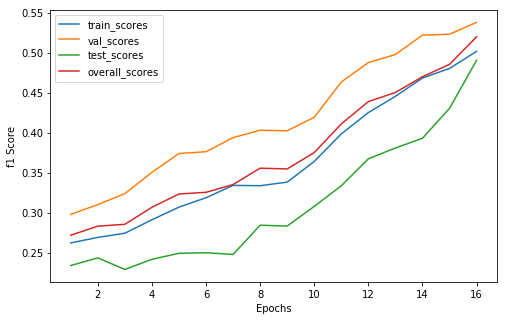

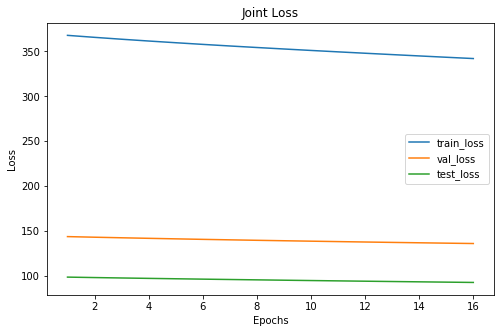

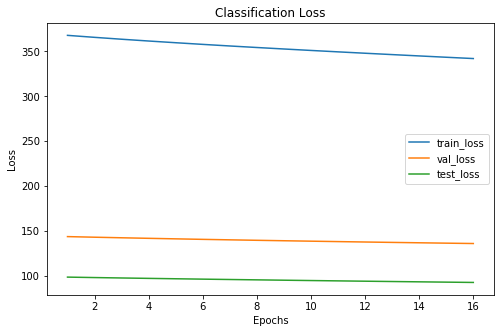

Cofusion Matrix For Val Set: 
--  --  --
26  17   2
14  30  11
 5  11  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     45      35
 1      143     58      37
 2       74     27      16
xxxxxxxxxxxxxx epoch: 16 xxxxxxxxxxxxxx


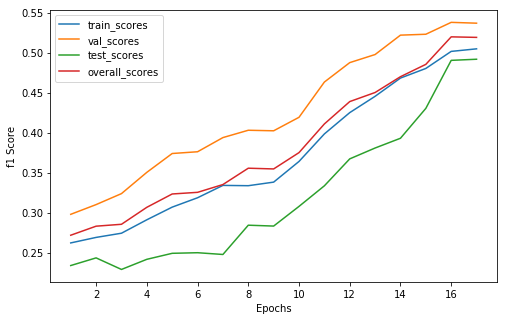

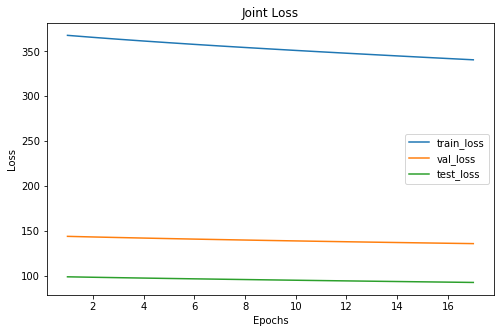

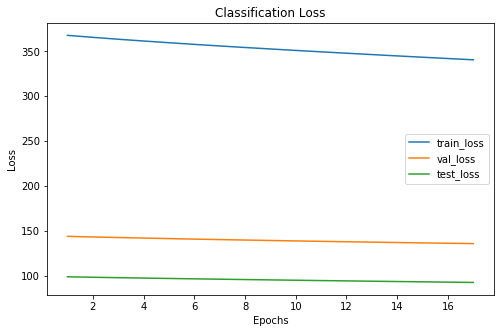

Cofusion Matrix For Val Set: 
--  --  --
27  16   2
14  30  11
 6  11  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     47      34
 1      140     57      37
 2       72     26      17
xxxxxxxxxxxxxx epoch: 17 xxxxxxxxxxxxxx


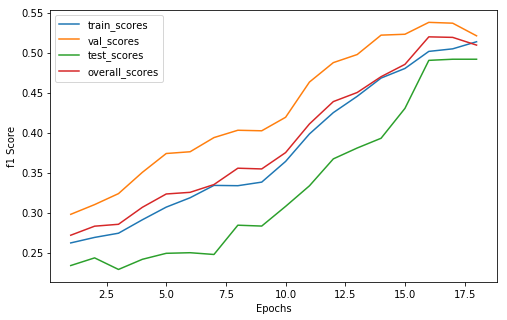

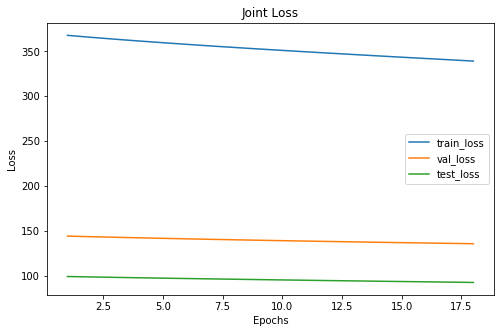

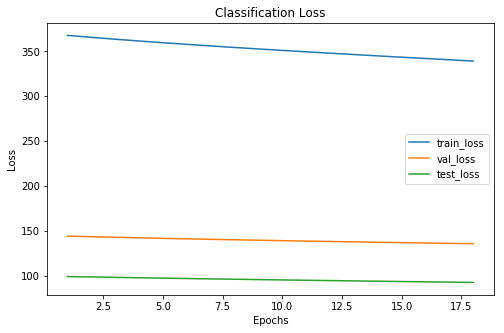

Cofusion Matrix For Val Set: 
--  --  --
27  16   2
17  28  10
 7  10  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      119     51      34
 1      138     54      37
 2       70     25      17
xxxxxxxxxxxxxx epoch: 18 xxxxxxxxxxxxxx


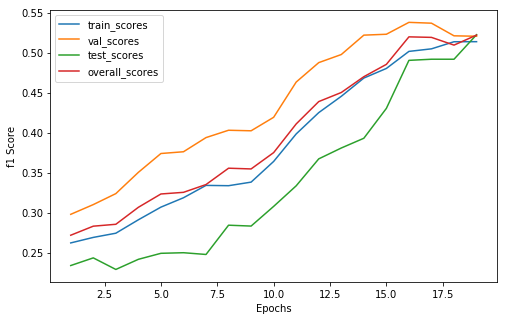

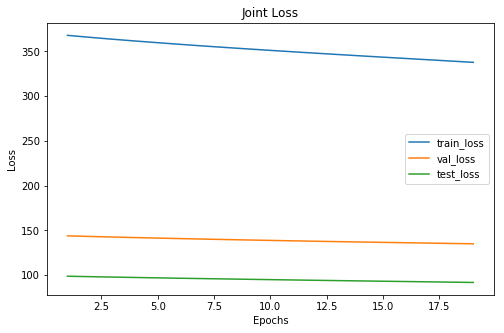

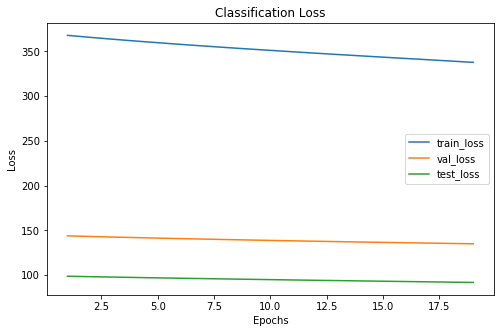

Cofusion Matrix For Val Set: 
--  --  --
27  16   2
15  29  11
 7  11  12
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      121     49      35
 1      138     56      37
 2       68     25      16
xxxxxxxxxxxxxx epoch: 19 xxxxxxxxxxxxxx


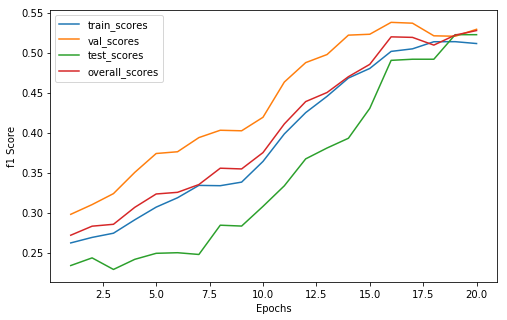

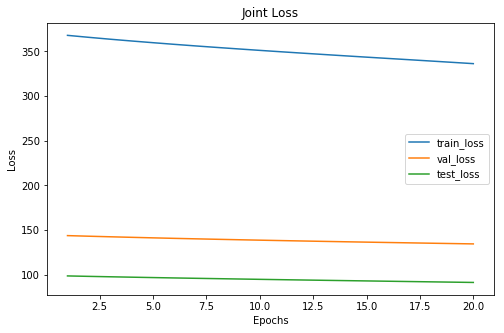

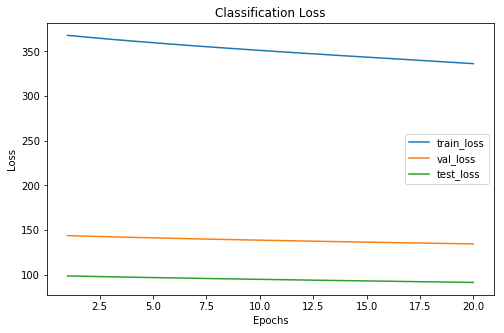

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
15  29  11
 6  11  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      121     48      35
 1      137     55      37
 2       69     27      16
xxxxxxxxxxxxxx epoch: 20 xxxxxxxxxxxxxx


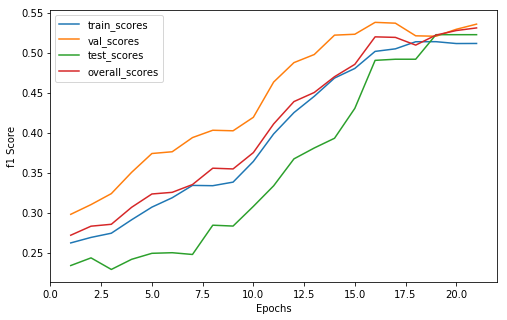

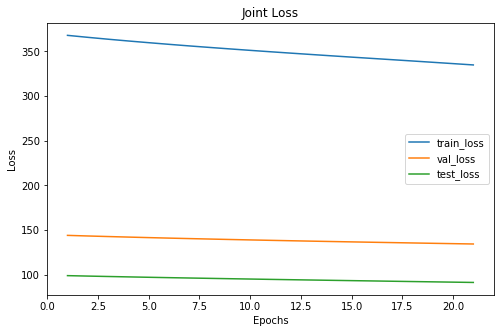

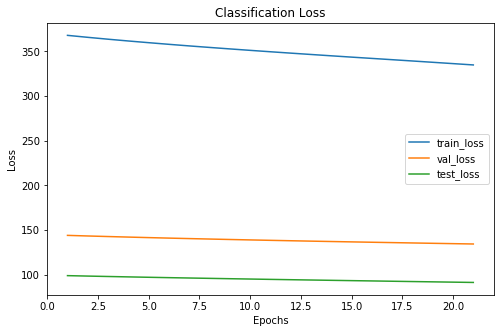

Cofusion Matrix For Val Set: 
--  --  --
28  15   2
14  30  11
 6  12  12
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      122     48      35
 1      137     57      37
 2       68     25      16
xxxxxxxxxxxxxx epoch: 21 xxxxxxxxxxxxxx


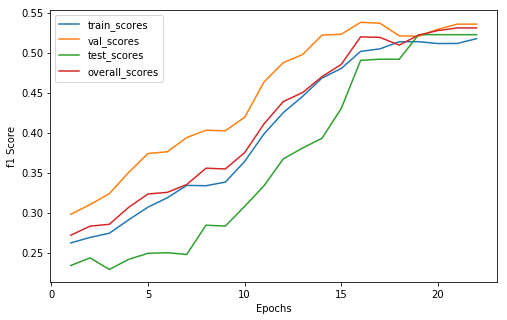

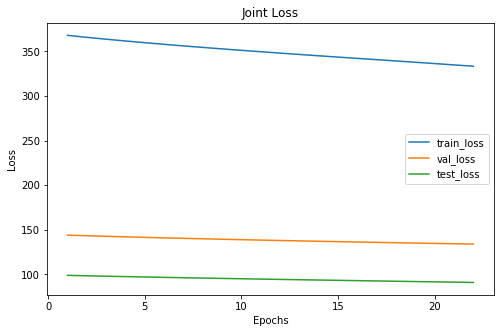

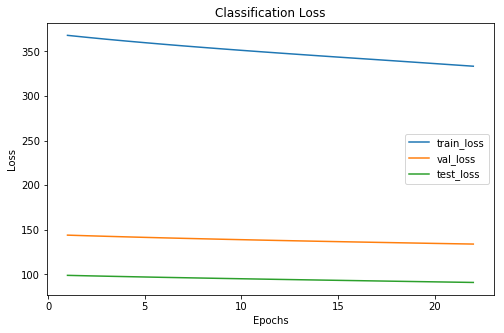

Cofusion Matrix For Val Set: 
--  --  --
28  15   2
14  30  11
 6  12  12
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      124     48      35
 1      137     57      37
 2       66     25      16
xxxxxxxxxxxxxx epoch: 22 xxxxxxxxxxxxxx


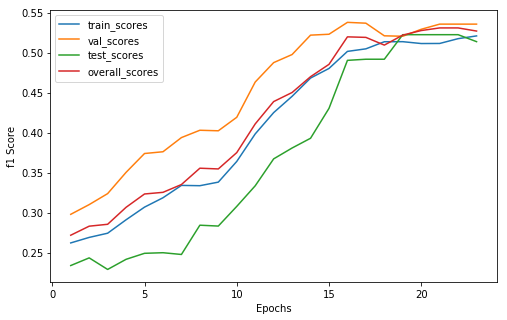

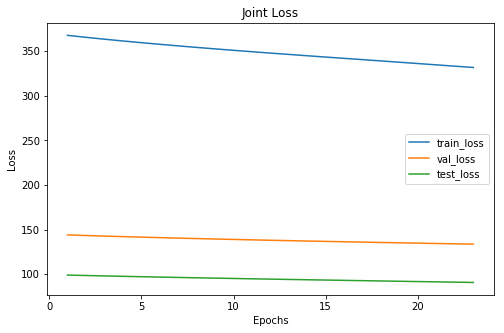

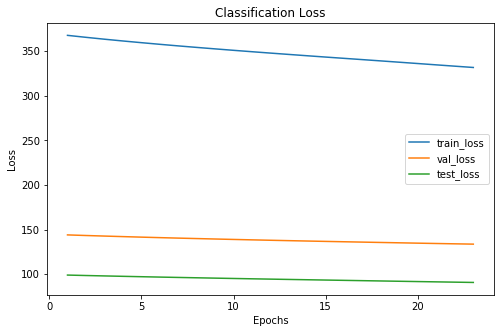

Cofusion Matrix For Val Set: 
--  --  --
28  15   2
14  30  11
 6  12  12
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      123     48      34
 1      137     57      37
 2       67     25      17
xxxxxxxxxxxxxx epoch: 23 xxxxxxxxxxxxxx


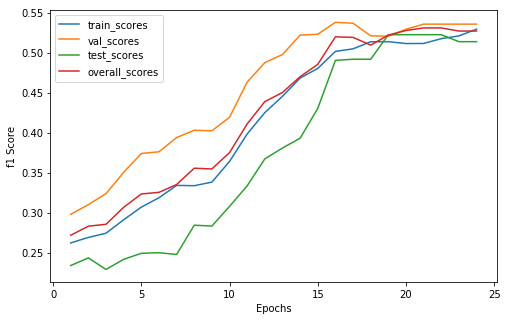

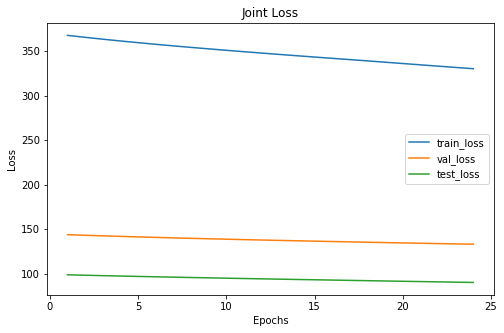

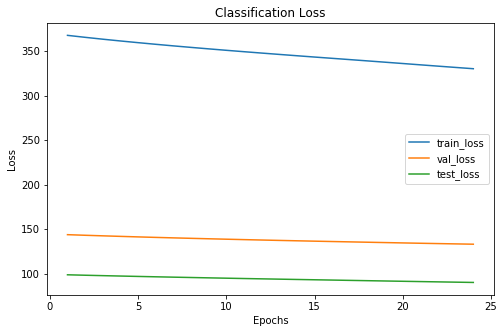

Cofusion Matrix For Val Set: 
--  --  --
28  15   2
14  30  11
 6  12  12
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      119     48      34
 1      141     57      37
 2       67     25      17
xxxxxxxxxxxxxx epoch: 24 xxxxxxxxxxxxxx


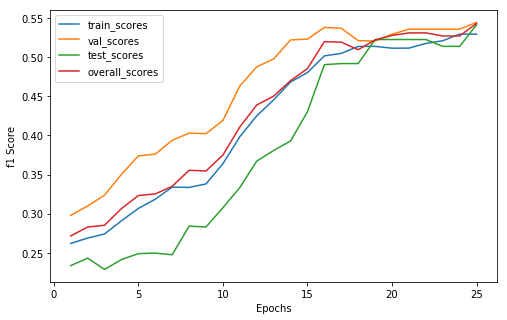

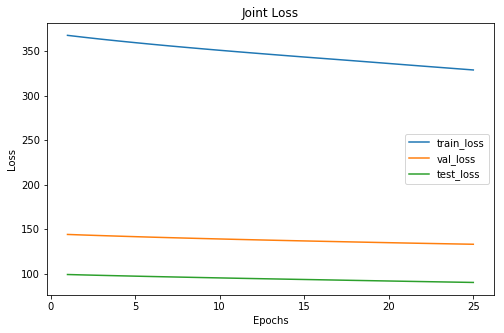

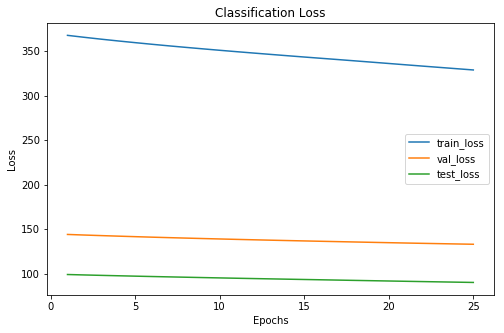

Cofusion Matrix For Val Set: 
--  --  --
28  15   2
14  30  11
 5  12  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      118     47      32
 1      142     57      37
 2       67     26      19
xxxxxxxxxxxxxx epoch: 25 xxxxxxxxxxxxxx


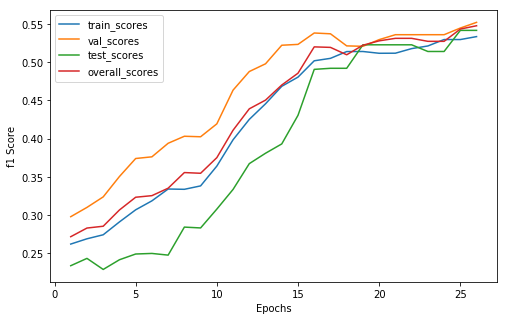

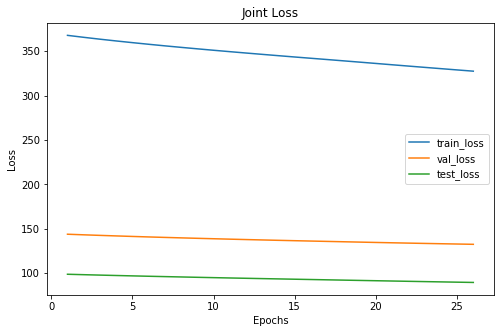

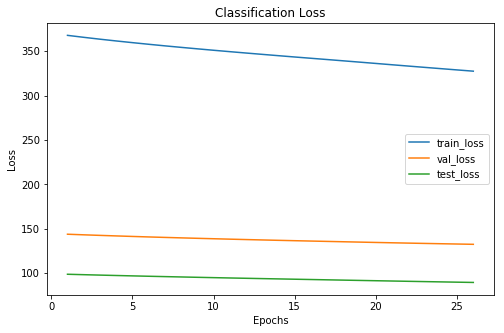

Cofusion Matrix For Val Set: 
--  --  --
28  15   2
14  31  10
 5  12  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     47      32
 1      144     58      37
 2       69     25      19
xxxxxxxxxxxxxx epoch: 26 xxxxxxxxxxxxxx


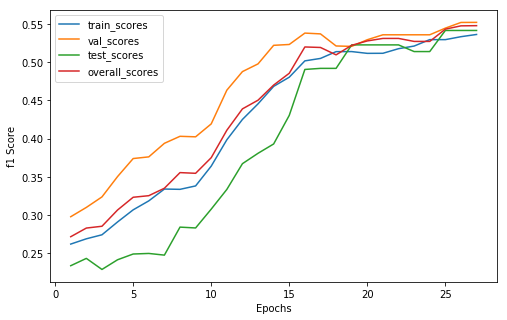

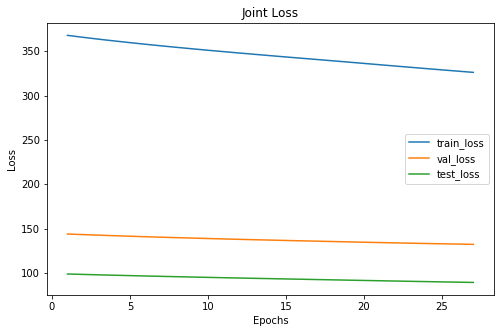

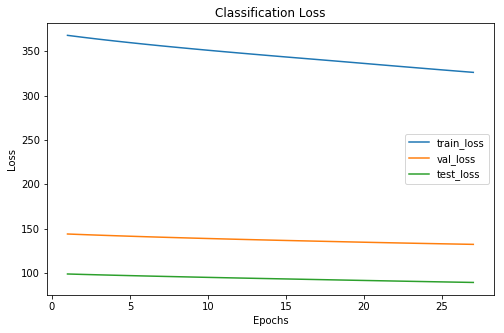

Cofusion Matrix For Val Set: 
--  --  --
28  14   3
14  31  10
 5  12  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     47      32
 1      145     57      37
 2       68     26      19
xxxxxxxxxxxxxx epoch: 27 xxxxxxxxxxxxxx


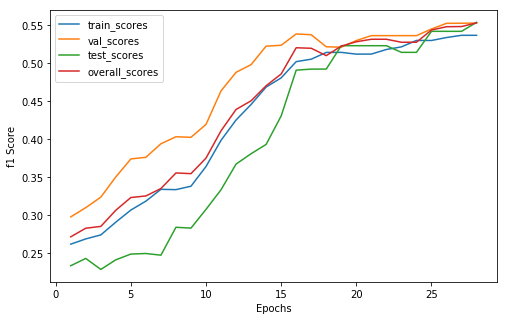

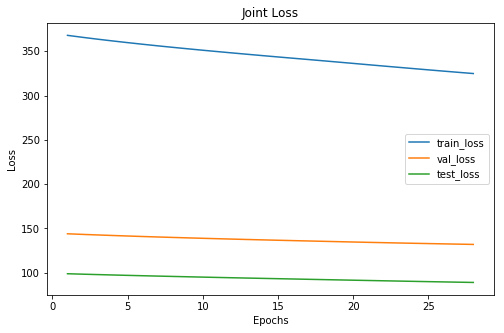

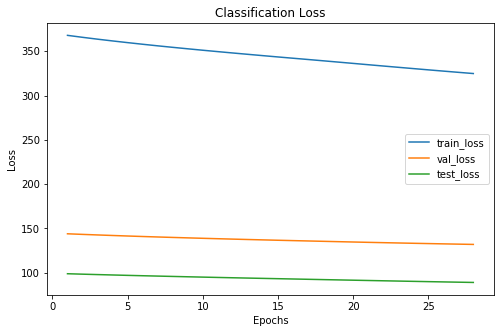

Cofusion Matrix For Val Set: 
--  --  --
28  14   3
14  31  10
 4  13  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     46      31
 1      145     58      38
 2       68     26      19
xxxxxxxxxxxxxx epoch: 28 xxxxxxxxxxxxxx


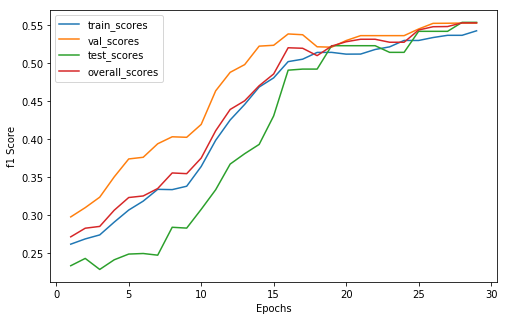

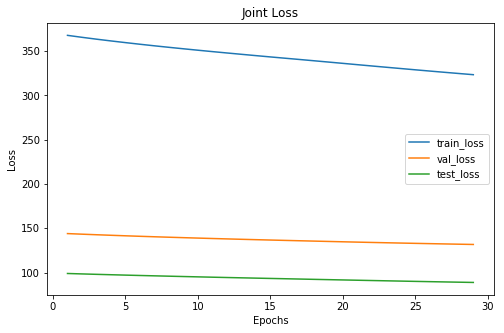

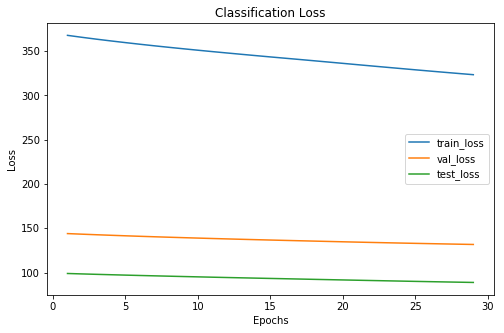

Cofusion Matrix For Val Set: 
--  --  --
28  14   3
14  31  10
 4  13  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     46      31
 1      145     58      38
 2       67     26      19
xxxxxxxxxxxxxx epoch: 29 xxxxxxxxxxxxxx


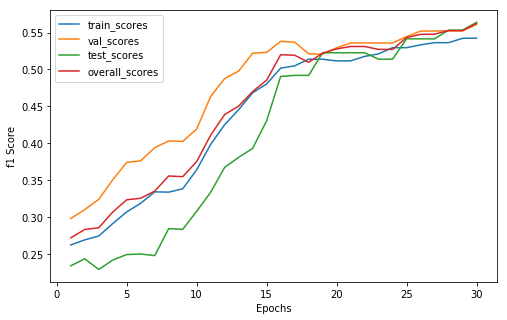

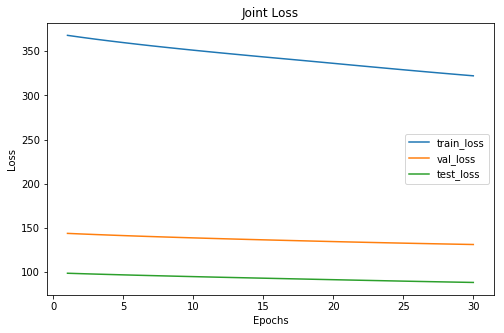

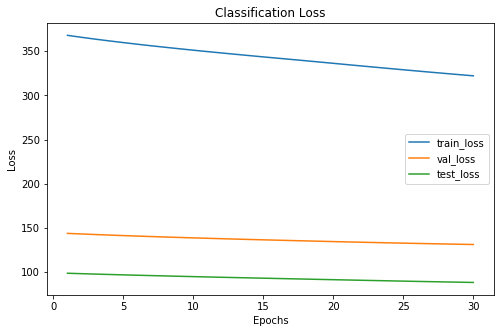

Cofusion Matrix For Val Set: 
--  --  --
28  14   3
14  31  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     45      32
 1      146     58      37
 2       69     27      19
xxxxxxxxxxxxxx epoch: 30 xxxxxxxxxxxxxx


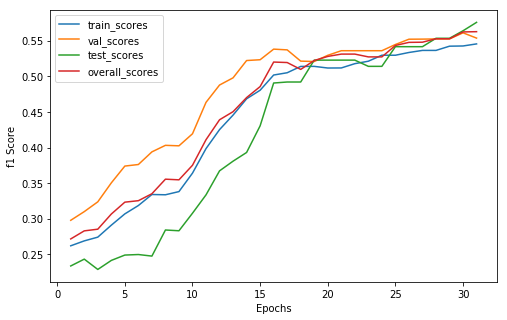

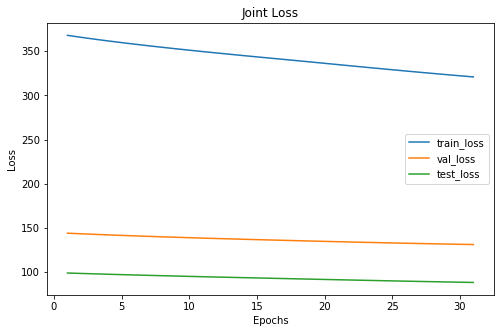

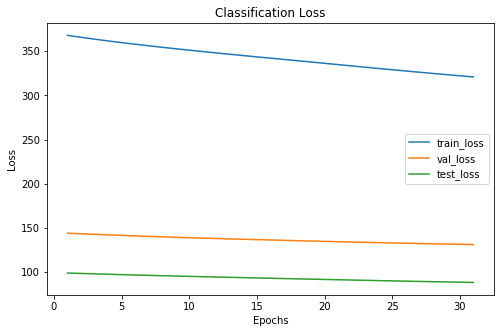

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
14  31  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     44      31
 1      147     59      38
 2       68     27      19
xxxxxxxxxxxxxx epoch: 31 xxxxxxxxxxxxxx


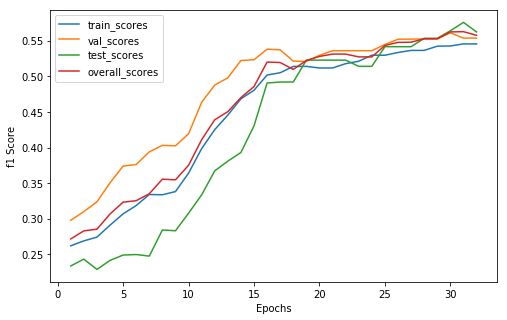

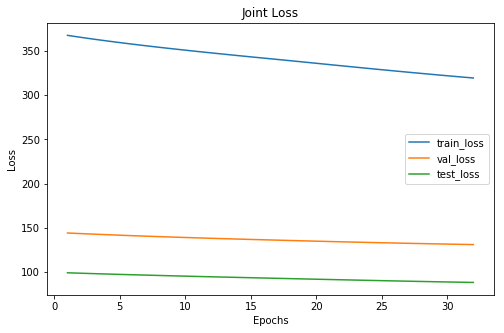

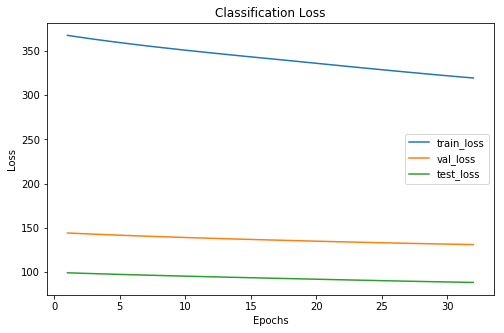

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
14  31  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     44      31
 1      147     59      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 32 xxxxxxxxxxxxxx


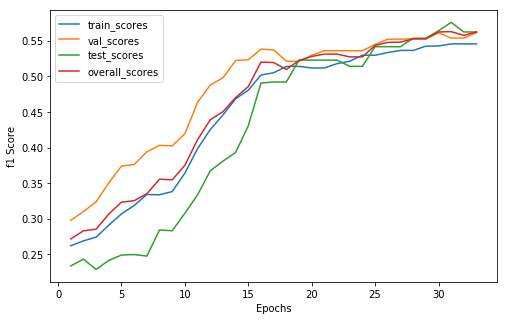

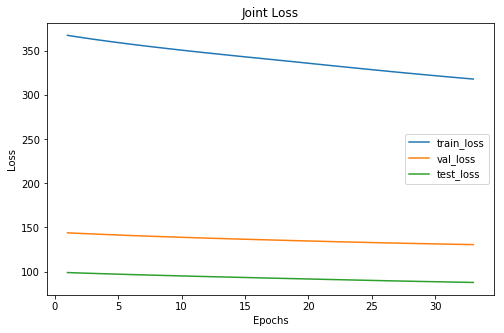

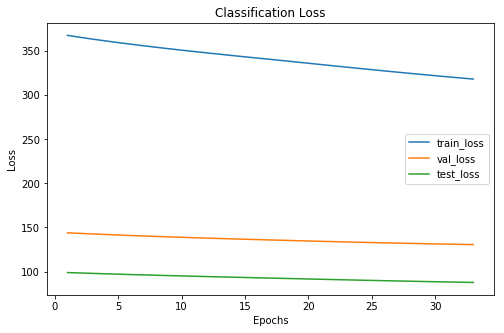

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     43      31
 1      147     60      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 33 xxxxxxxxxxxxxx


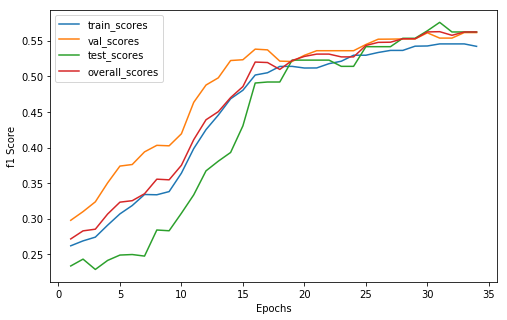

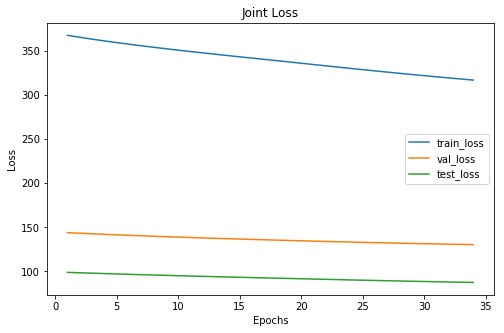

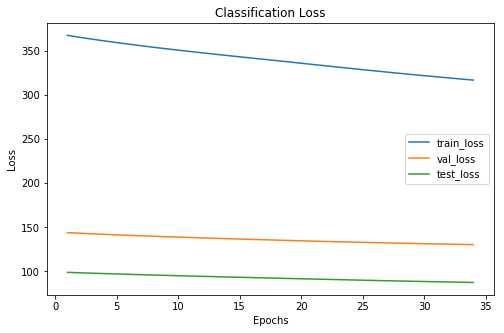

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     43      31
 1      148     60      39
 2       67     27      18
xxxxxxxxxxxxxx epoch: 34 xxxxxxxxxxxxxx


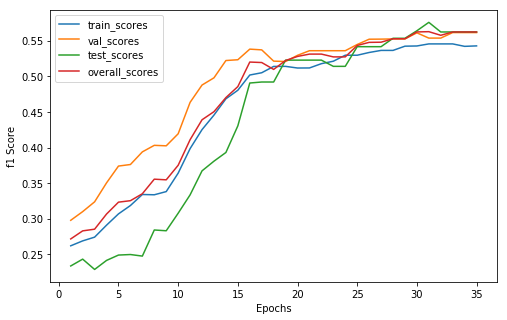

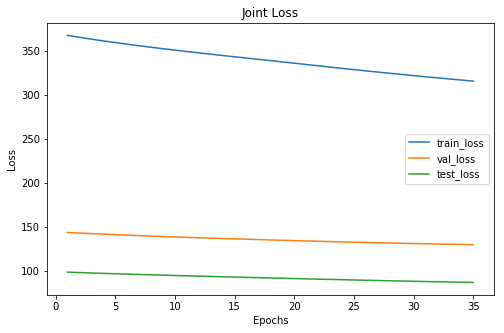

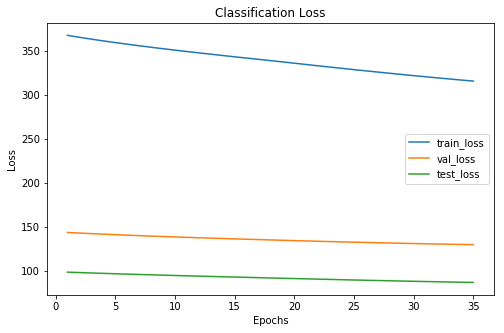

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     43      31
 1      147     60      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 35 xxxxxxxxxxxxxx


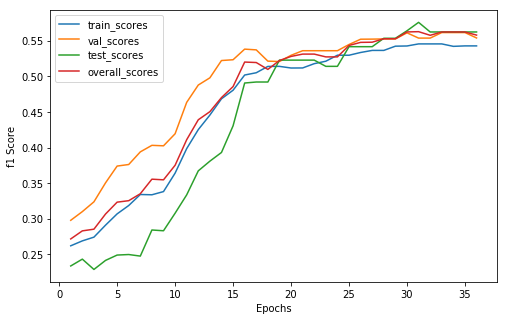

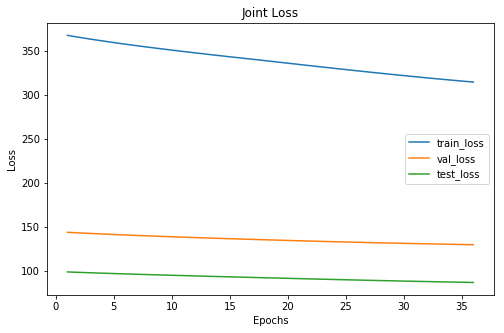

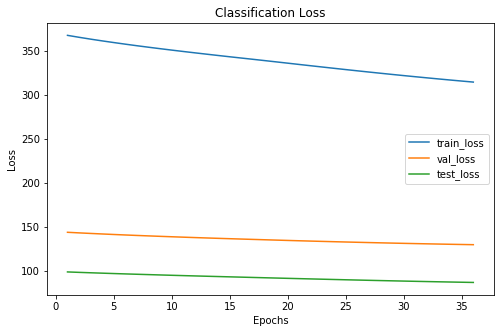

Cofusion Matrix For Val Set: 
--  --  --
26  16   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     42      31
 1      147     61      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 36 xxxxxxxxxxxxxx


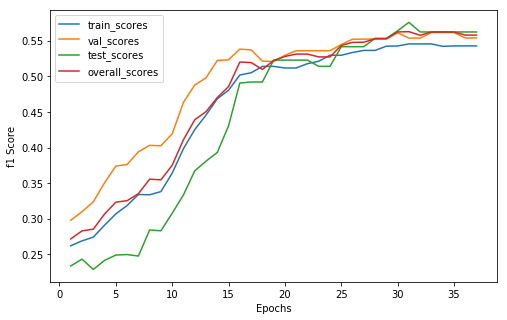

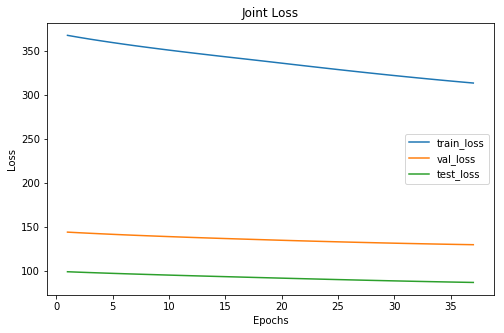

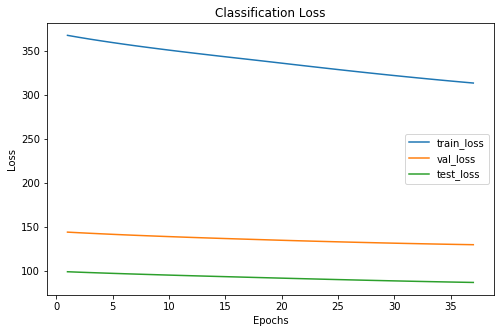

Cofusion Matrix For Val Set: 
--  --  --
26  16   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     42      31
 1      147     61      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 37 xxxxxxxxxxxxxx


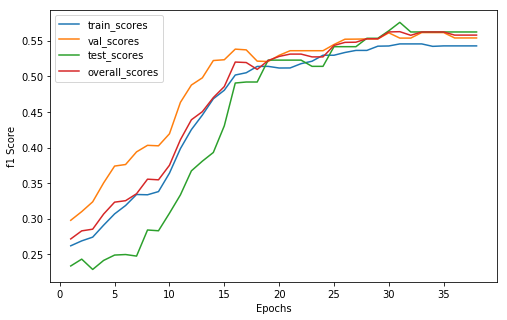

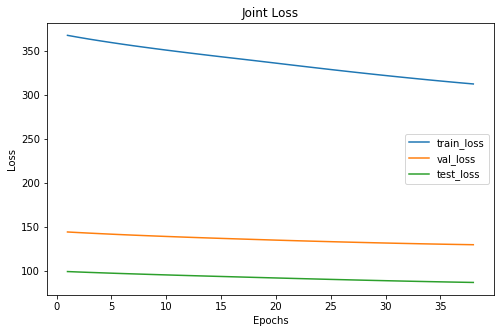

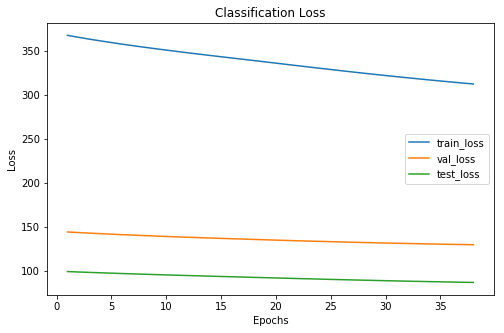

Cofusion Matrix For Val Set: 
--  --  --
26  16   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     42      31
 1      147     61      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 38 xxxxxxxxxxxxxx


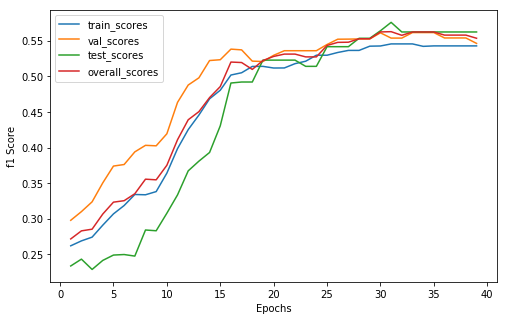

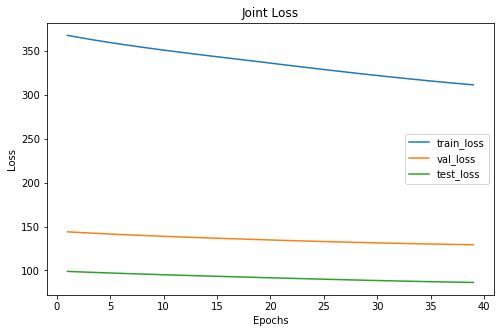

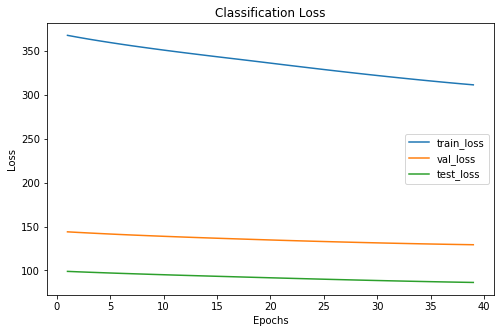

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      113     41      31
 1      146     62      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 39 xxxxxxxxxxxxxx


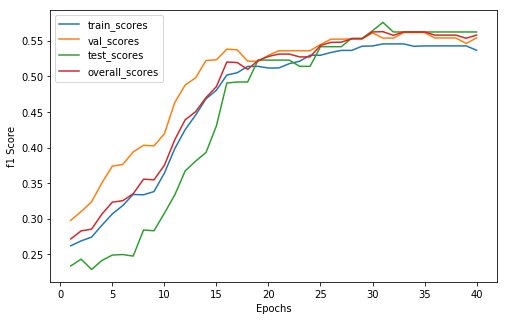

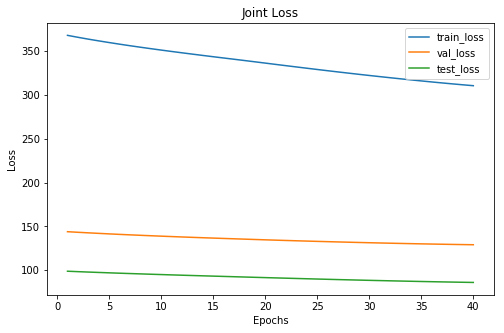

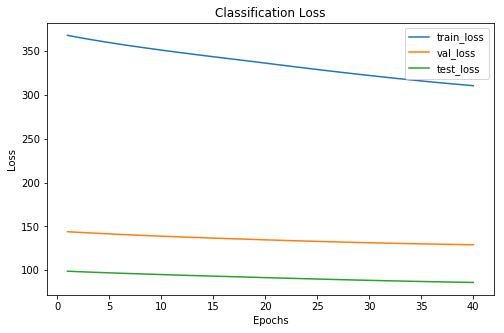

Cofusion Matrix For Val Set: 
--  --  --
26  16   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     42      31
 1      148     61      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 40 xxxxxxxxxxxxxx


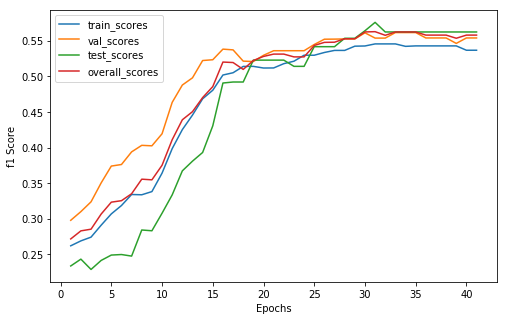

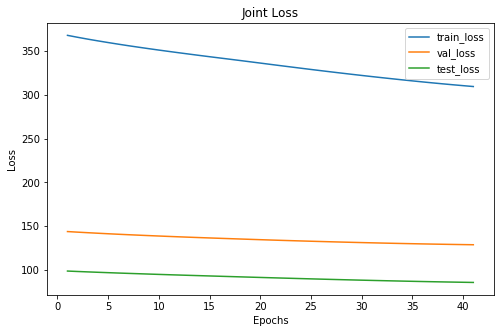

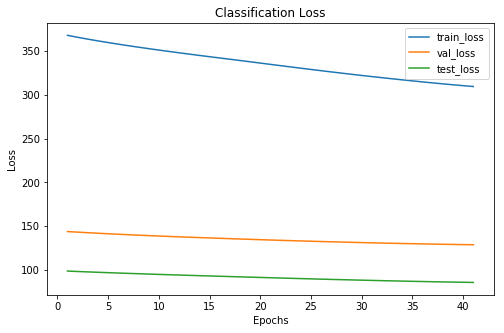

Cofusion Matrix For Val Set: 
--  --  --
26  16   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     42      31
 1      147     61      39
 2       68     27      18
xxxxxxxxxxxxxx epoch: 41 xxxxxxxxxxxxxx


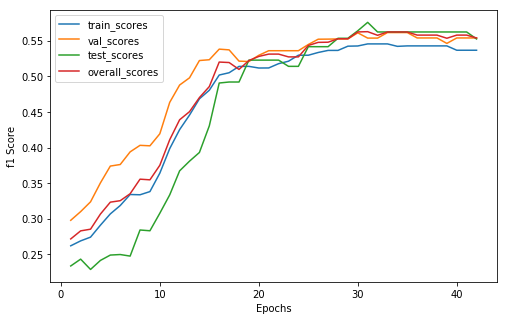

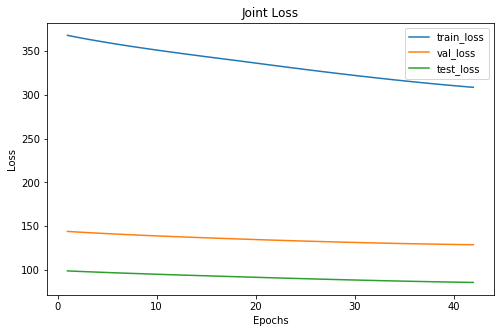

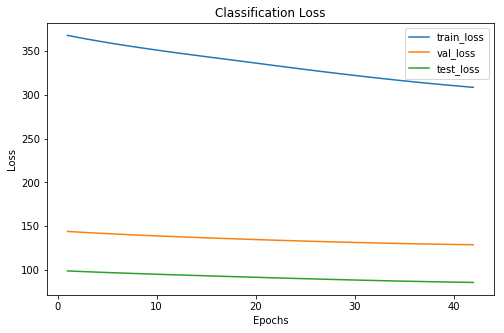

Cofusion Matrix For Val Set: 
--  --  --
26  16   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     42      32
 1      147     61      37
 2       68     27      19
xxxxxxxxxxxxxx epoch: 42 xxxxxxxxxxxxxx


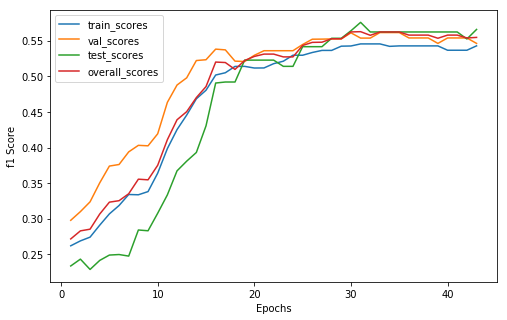

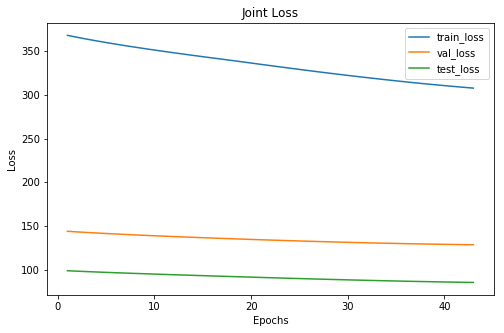

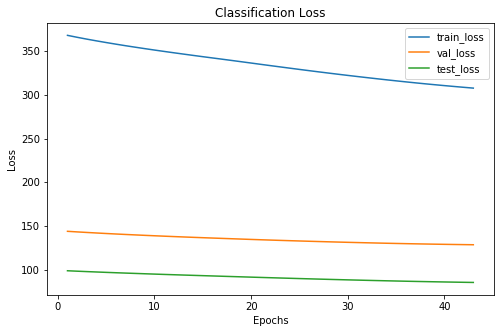

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     41      31
 1      148     62      37
 2       69     27      20
xxxxxxxxxxxxxx epoch: 43 xxxxxxxxxxxxxx


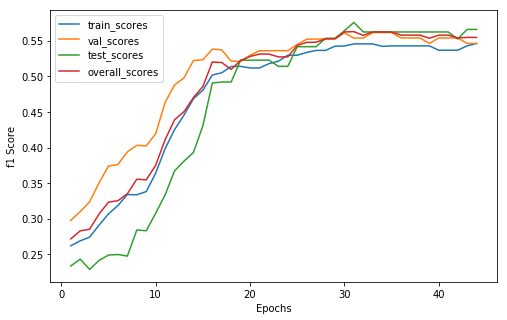

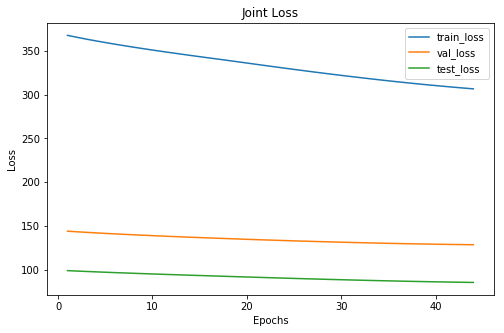

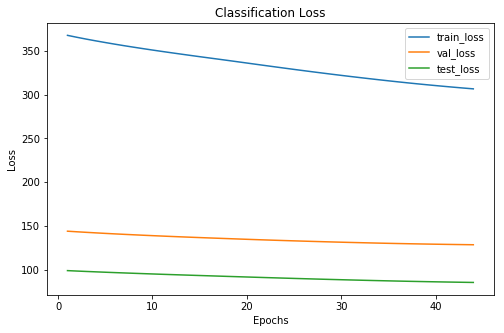

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
13  32  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      109     41      31
 1      148     62      37
 2       70     27      20
xxxxxxxxxxxxxx epoch: 44 xxxxxxxxxxxxxx


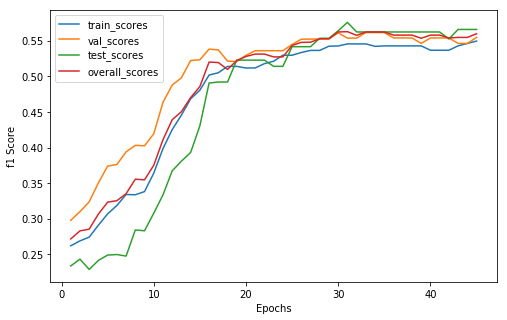

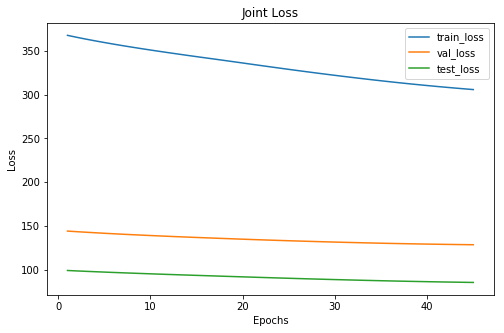

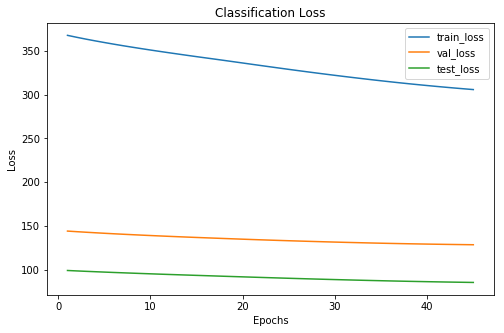

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
13  32  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     40      31
 1      148     62      37
 2       71     28      20
xxxxxxxxxxxxxx epoch: 45 xxxxxxxxxxxxxx


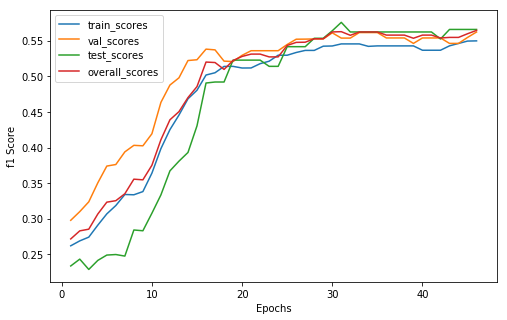

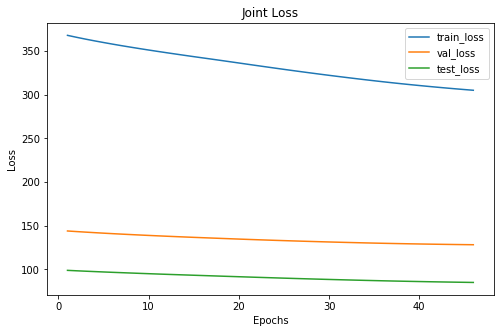

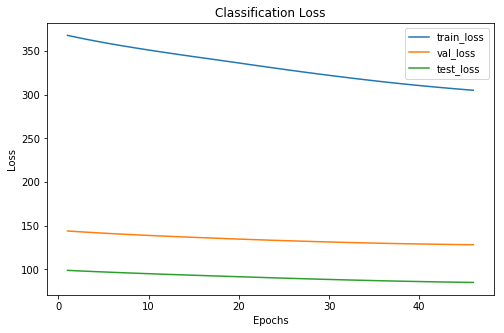

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
12  33  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     39      31
 1      146     63      37
 2       71     28      20
xxxxxxxxxxxxxx epoch: 46 xxxxxxxxxxxxxx


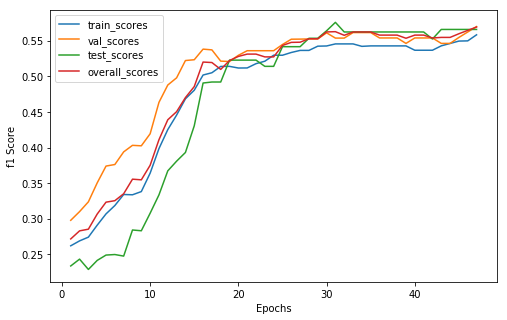

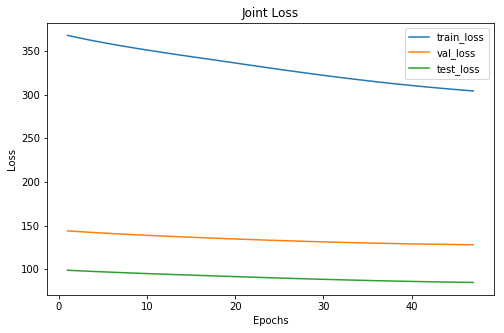

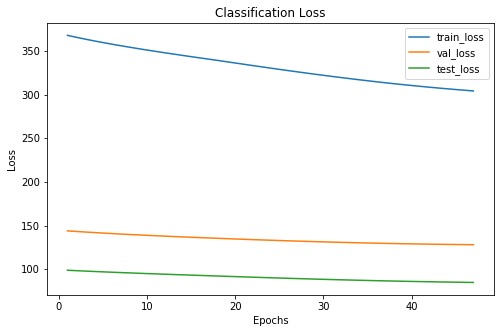

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
11  34  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     38      31
 1      149     64      37
 2       70     28      20
xxxxxxxxxxxxxx epoch: 47 xxxxxxxxxxxxxx


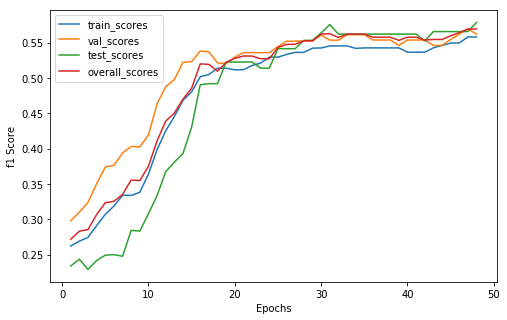

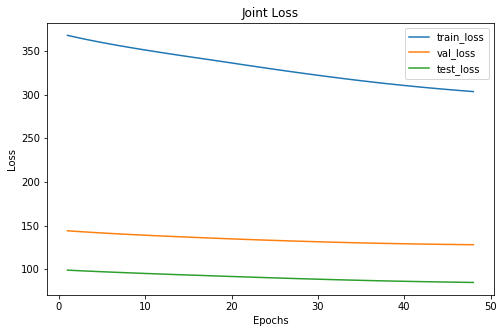

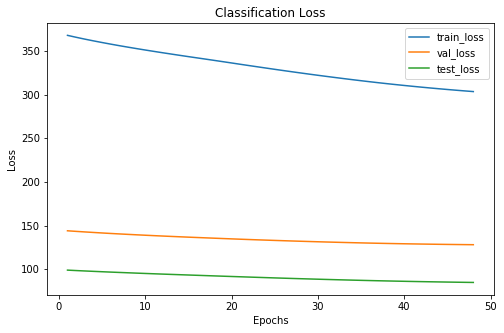

Cofusion Matrix For Val Set: 
--  --  --
25  17   3
12  33  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     39      30
 1      148     63      37
 2       71     28      21
xxxxxxxxxxxxxx epoch: 48 xxxxxxxxxxxxxx


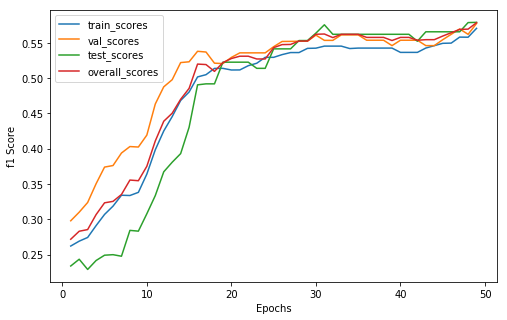

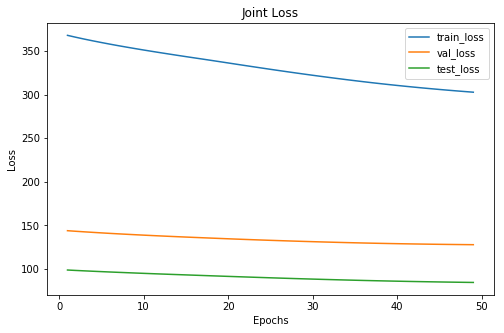

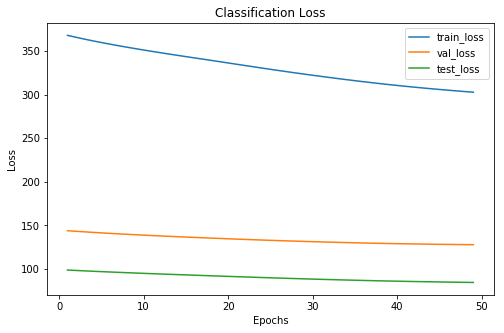

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
12  33  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     41      30
 1      145     61      36
 2       72     28      22
xxxxxxxxxxxxxx epoch: 49 xxxxxxxxxxxxxx


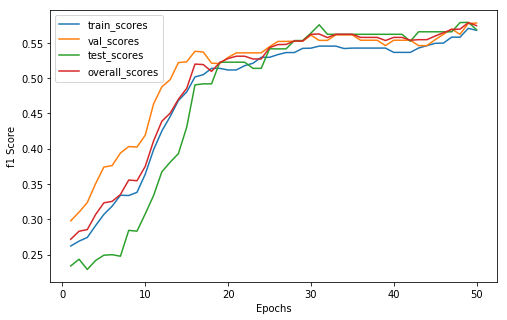

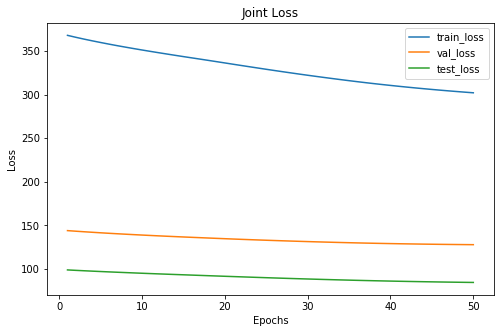

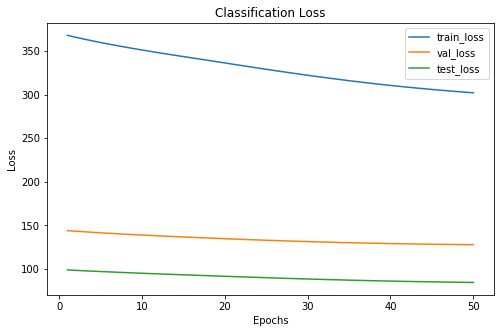

Cofusion Matrix For Val Set: 
--  --  --
27  15   3
13  32  10
 1  13  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     41      29
 1      144     60      37
 2       72     29      22
xxxxxxxxxxxxxx epoch: 50 xxxxxxxxxxxxxx


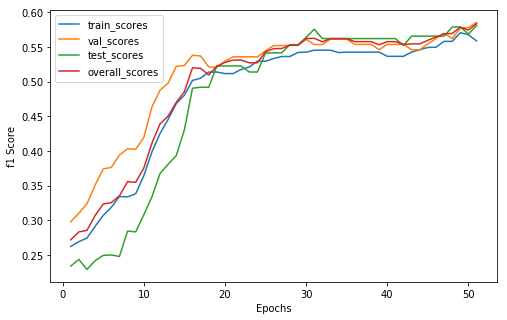

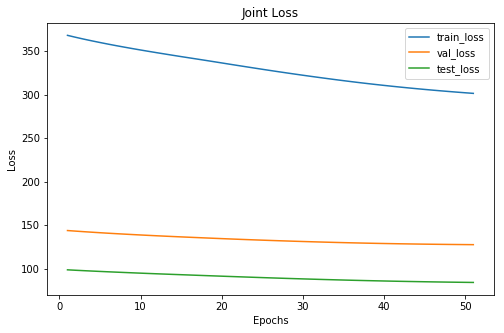

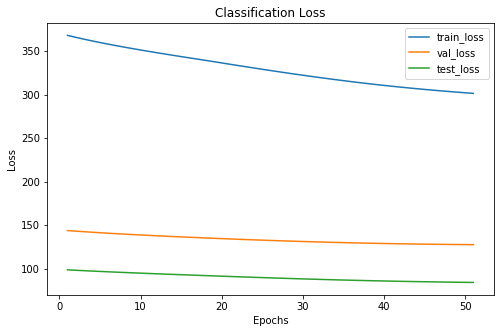

Cofusion Matrix For Val Set: 
--  --  --
28  14   3
13  32  10
 1  13  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     42      28
 1      144     59      38
 2       73     29      22
xxxxxxxxxxxxxx epoch: 51 xxxxxxxxxxxxxx


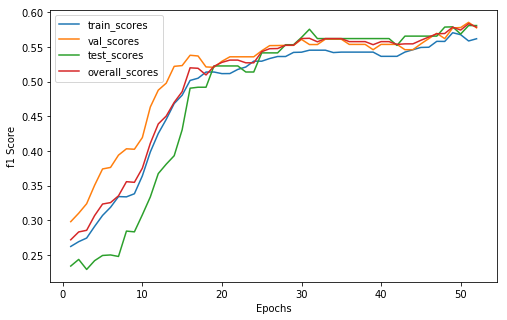

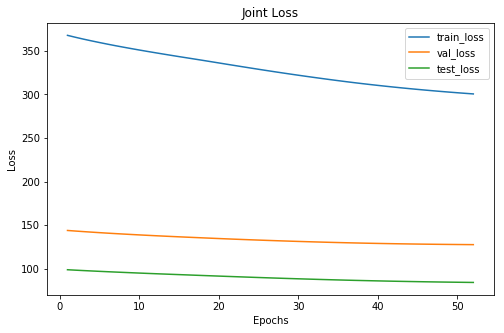

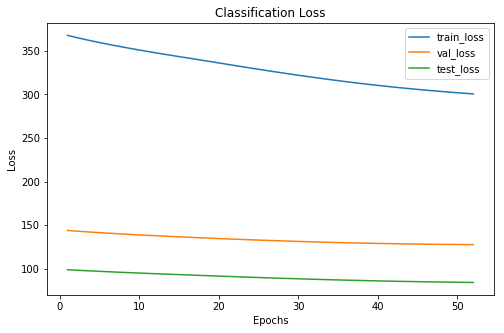

Cofusion Matrix For Val Set: 
--  --  --
28  14   3
14  31  10
 1  13  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     43      28
 1      144     58      38
 2       72     29      22
xxxxxxxxxxxxxx epoch: 52 xxxxxxxxxxxxxx


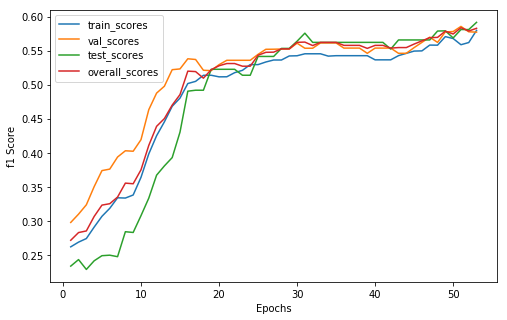

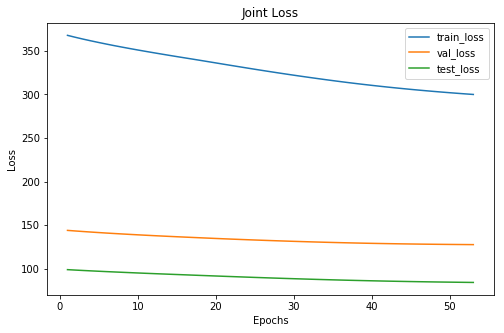

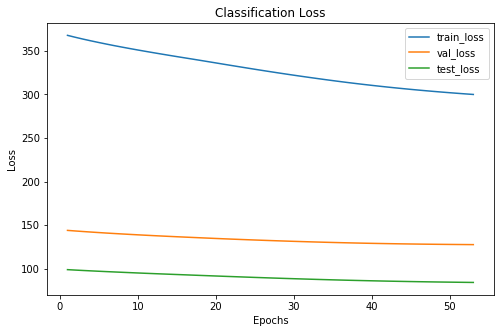

Cofusion Matrix For Val Set: 
--  --  --
29  13   3
14  31  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      113     44      29
 1      142     58      37
 2       72     28      22
xxxxxxxxxxxxxx epoch: 53 xxxxxxxxxxxxxx


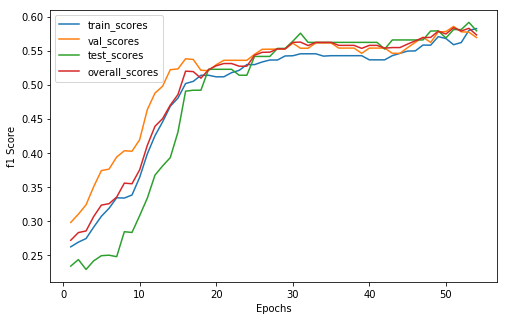

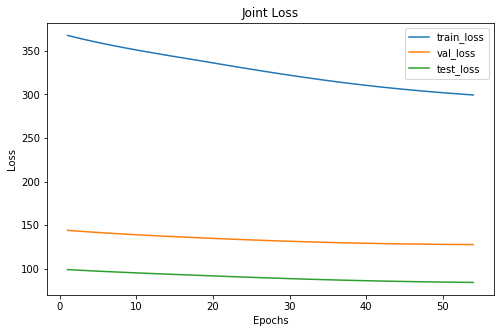

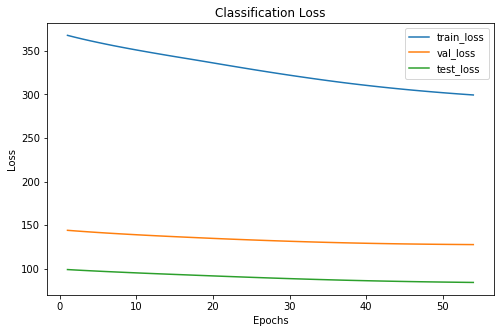

Cofusion Matrix For Val Set: 
--  --  --
29  13   3
15  30  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     45      30
 1      141     57      36
 2       71     28      22
xxxxxxxxxxxxxx epoch: 54 xxxxxxxxxxxxxx


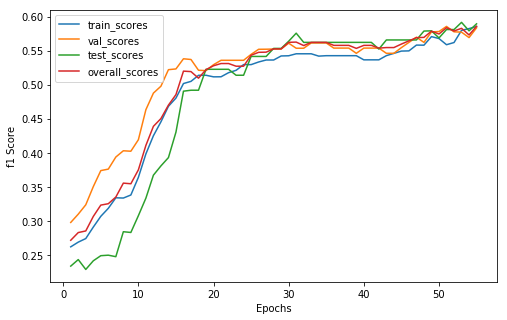

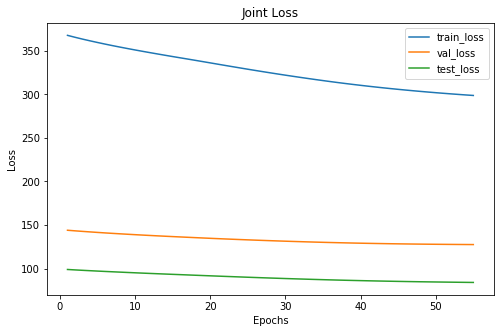

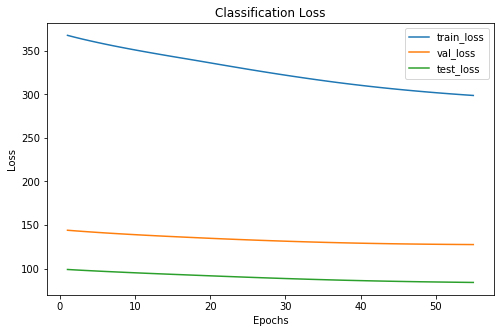

Cofusion Matrix For Val Set: 
--  --  --
31  11   3
15  30  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      116     47      31
 1      140     55      35
 2       71     28      22
xxxxxxxxxxxxxx epoch: 55 xxxxxxxxxxxxxx


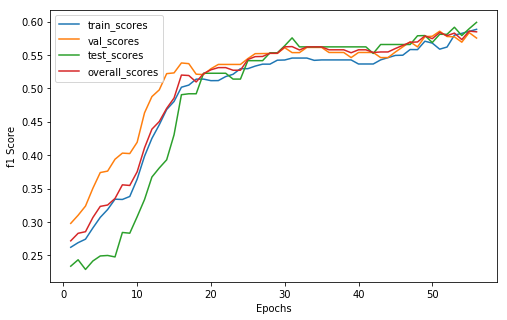

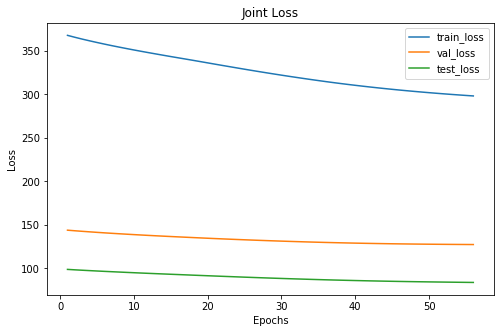

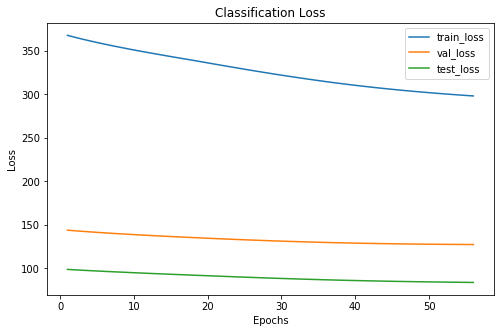

Cofusion Matrix For Val Set: 
--  --  --
31  11   3
16  29  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      119     48      33
 1      137     54      33
 2       71     28      22
xxxxxxxxxxxxxx epoch: 56 xxxxxxxxxxxxxx


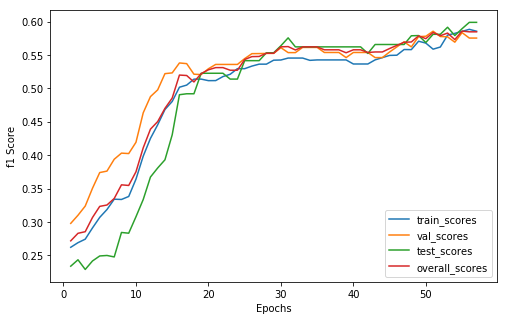

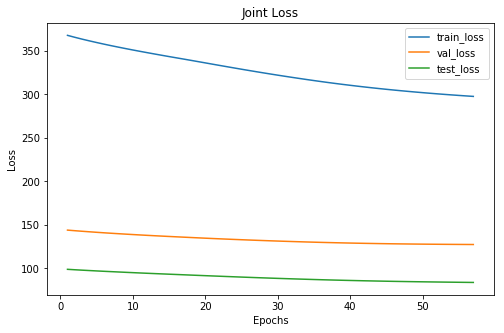

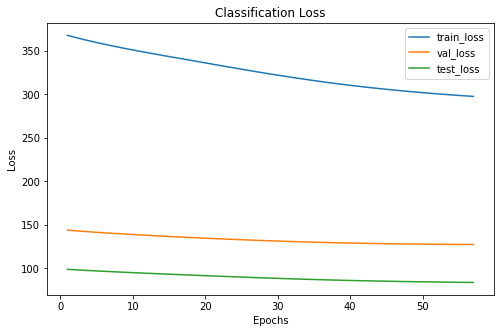

Cofusion Matrix For Val Set: 
--  --  --
31  11   3
16  29  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      125     48      33
 1      132     54      33
 2       70     28      22
xxxxxxxxxxxxxx epoch: 57 xxxxxxxxxxxxxx


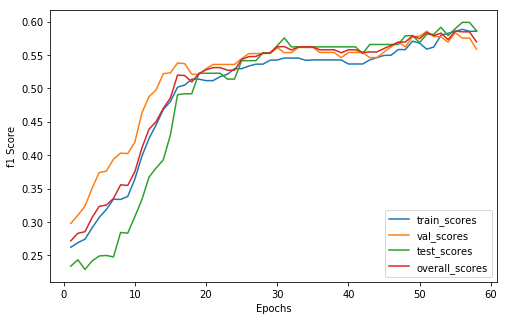

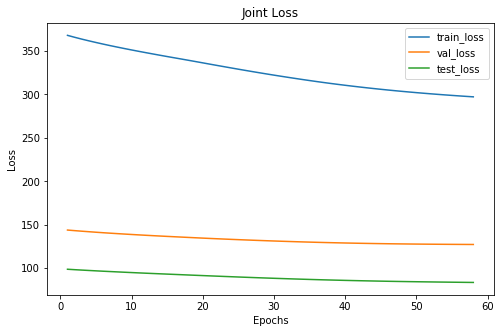

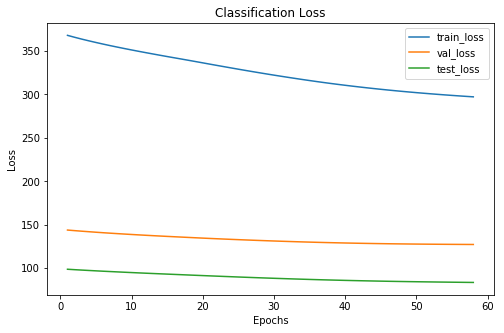

Cofusion Matrix For Val Set: 
--  --  --
31  11   3
18  27  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     50      34
 1      130     52      32
 2       70     28      22
xxxxxxxxxxxxxx epoch: 58 xxxxxxxxxxxxxx


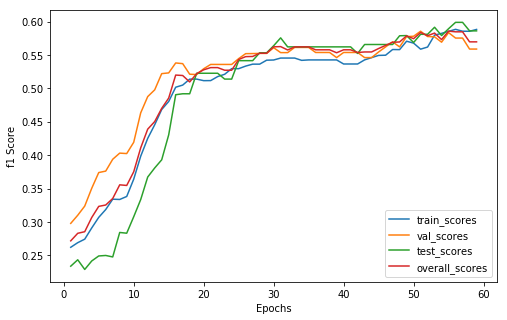

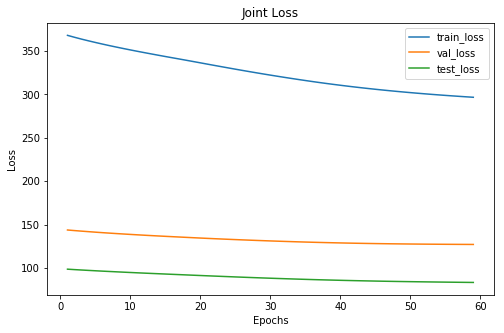

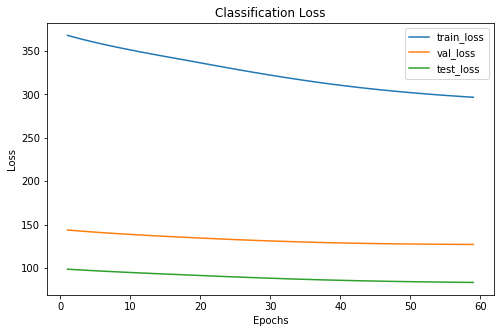

Cofusion Matrix For Val Set: 
--  --  --
31  11   3
18  27  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     50      34
 1      127     52      32
 2       70     28      22
xxxxxxxxxxxxxx epoch: 59 xxxxxxxxxxxxxx


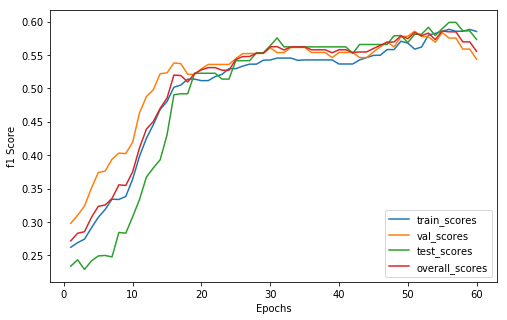

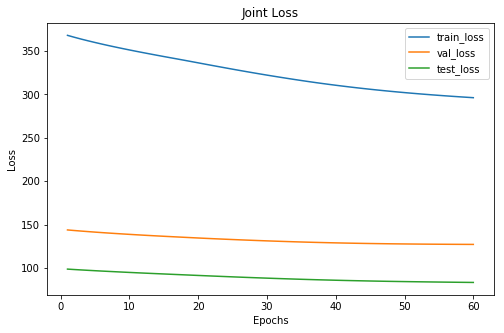

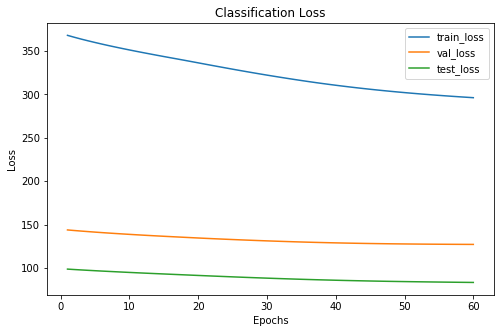

Cofusion Matrix For Val Set: 
--  --  --
30  11   4
19  26  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     50      35
 1      128     51      31
 2       71     29      22
xxxxxxxxxxxxxx epoch: 60 xxxxxxxxxxxxxx


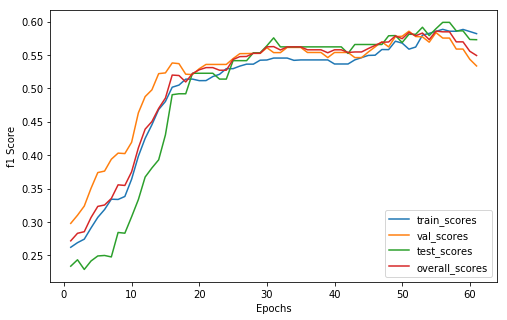

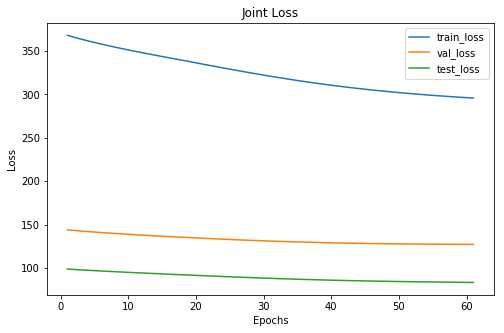

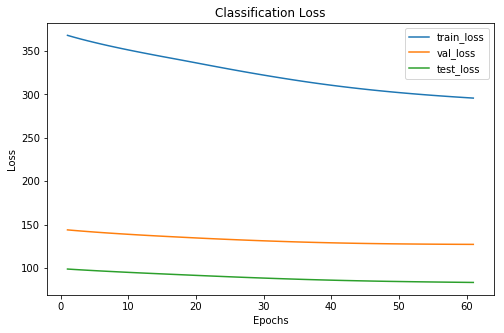

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
21  24  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     53      36
 1      125     48      30
 2       71     29      22
xxxxxxxxxxxxxx epoch: 61 xxxxxxxxxxxxxx


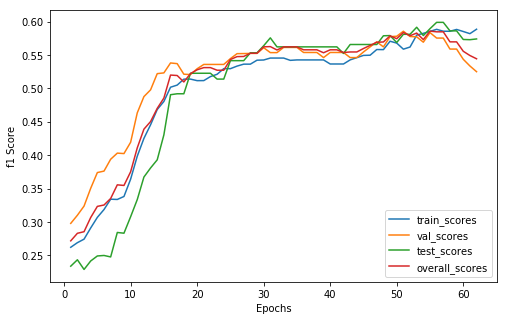

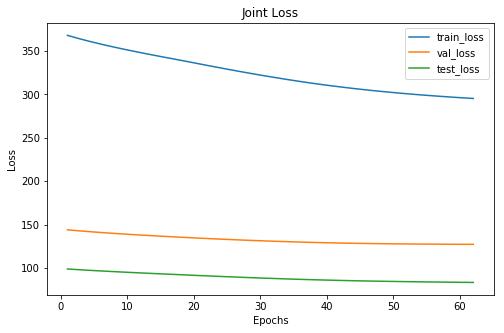

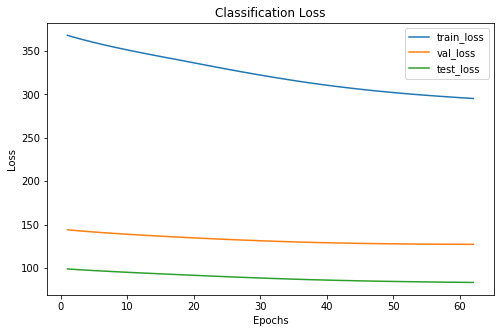

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     54      35
 1      124     47      30
 2       74     29      23
xxxxxxxxxxxxxx epoch: 62 xxxxxxxxxxxxxx


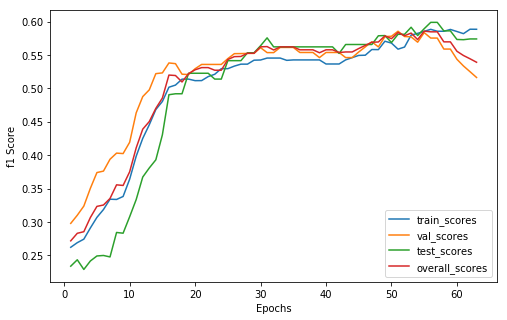

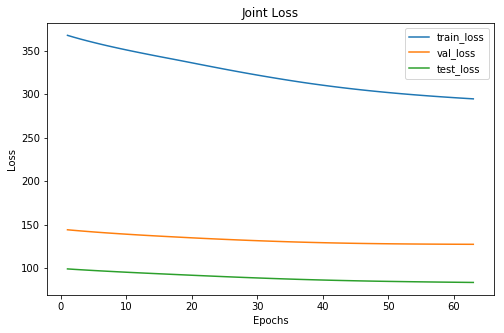

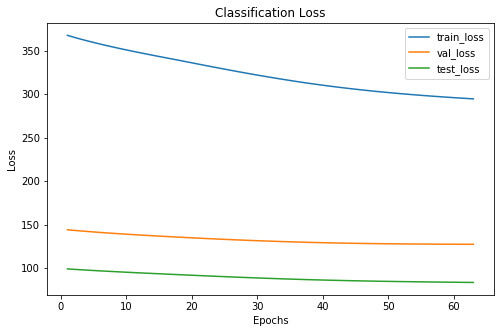

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     55      35
 1      124     46      30
 2       75     29      23
xxxxxxxxxxxxxx epoch: 63 xxxxxxxxxxxxxx


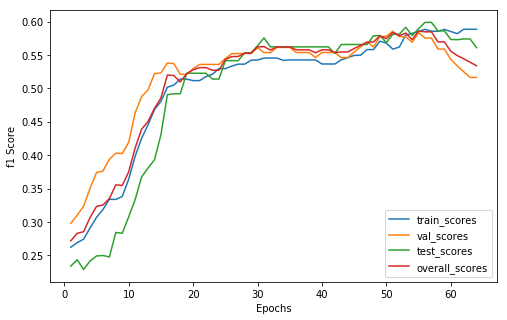

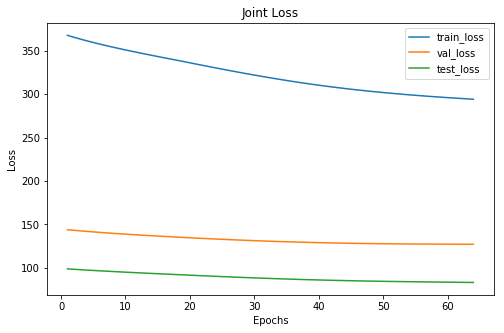

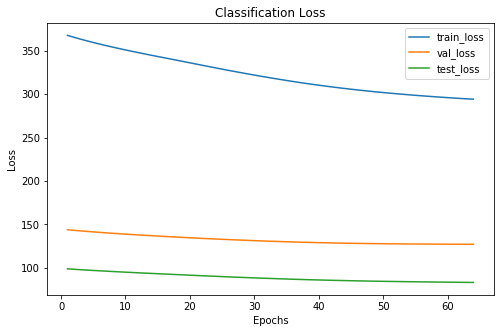

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 1  14  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     55      36
 1      124     46      29
 2       75     29      23
xxxxxxxxxxxxxx epoch: 64 xxxxxxxxxxxxxx


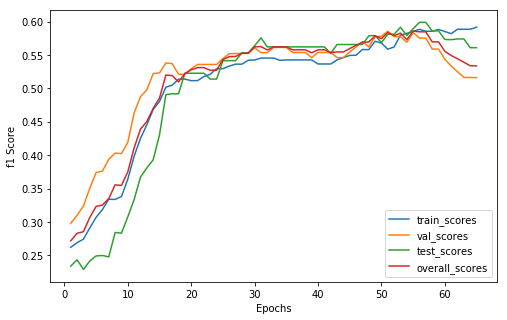

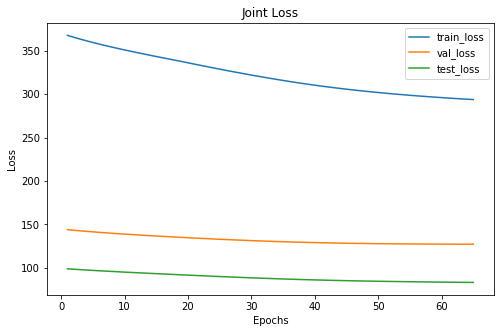

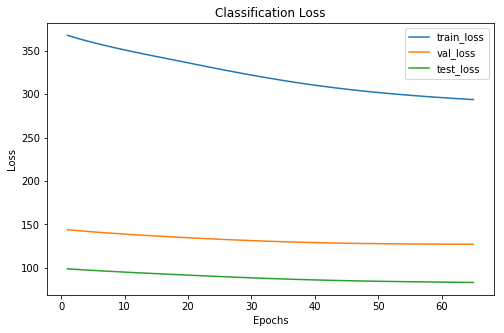

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     56      36
 1      125     45      29
 2       74     29      23
xxxxxxxxxxxxxx epoch: 65 xxxxxxxxxxxxxx


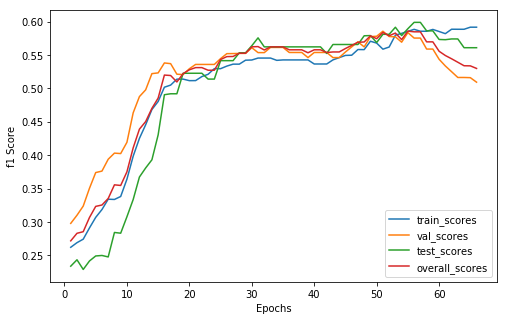

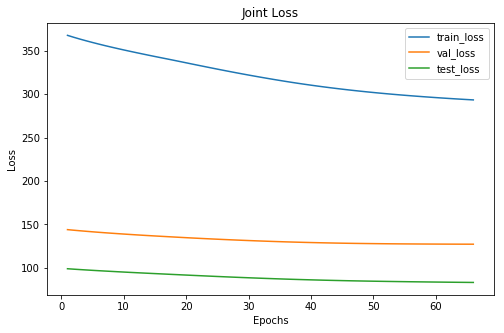

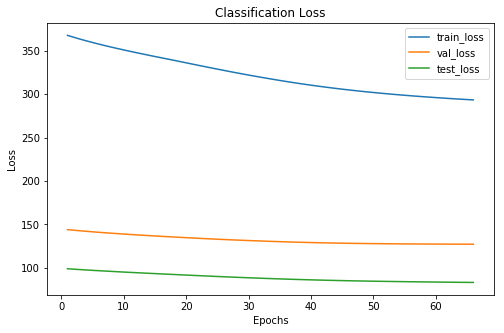

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     55      36
 1      125     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 66 xxxxxxxxxxxxxx


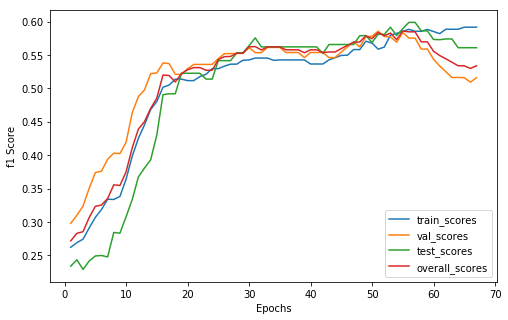

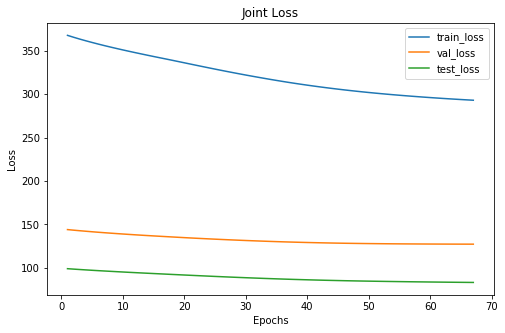

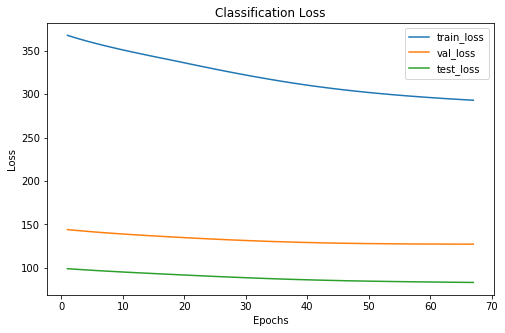

Cofusion Matrix For Val Set: 
--  --  --
31   9   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     56      36
 1      125     44      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 67 xxxxxxxxxxxxxx


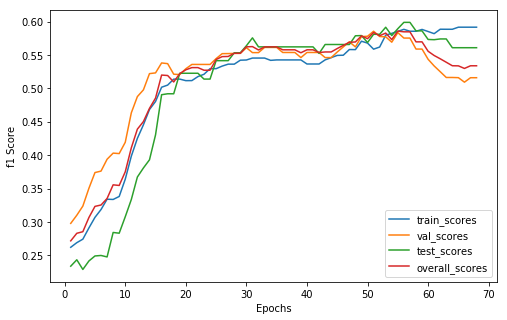

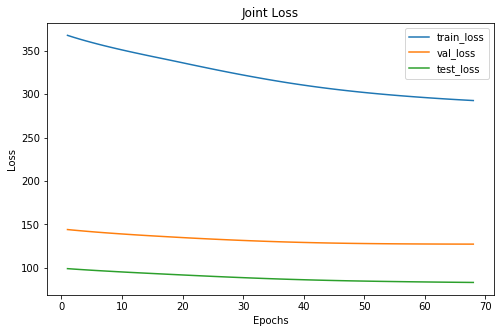

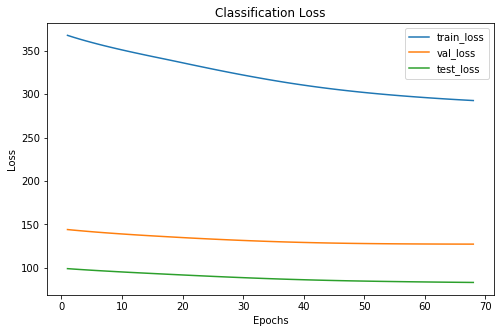

Cofusion Matrix For Val Set: 
--  --  --
31   9   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     56      36
 1      124     44      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 68 xxxxxxxxxxxxxx


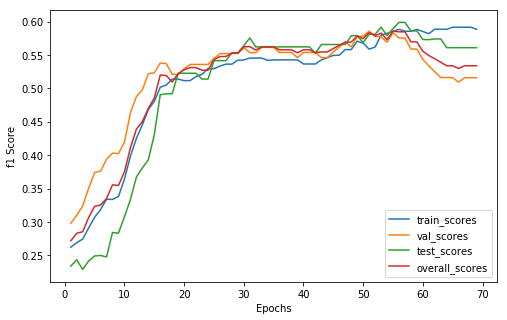

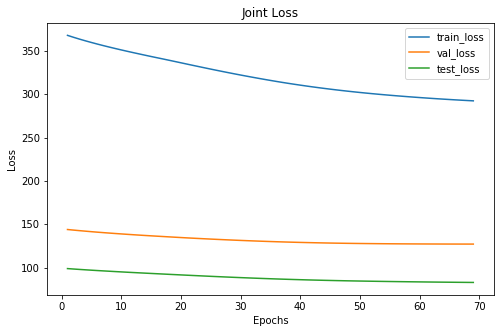

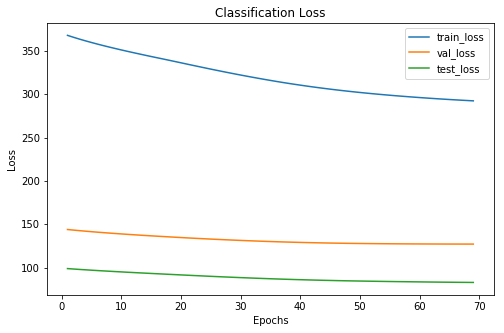

Cofusion Matrix For Val Set: 
--  --  --
31   9   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      123     44      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 69 xxxxxxxxxxxxxx


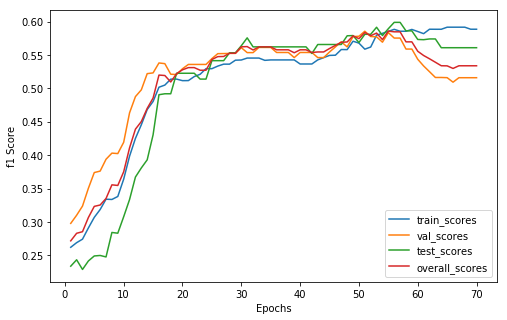

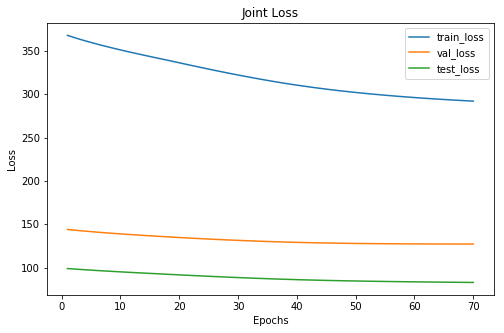

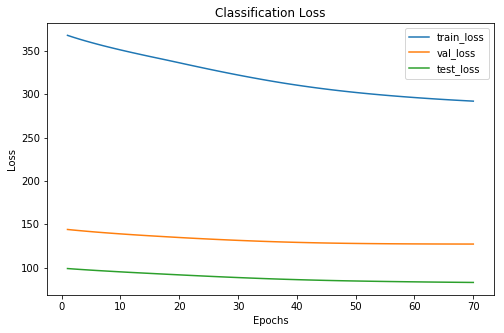

Cofusion Matrix For Val Set: 
--  --  --
31   9   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      123     44      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 70 xxxxxxxxxxxxxx


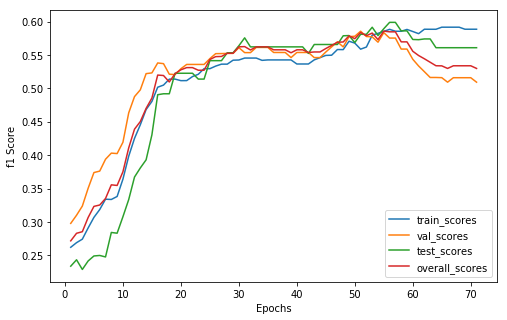

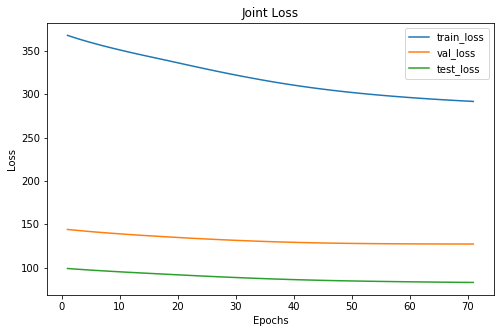

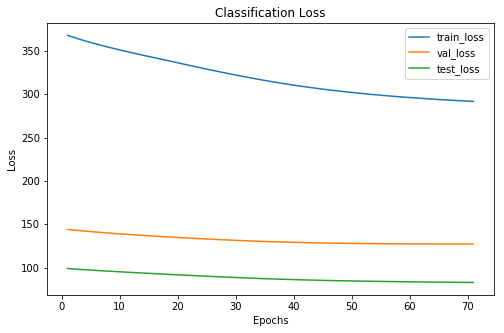

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 71 xxxxxxxxxxxxxx


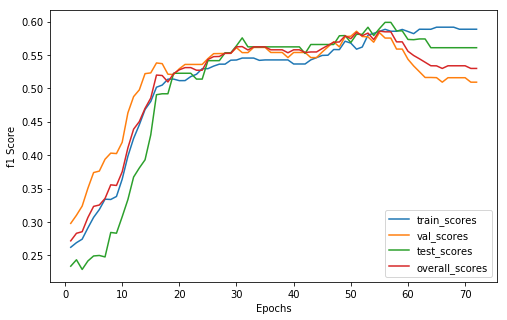

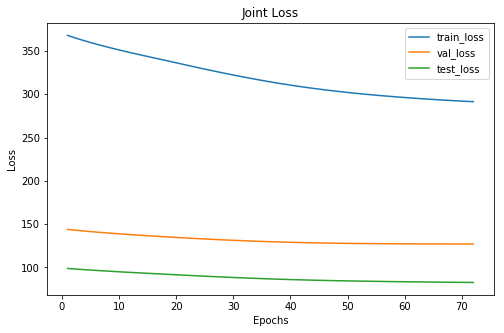

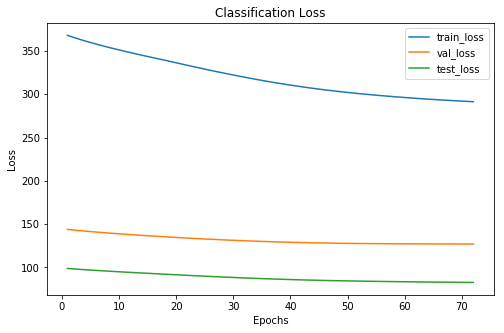

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 72 xxxxxxxxxxxxxx


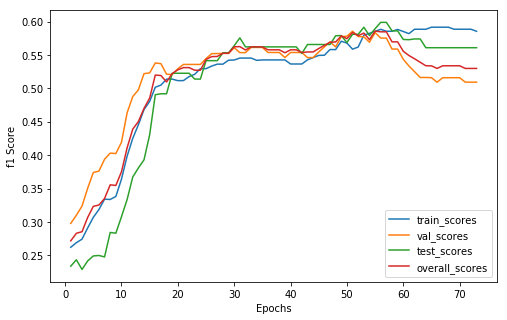

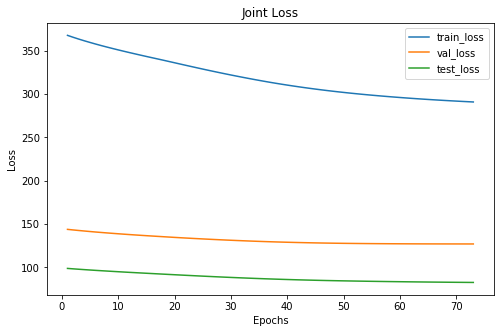

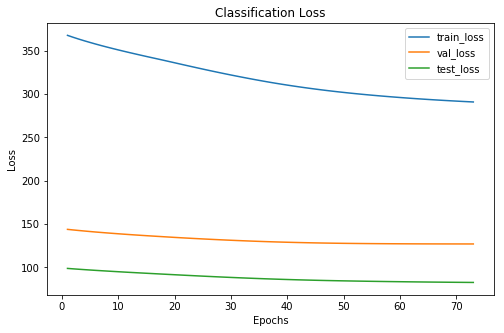

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     55      36
 1      122     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 73 xxxxxxxxxxxxxx


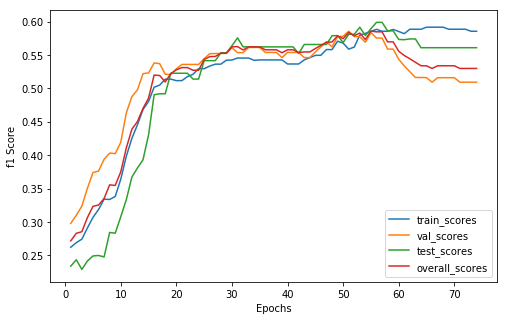

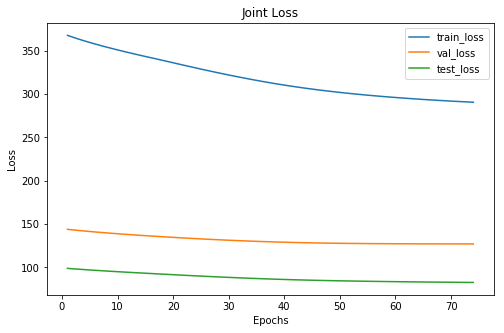

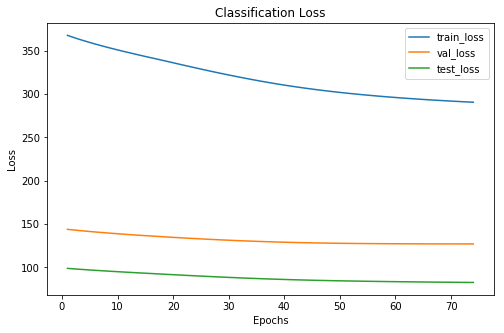

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     55      36
 1      122     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 74 xxxxxxxxxxxxxx


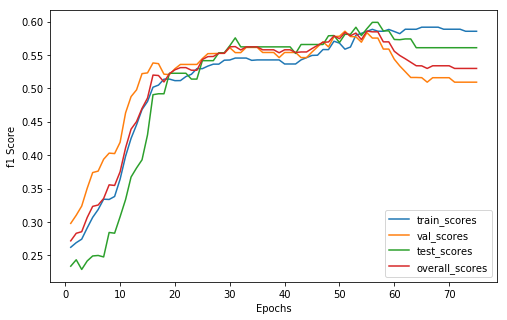

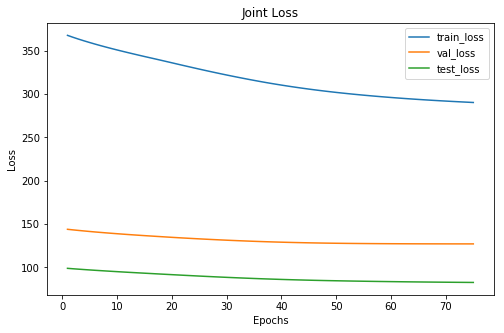

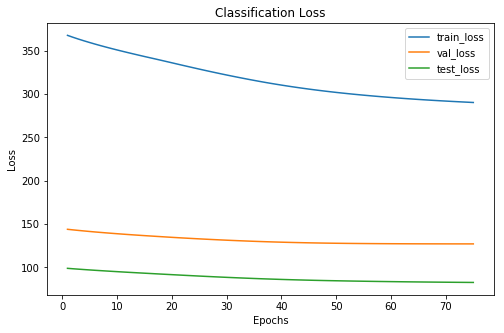

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 75 xxxxxxxxxxxxxx


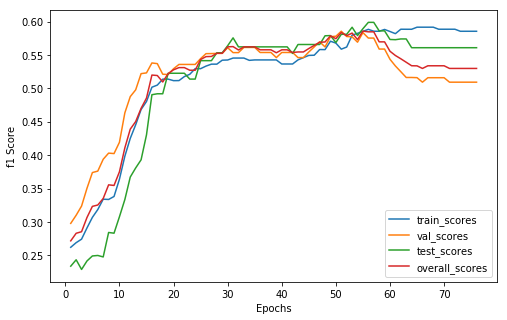

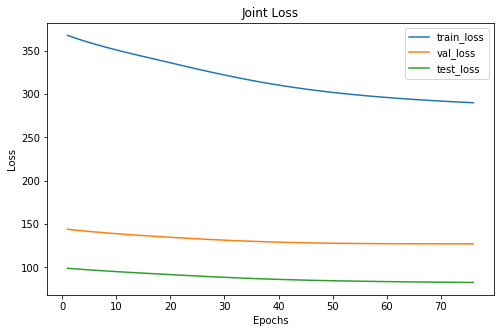

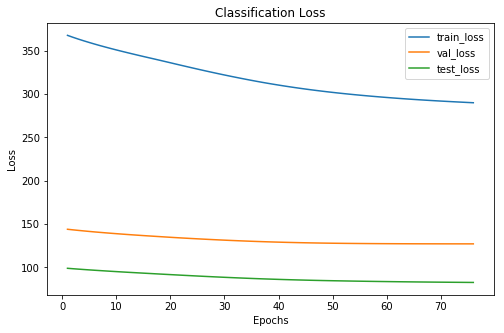

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 76 xxxxxxxxxxxxxx


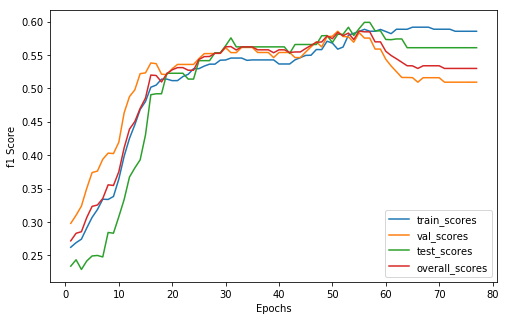

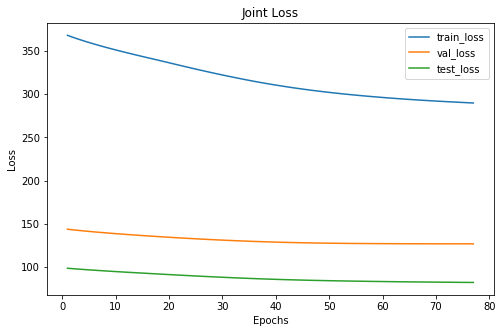

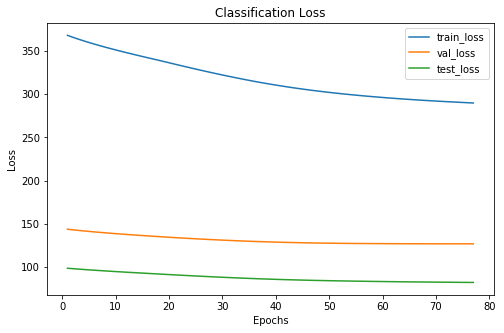

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 77 xxxxxxxxxxxxxx


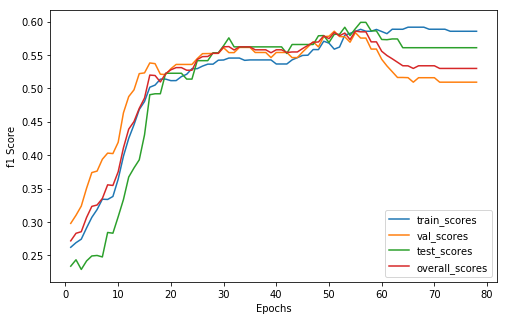

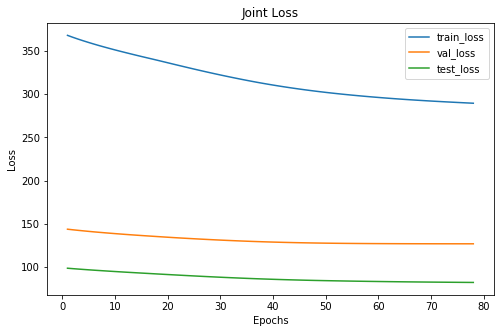

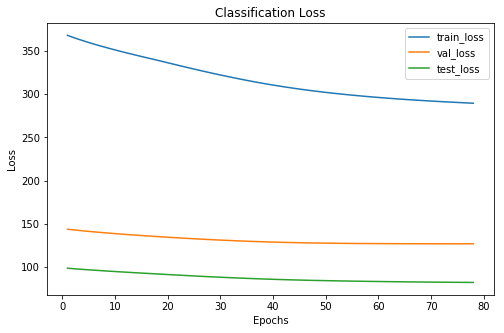

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 78 xxxxxxxxxxxxxx


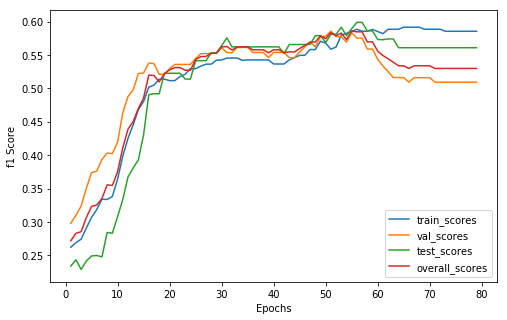

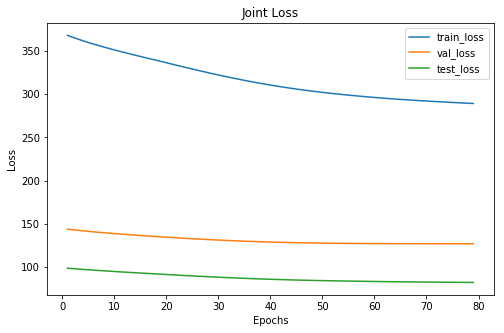

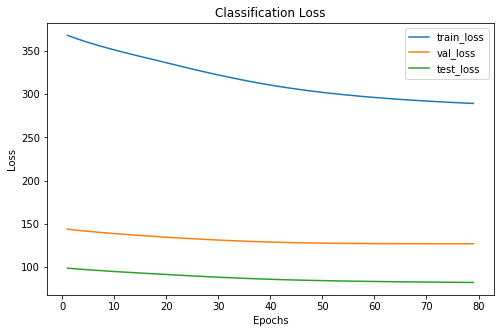

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 79 xxxxxxxxxxxxxx


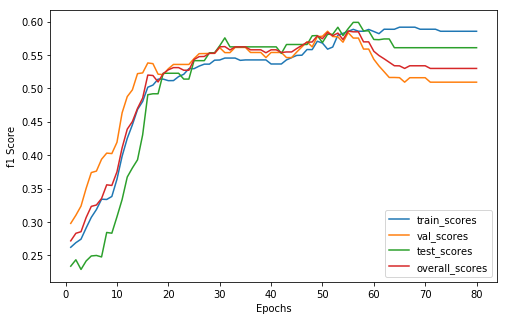

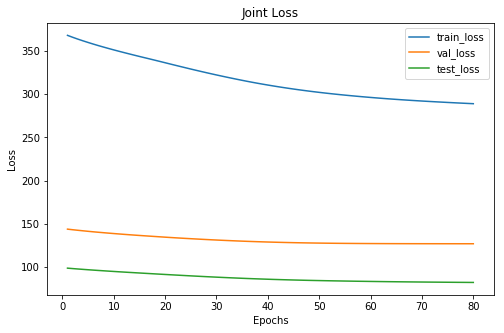

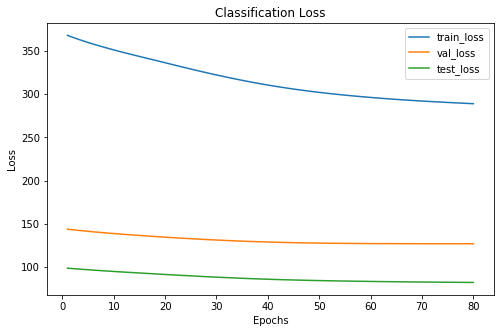

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     55      36
 1      123     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 80 xxxxxxxxxxxxxx


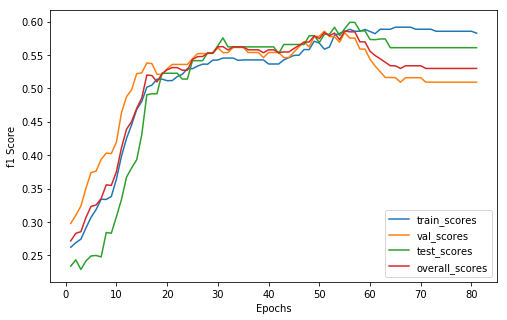

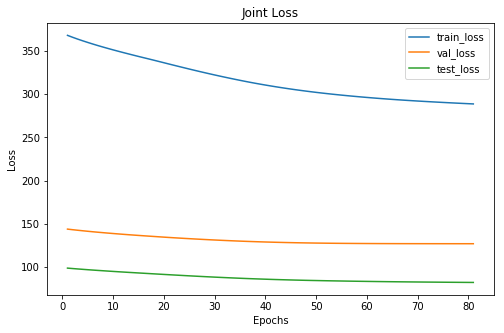

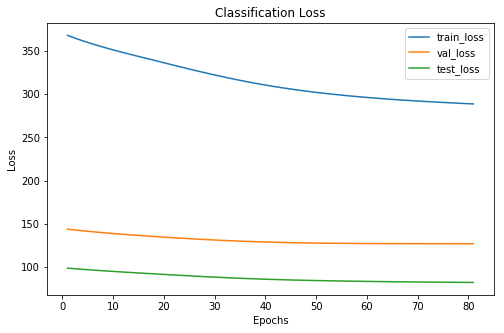

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     55      36
 1      124     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 81 xxxxxxxxxxxxxx


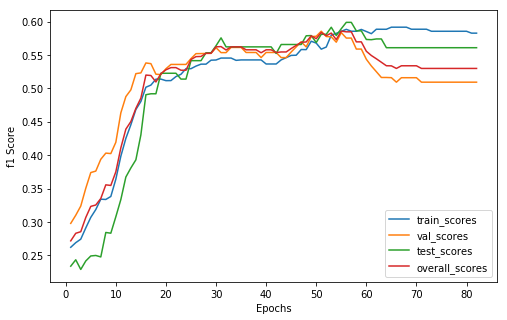

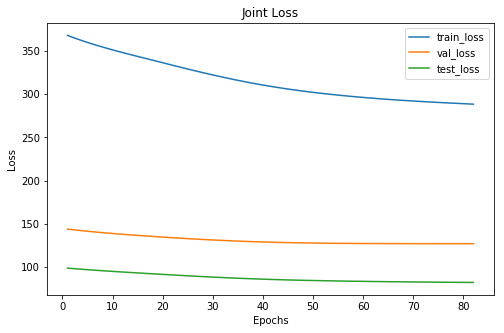

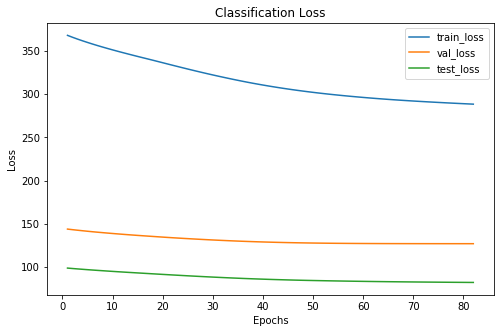

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     55      36
 1      124     45      29
 2       74     30      23
xxxxxxxxxxxxxx epoch: 82 xxxxxxxxxxxxxx


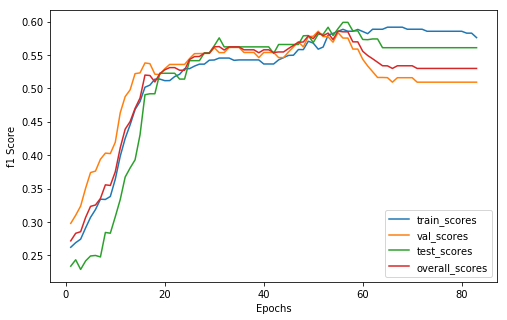

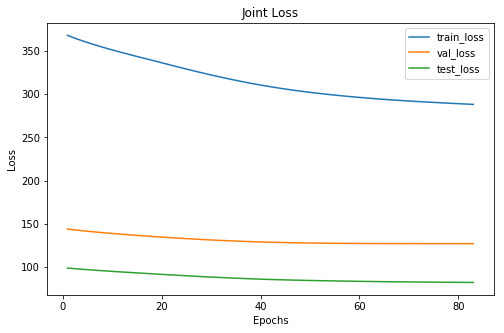

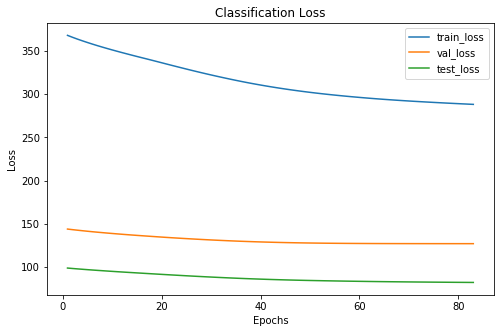

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     55      36
 1      124     45      29
 2       72     30      23
xxxxxxxxxxxxxx epoch: 83 xxxxxxxxxxxxxx


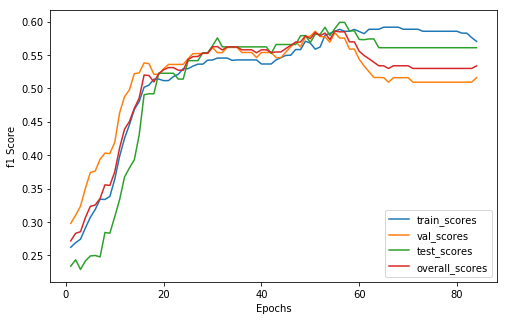

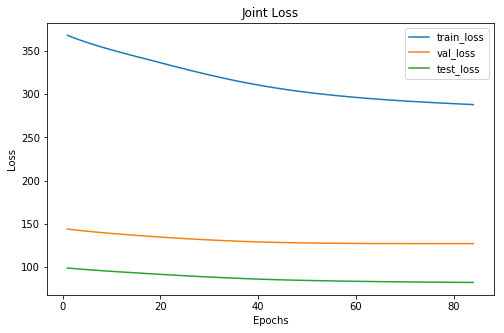

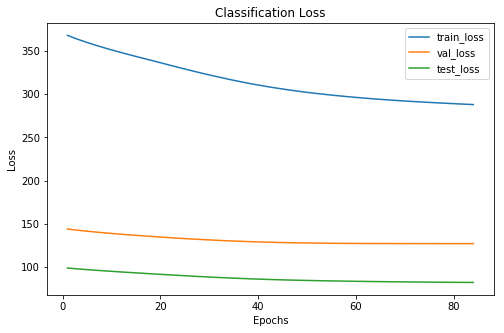

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     56      36
 1      126     45      29
 2       72     29      23
xxxxxxxxxxxxxx epoch: 84 xxxxxxxxxxxxxx


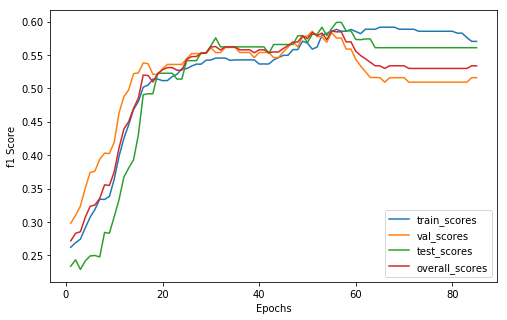

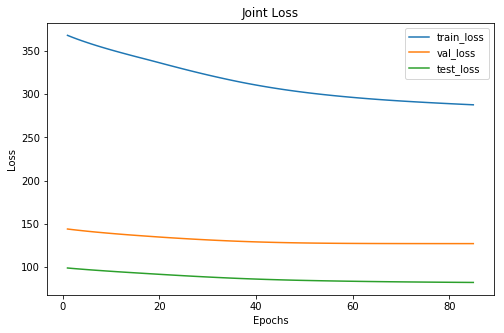

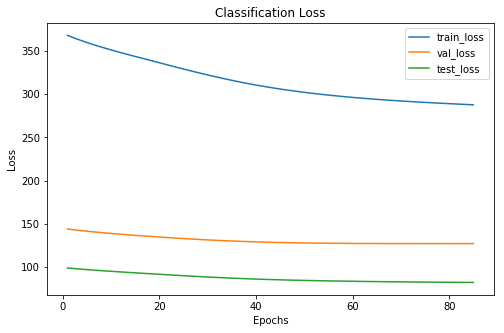

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     56      36
 1      126     45      29
 2       72     29      23
xxxxxxxxxxxxxx epoch: 85 xxxxxxxxxxxxxx


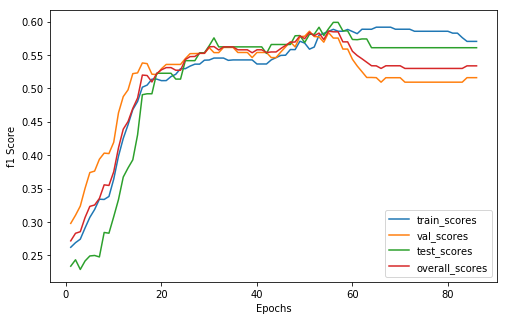

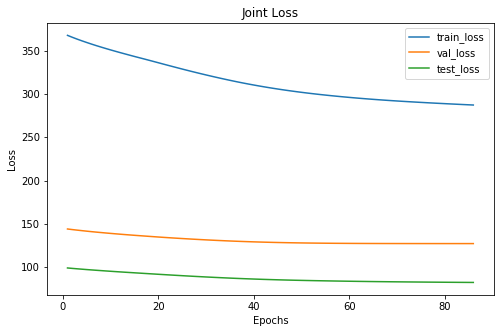

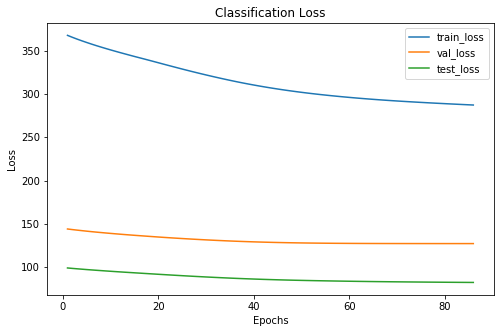

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     56      36
 1      126     45      29
 2       72     29      23
xxxxxxxxxxxxxx epoch: 86 xxxxxxxxxxxxxx


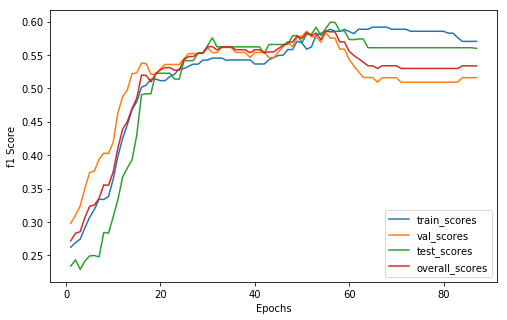

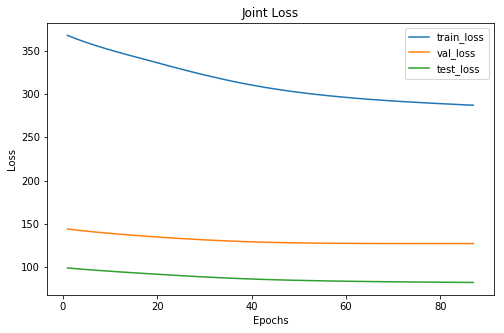

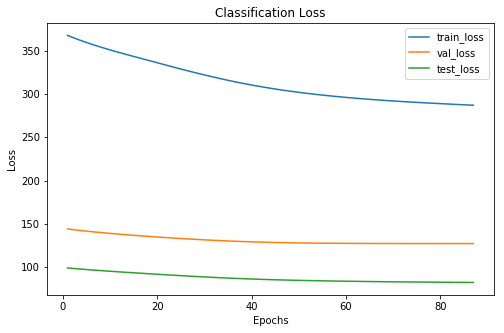

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      37
 1      126     45      29
 2       71     29      22
xxxxxxxxxxxxxx epoch: 87 xxxxxxxxxxxxxx


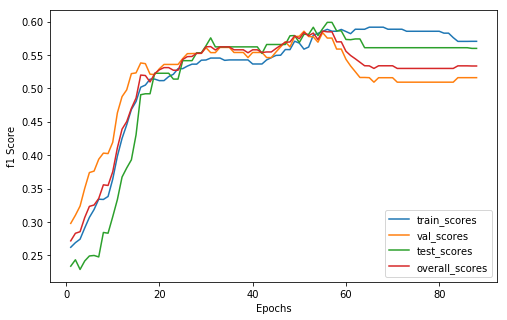

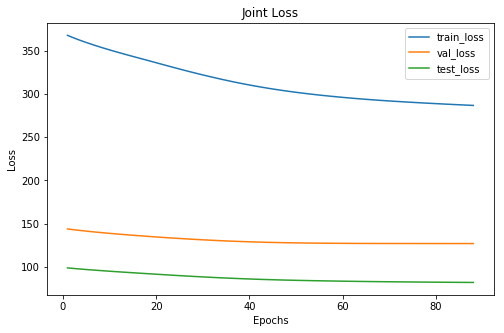

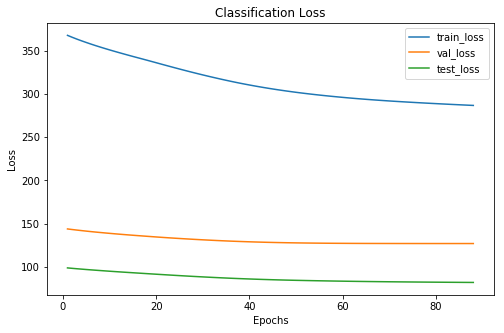

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      37
 1      126     45      29
 2       71     29      22
xxxxxxxxxxxxxx epoch: 88 xxxxxxxxxxxxxx


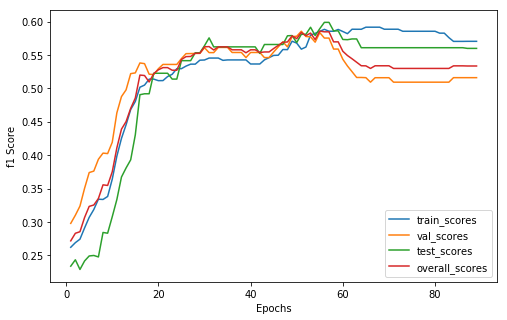

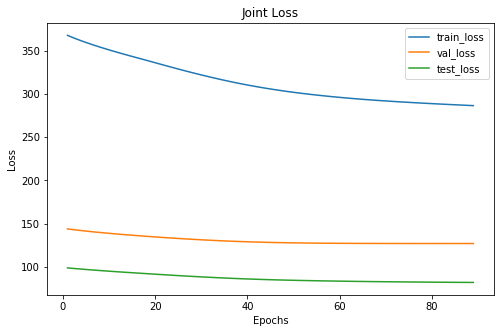

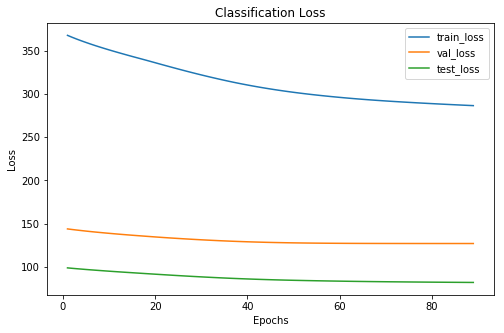

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      37
 1      126     45      29
 2       71     29      22
xxxxxxxxxxxxxx epoch: 89 xxxxxxxxxxxxxx


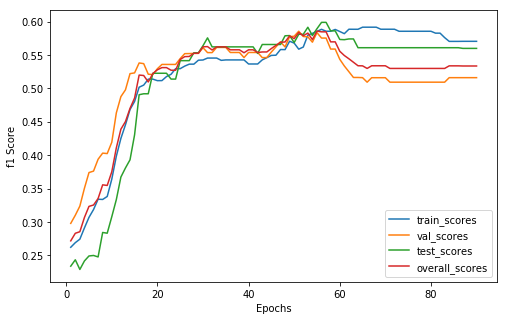

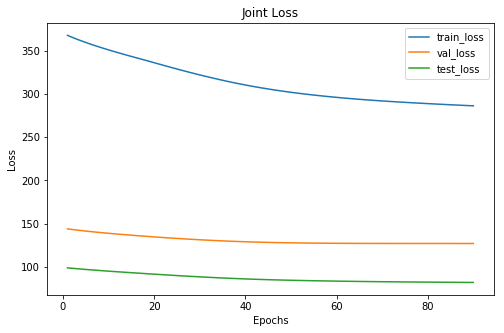

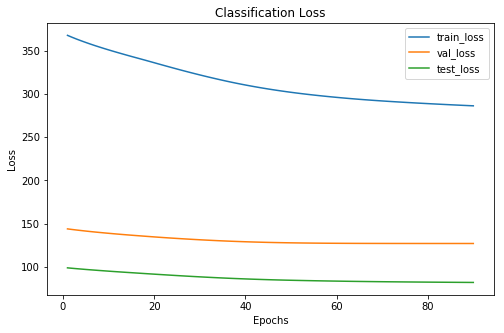

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      37
 1      126     45      29
 2       71     29      22
xxxxxxxxxxxxxx epoch: 90 xxxxxxxxxxxxxx


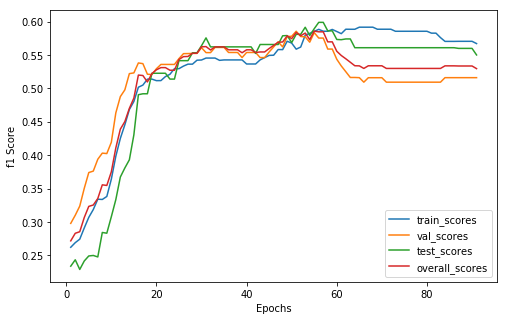

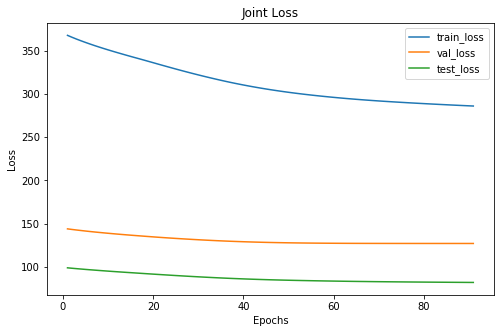

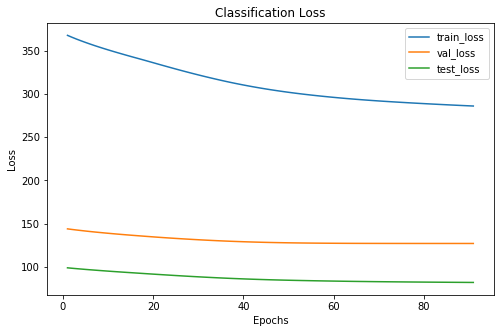

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 91 xxxxxxxxxxxxxx


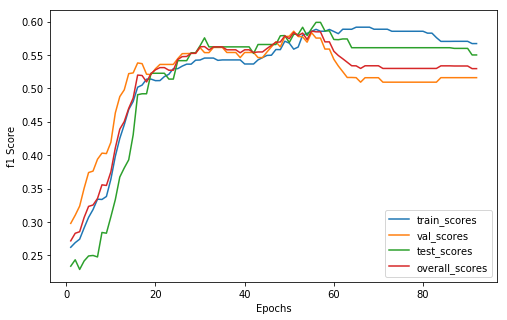

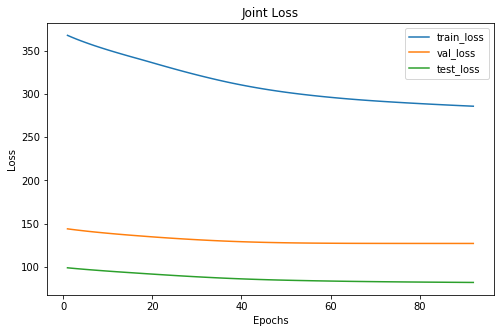

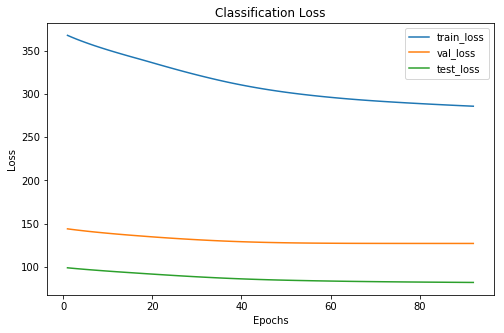

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 92 xxxxxxxxxxxxxx


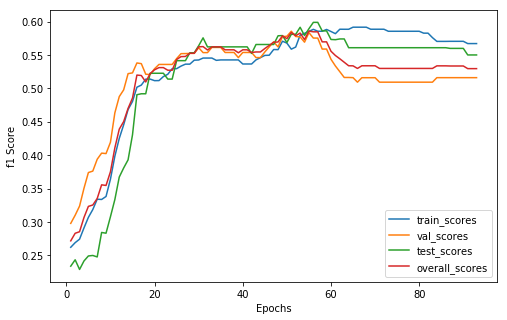

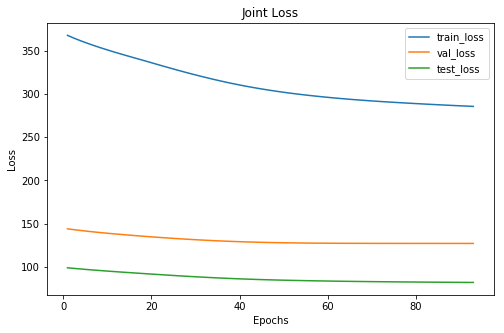

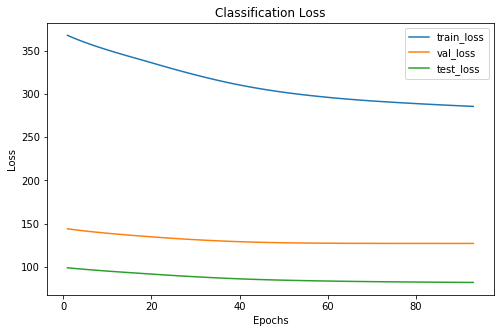

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 93 xxxxxxxxxxxxxx


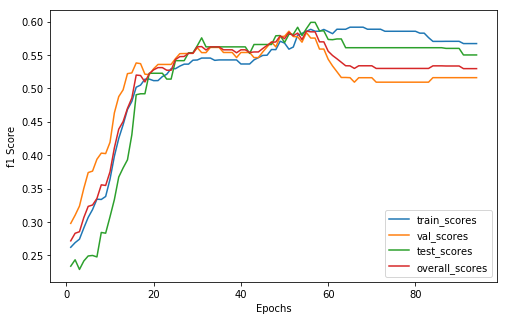

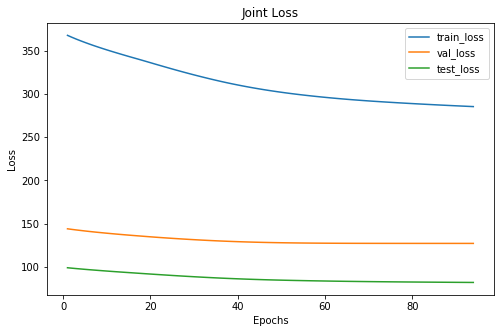

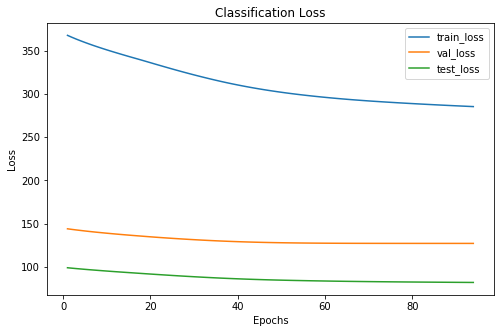

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 94 xxxxxxxxxxxxxx


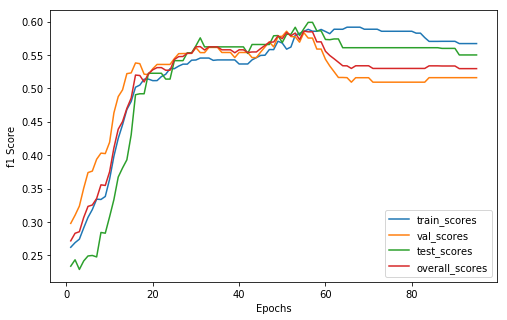

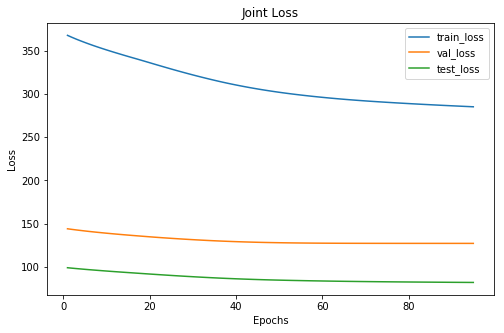

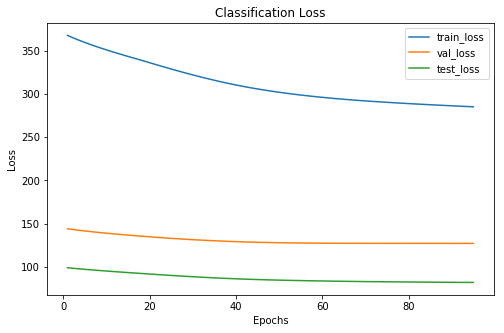

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 95 xxxxxxxxxxxxxx


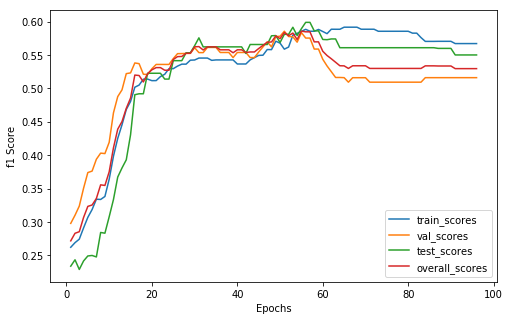

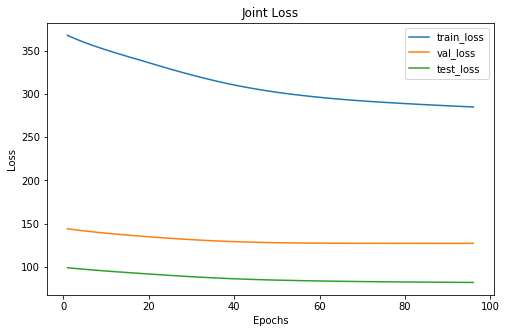

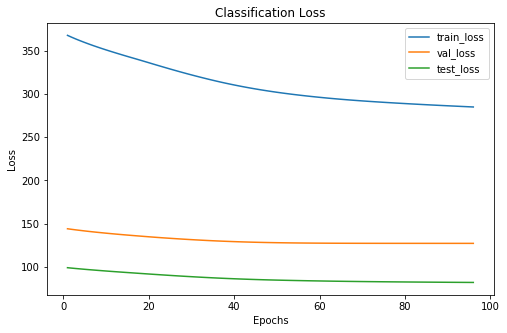

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 96 xxxxxxxxxxxxxx


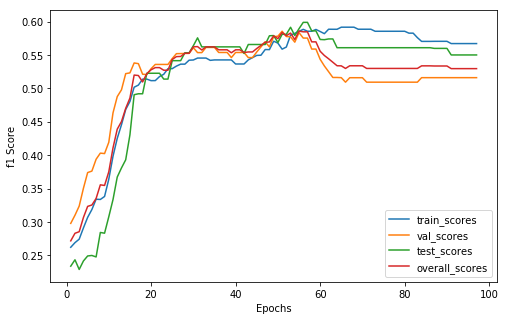

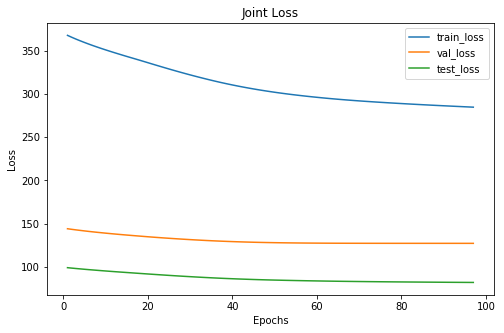

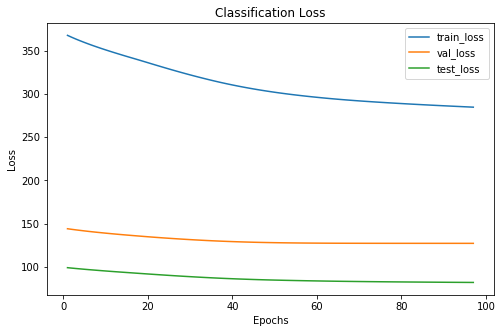

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 97 xxxxxxxxxxxxxx


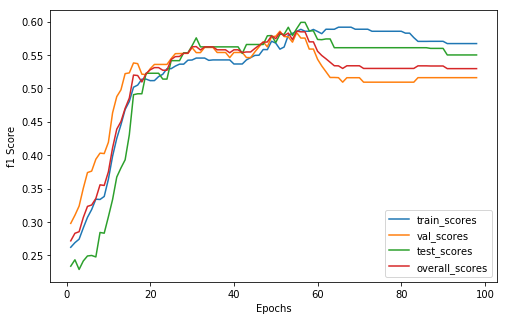

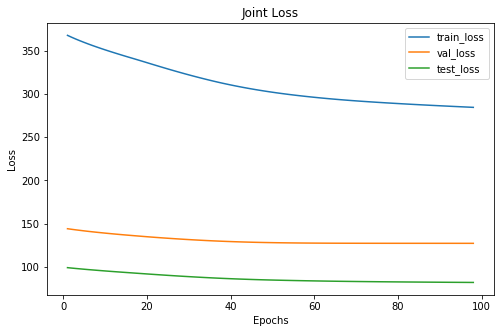

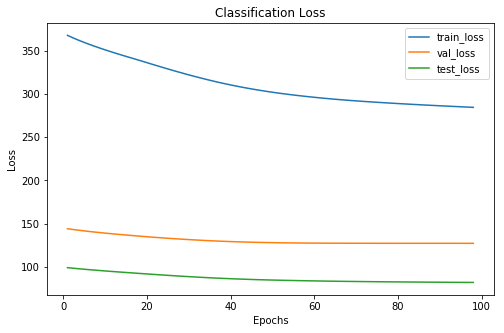

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 98 xxxxxxxxxxxxxx


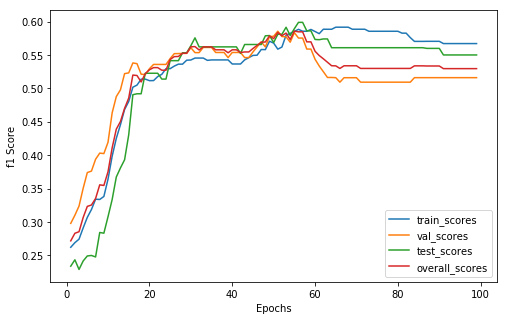

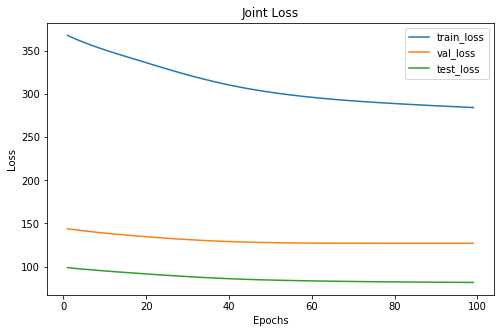

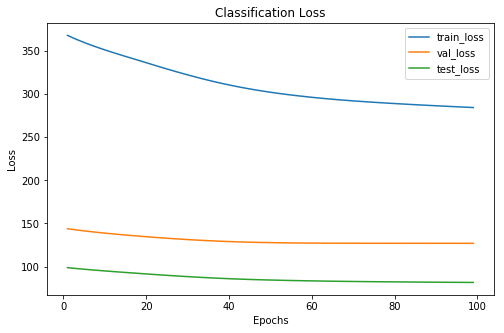

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 99 xxxxxxxxxxxxxx


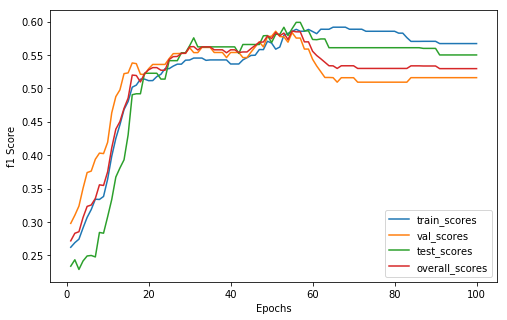

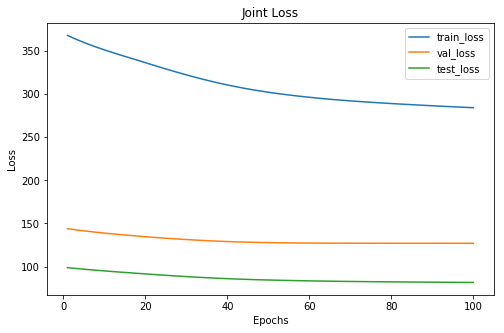

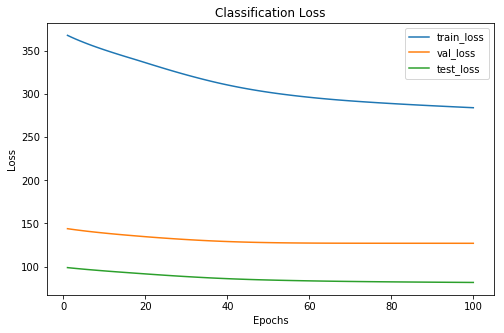

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 100 xxxxxxxxxxxxxx


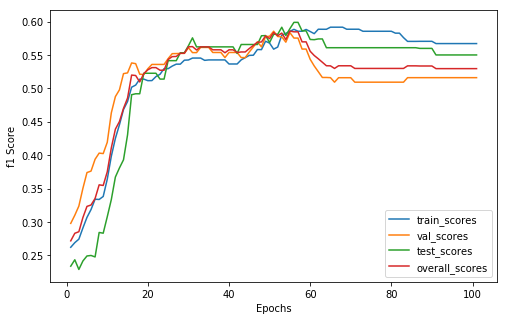

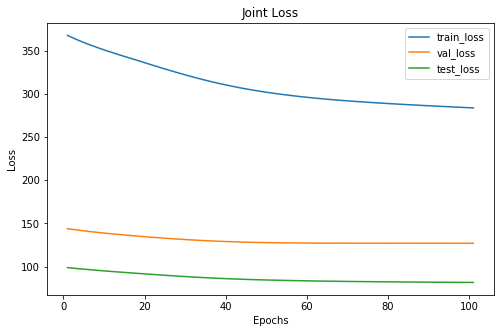

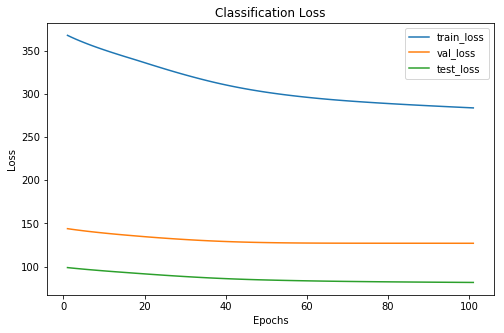

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 101 xxxxxxxxxxxxxx


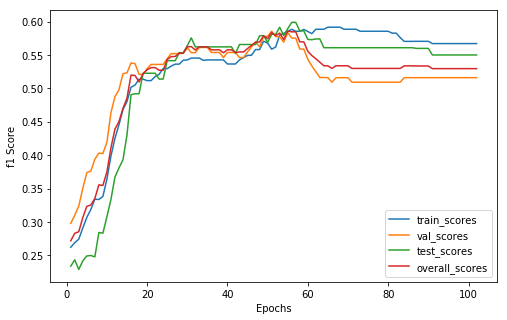

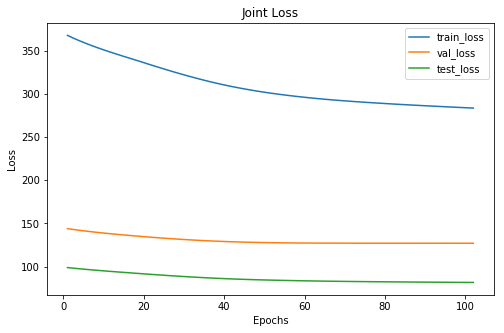

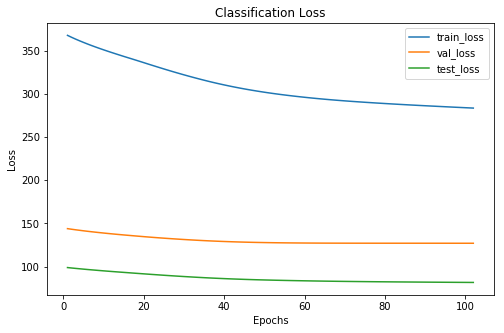

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 102 xxxxxxxxxxxxxx


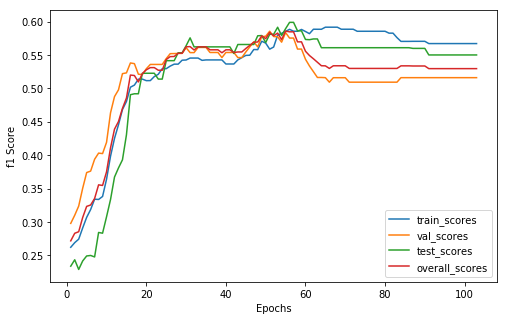

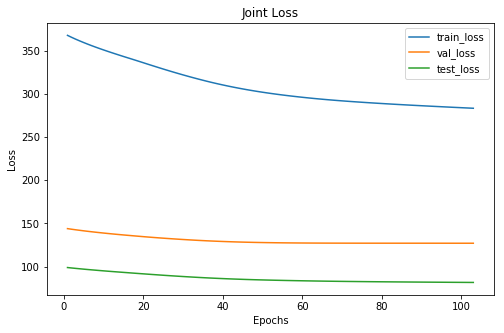

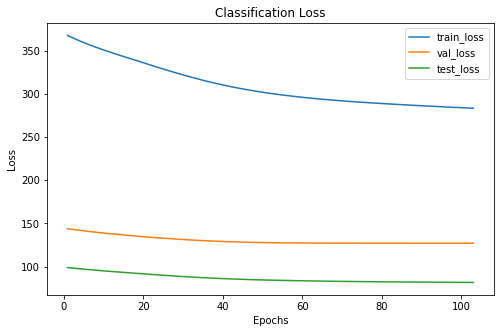

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 103 xxxxxxxxxxxxxx


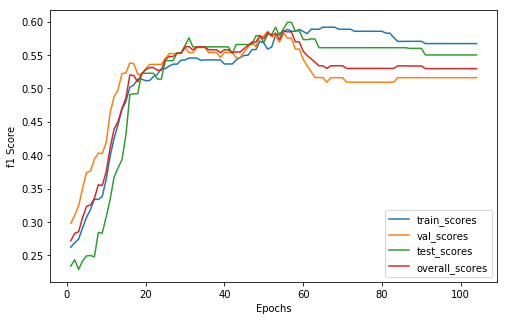

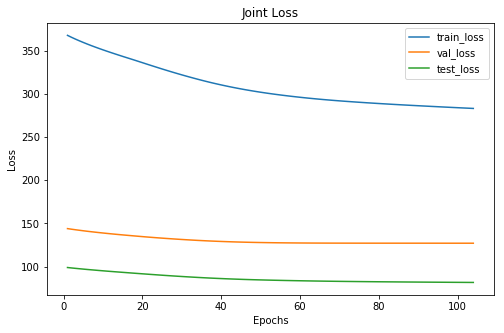

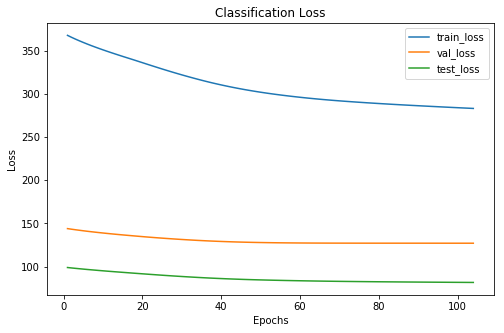

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 104 xxxxxxxxxxxxxx


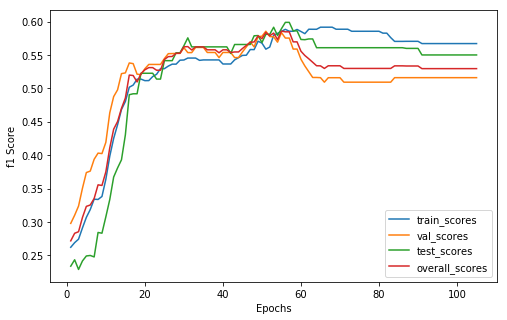

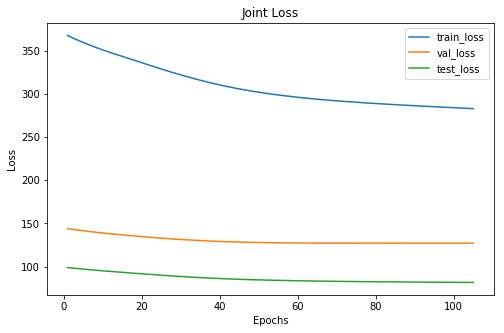

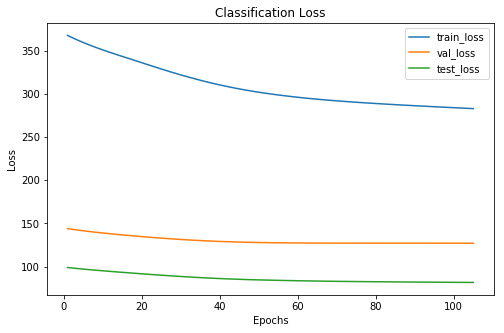

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 105 xxxxxxxxxxxxxx


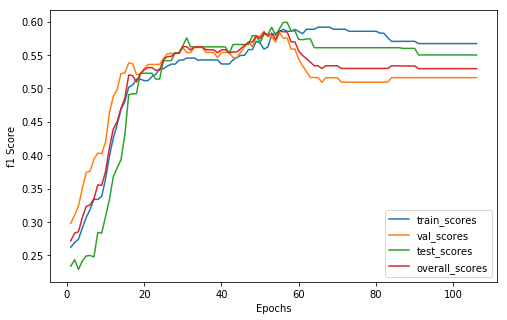

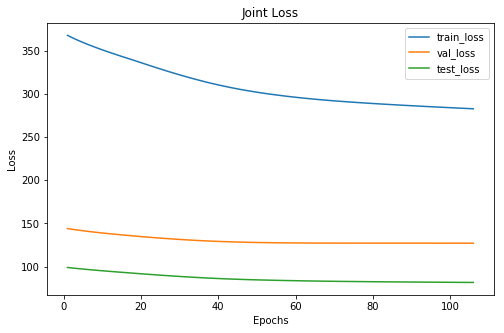

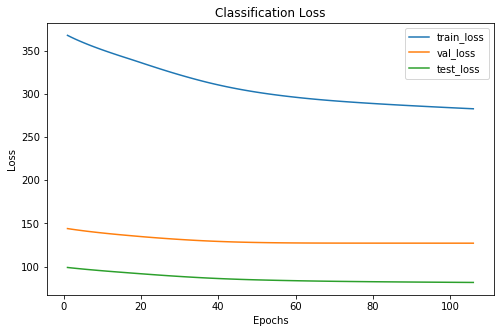

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 106 xxxxxxxxxxxxxx


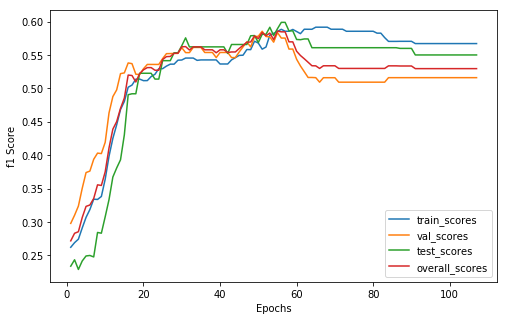

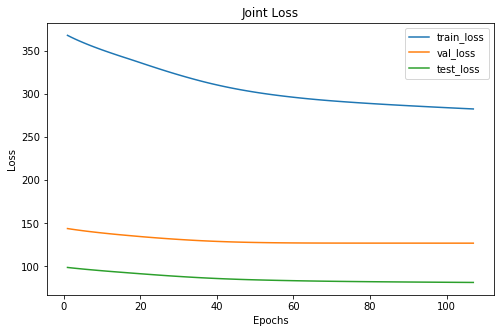

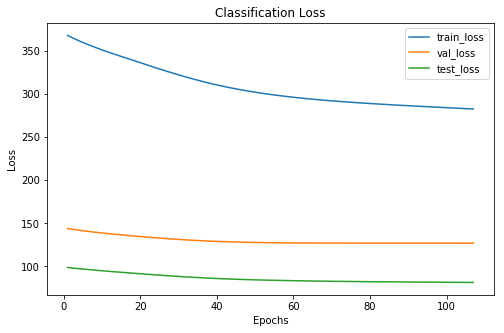

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 107 xxxxxxxxxxxxxx


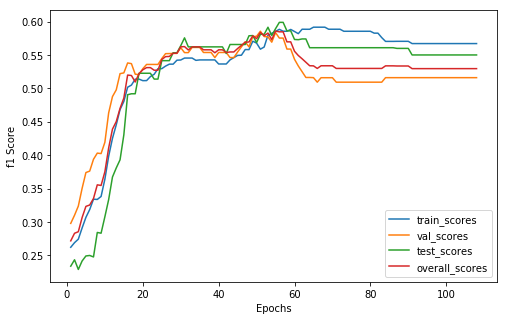

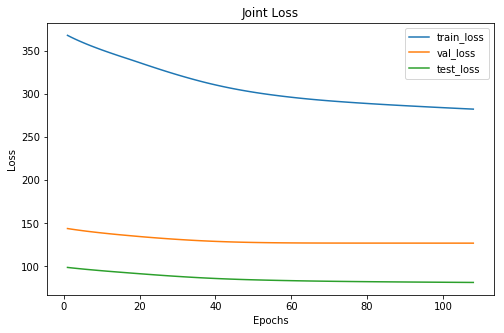

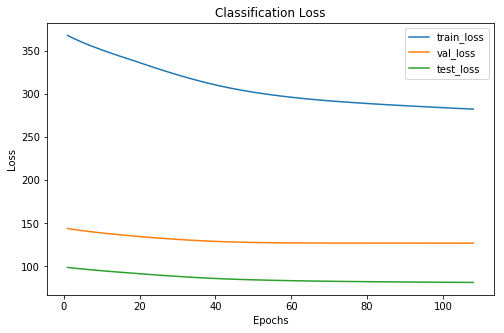

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     56      36
 1      127     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 108 xxxxxxxxxxxxxx


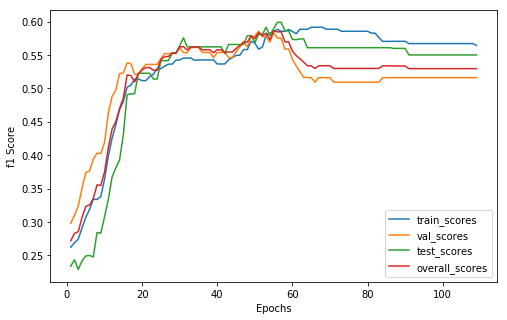

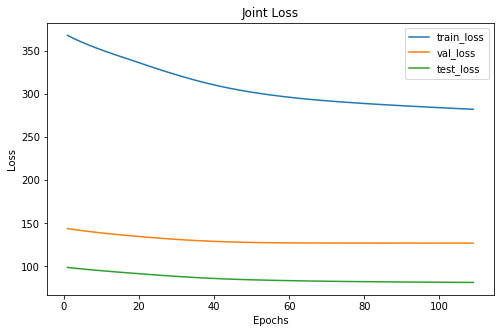

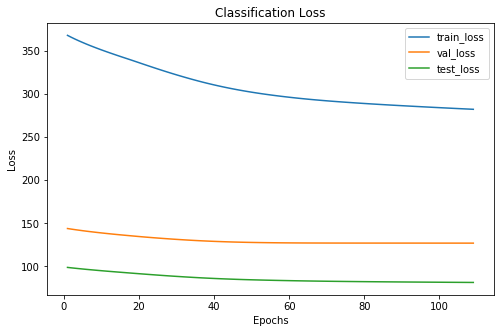

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     56      36
 1      128     45      30
 2       70     29      22
xxxxxxxxxxxxxx epoch: 109 xxxxxxxxxxxxxx


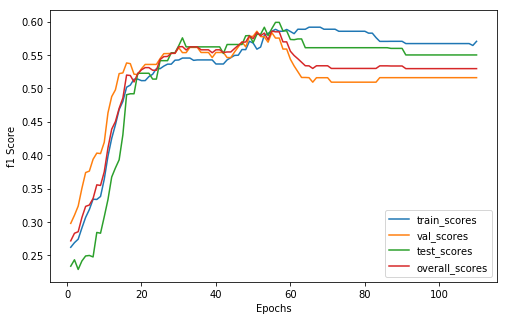

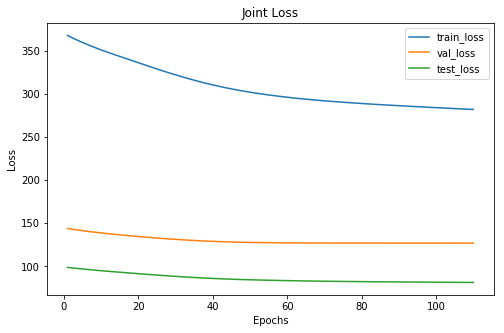

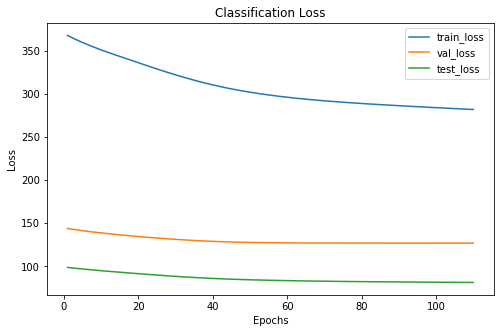

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
23  22  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     56      36
 1      130     45      30
 2       68     29      22
xxxxxxxxxxxxxx epoch: 110 xxxxxxxxxxxxxx


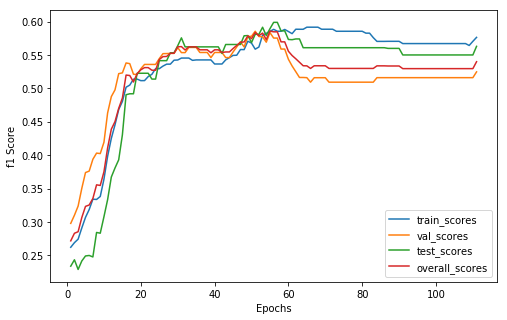

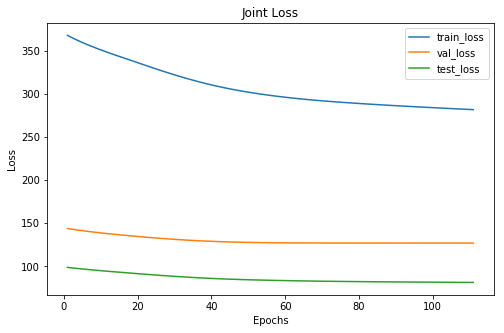

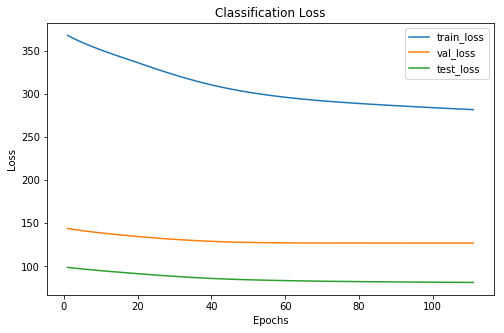

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     55      35
 1      132     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 111 xxxxxxxxxxxxxx


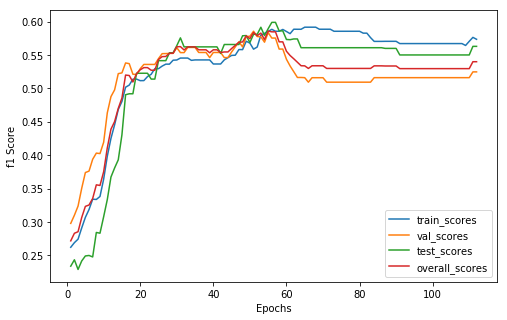

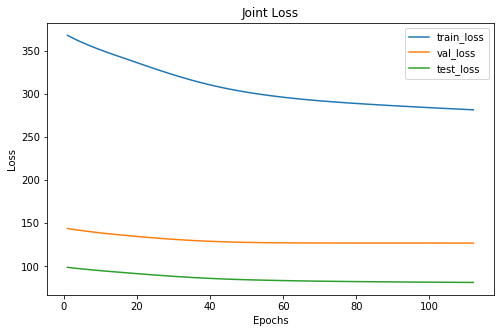

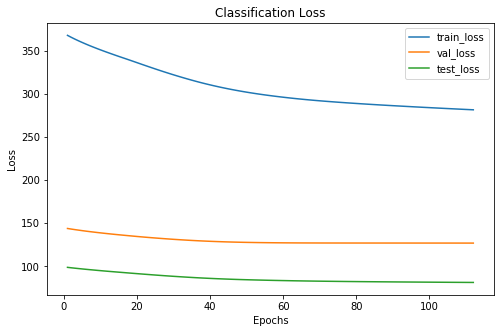

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      133     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 112 xxxxxxxxxxxxxx


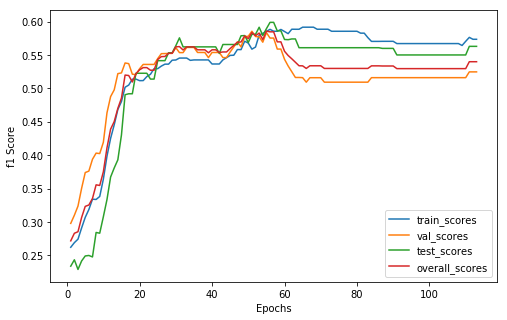

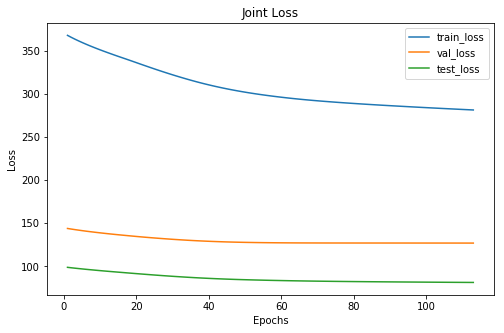

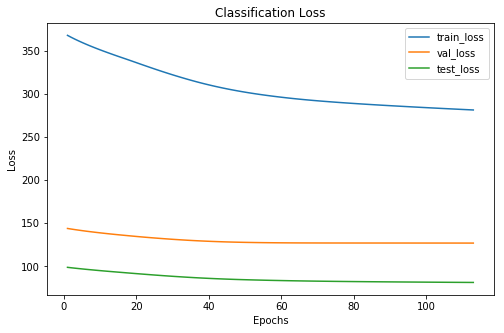

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      133     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 113 xxxxxxxxxxxxxx


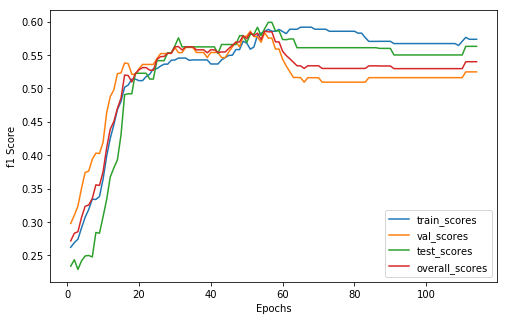

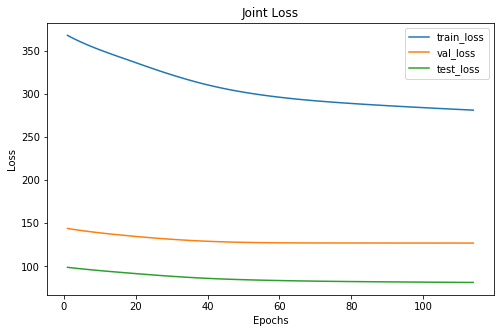

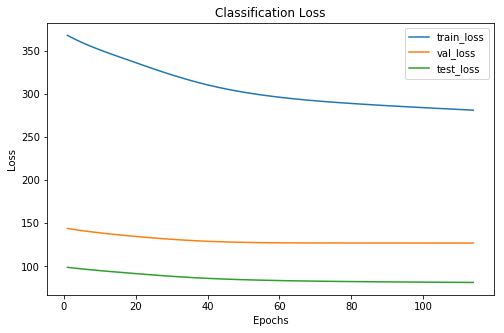

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      133     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 114 xxxxxxxxxxxxxx


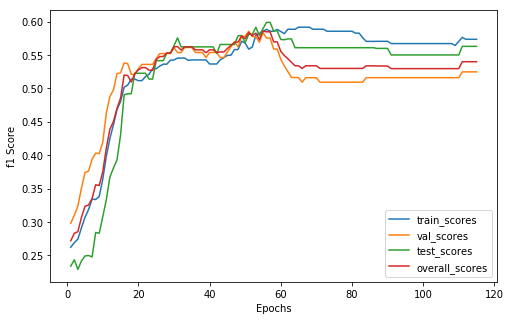

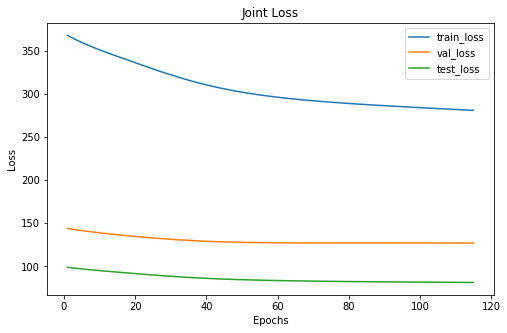

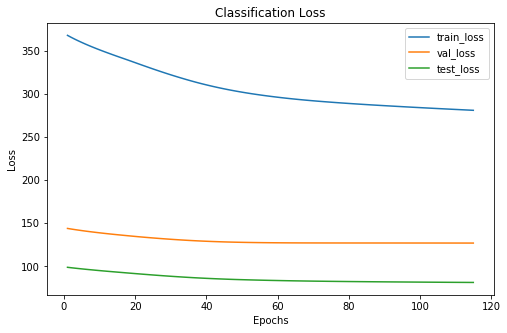

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      133     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 115 xxxxxxxxxxxxxx


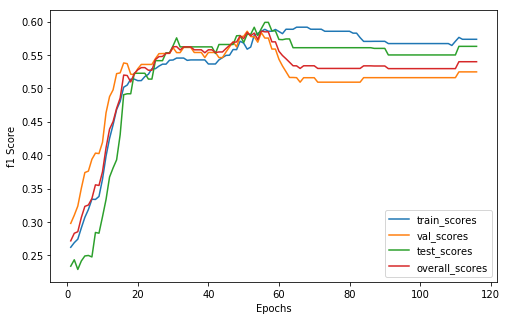

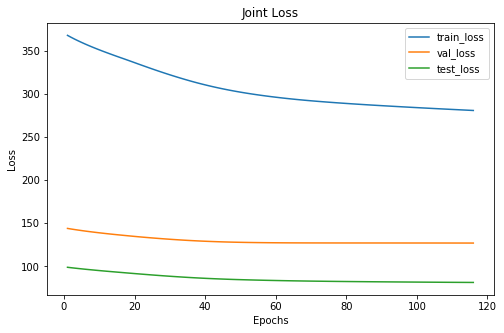

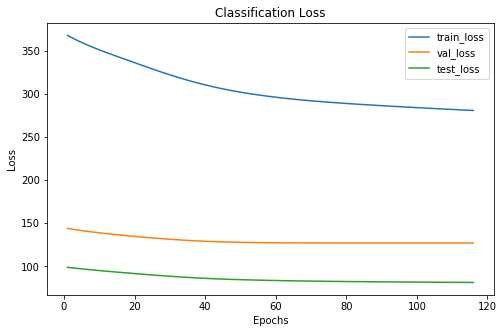

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      133     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 116 xxxxxxxxxxxxxx


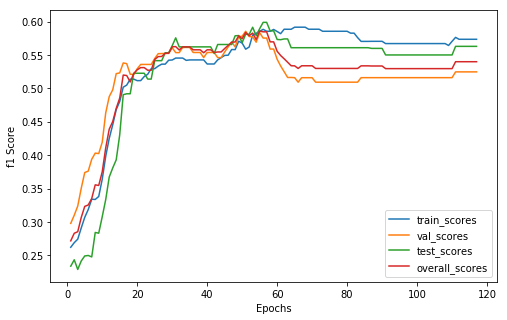

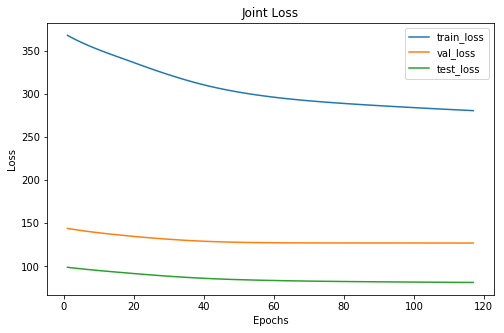

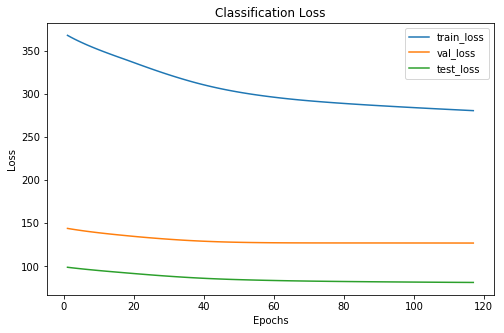

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      133     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 117 xxxxxxxxxxxxxx


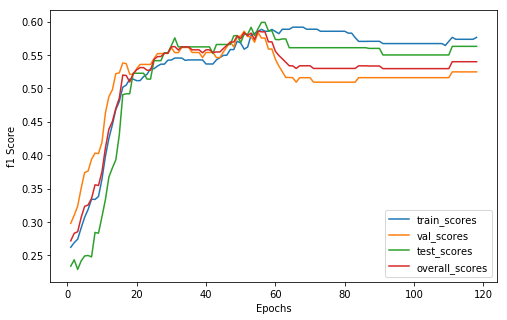

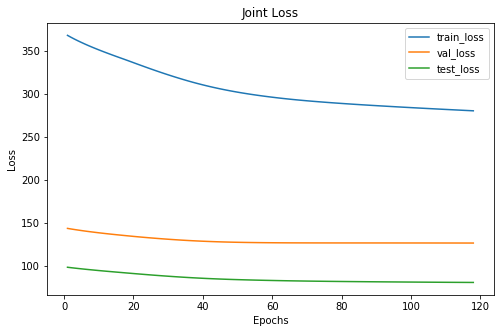

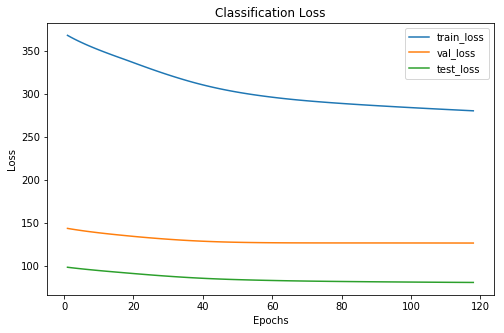

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     55      35
 1      132     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 118 xxxxxxxxxxxxxx


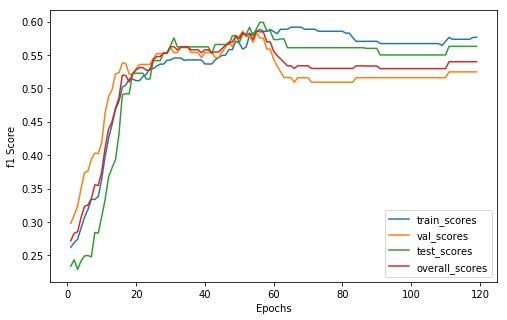

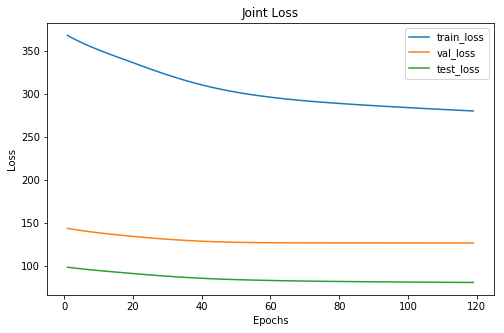

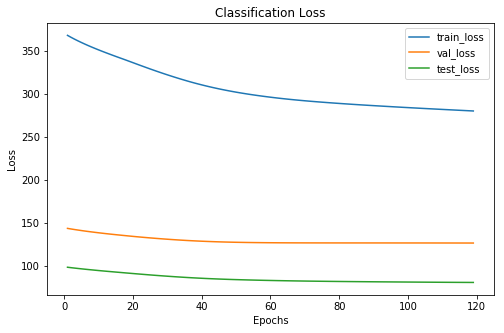

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  23  10
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     55      35
 1      132     46      31
 2       68     29      22
xxxxxxxxxxxxxx epoch: 119 xxxxxxxxxxxxxx


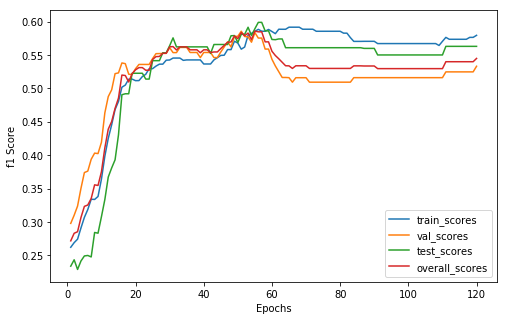

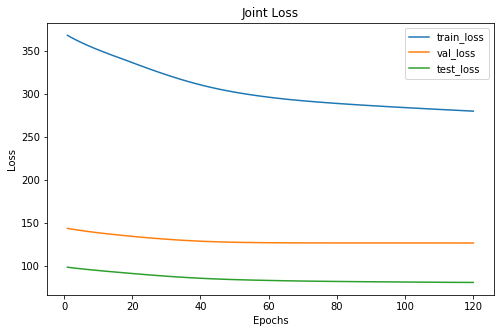

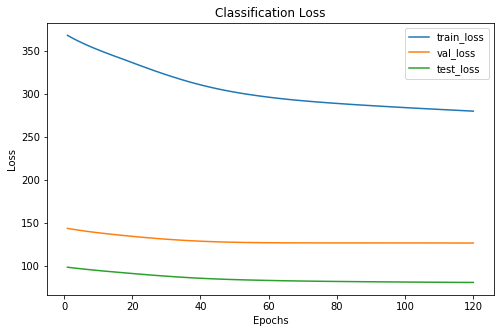

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     55      35
 1      133     47      31
 2       67     28      22
xxxxxxxxxxxxxx epoch: 120 xxxxxxxxxxxxxx


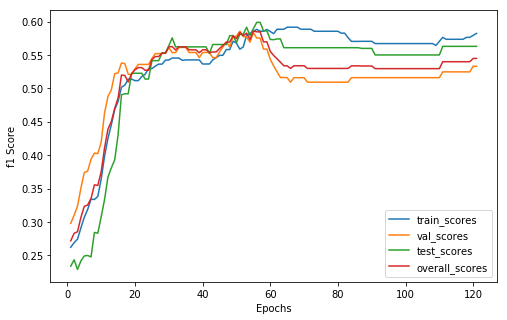

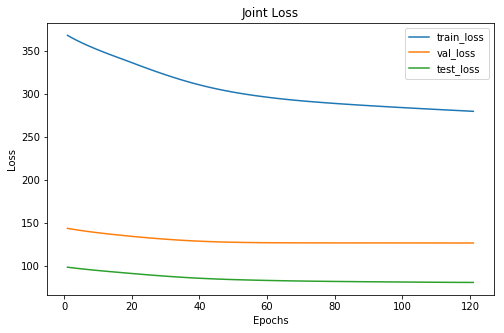

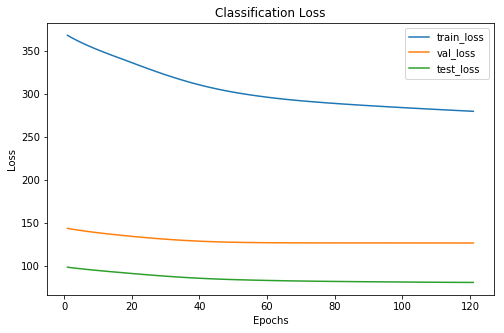

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      134     47      31
 2       67     28      22
xxxxxxxxxxxxxx epoch: 121 xxxxxxxxxxxxxx


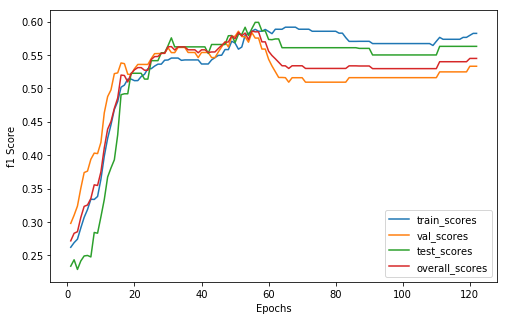

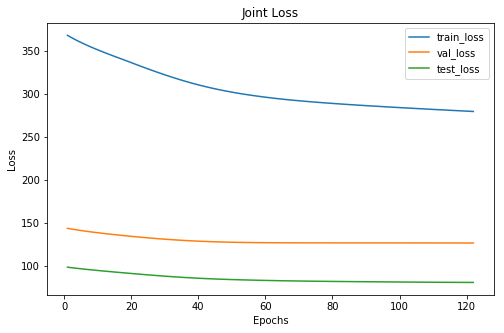

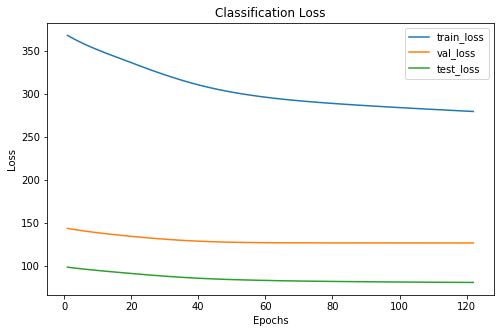

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      134     47      31
 2       67     28      22
xxxxxxxxxxxxxx epoch: 122 xxxxxxxxxxxxxx


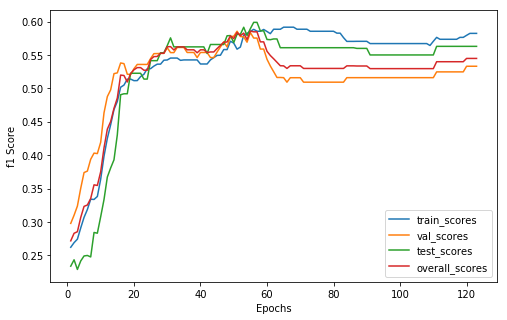

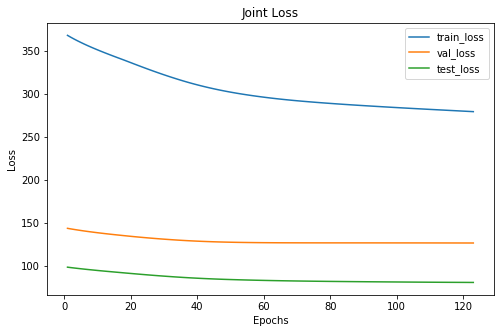

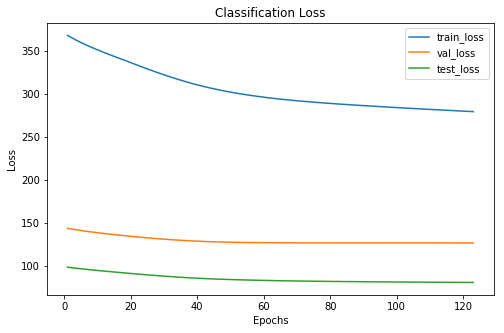

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     55      35
 1      134     47      31
 2       67     28      22
xxxxxxxxxxxxxx epoch: 123 xxxxxxxxxxxxxx


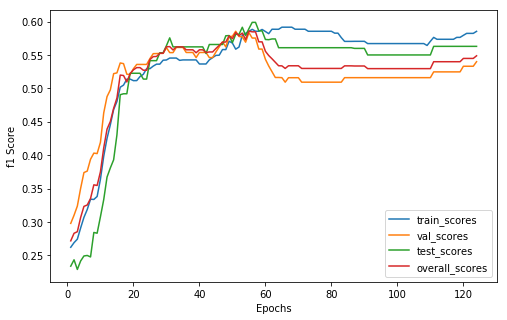

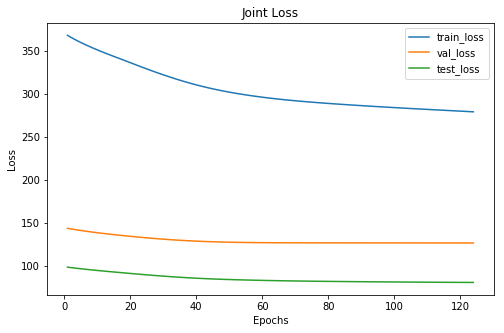

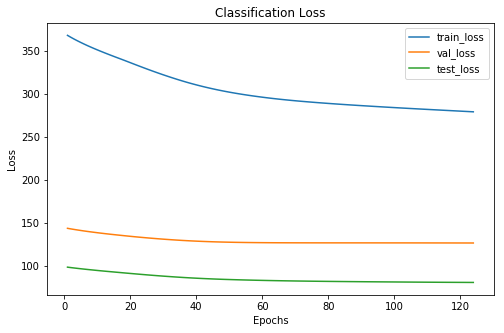

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 124 xxxxxxxxxxxxxx


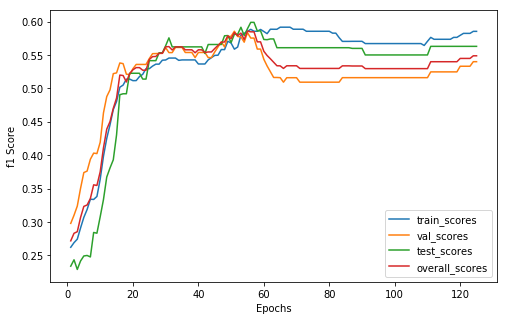

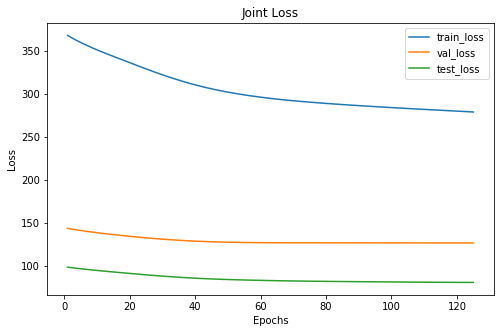

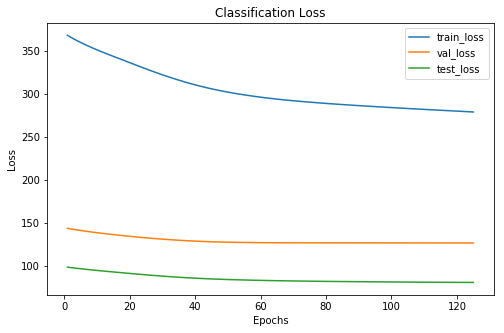

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 125 xxxxxxxxxxxxxx


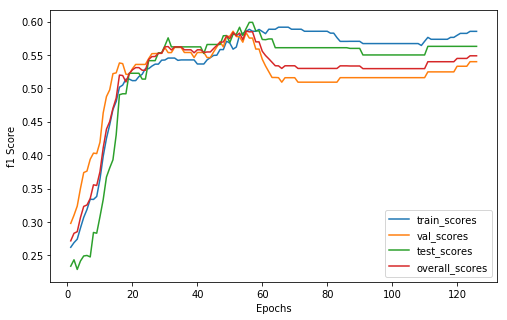

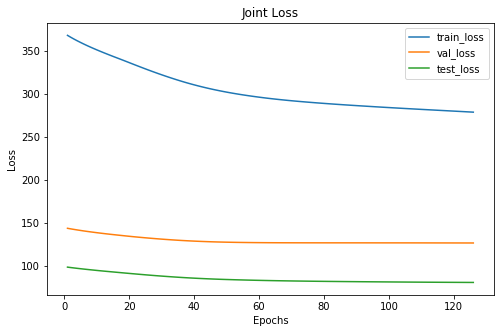

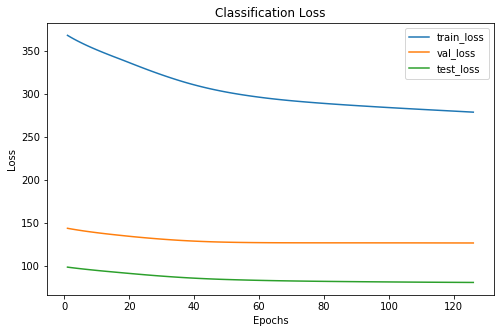

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 126 xxxxxxxxxxxxxx


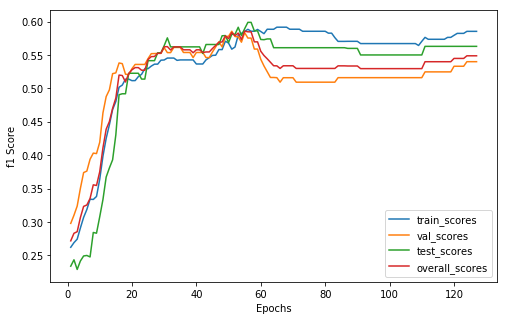

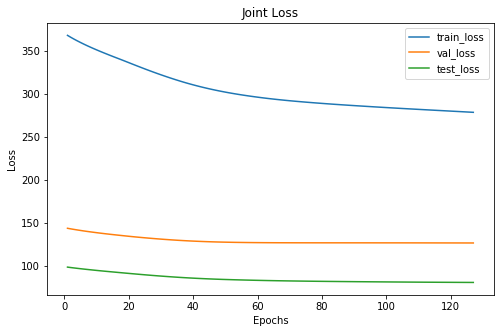

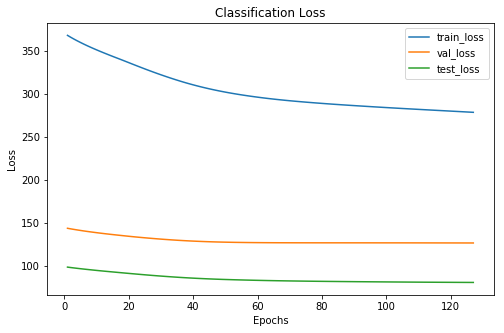

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 127 xxxxxxxxxxxxxx


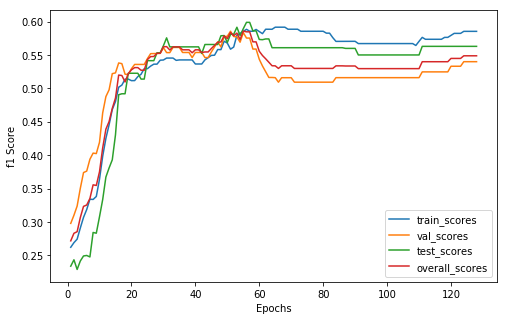

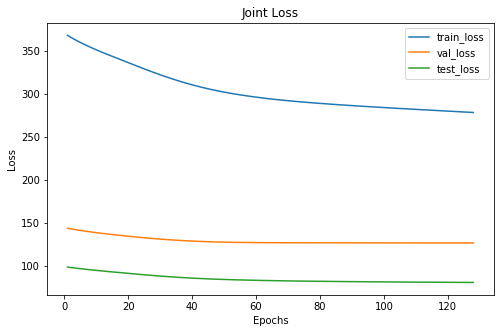

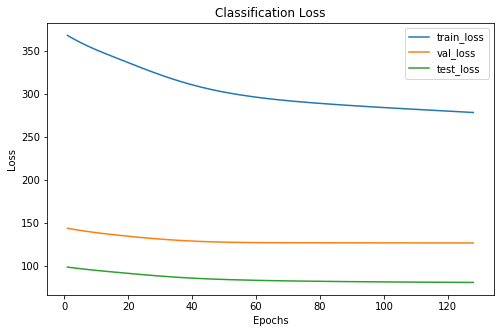

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 128 xxxxxxxxxxxxxx


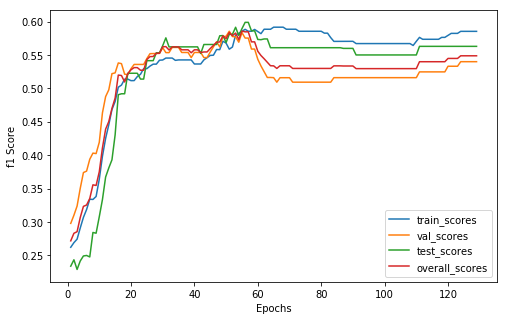

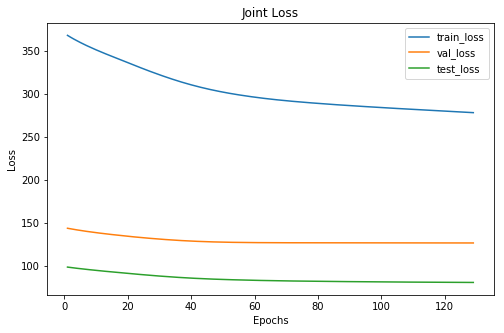

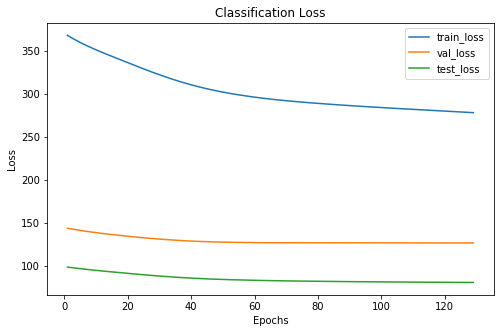

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 129 xxxxxxxxxxxxxx


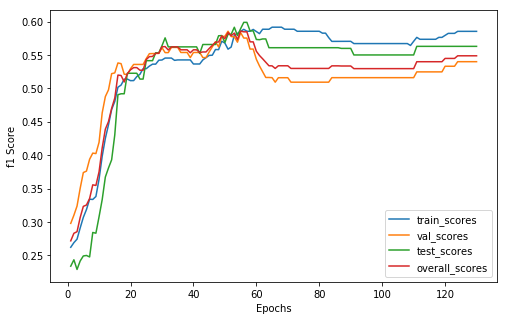

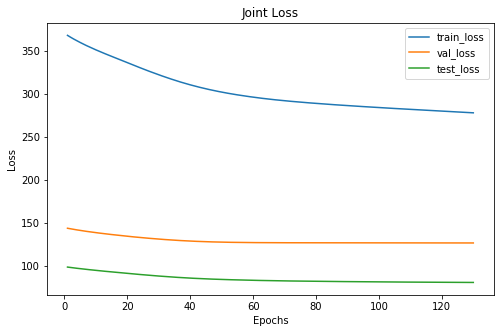

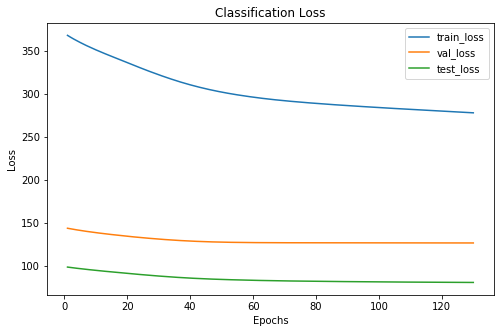

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 2  13  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     56      35
 1      135     47      31
 2       66     27      22
xxxxxxxxxxxxxx epoch: 130 xxxxxxxxxxxxxx


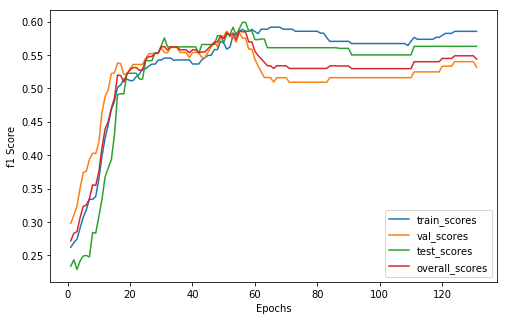

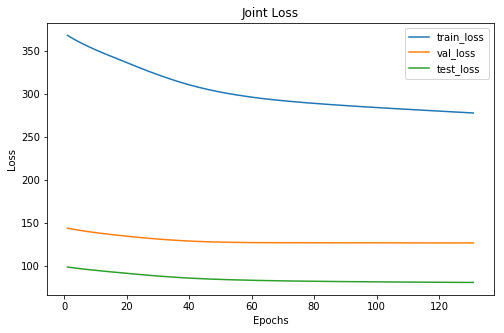

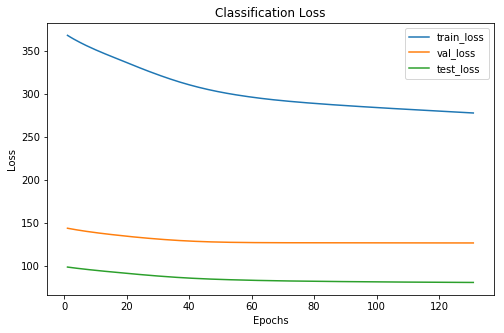

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     57      35
 1      135     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 131 xxxxxxxxxxxxxx


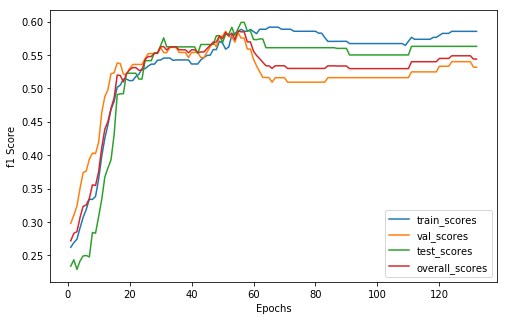

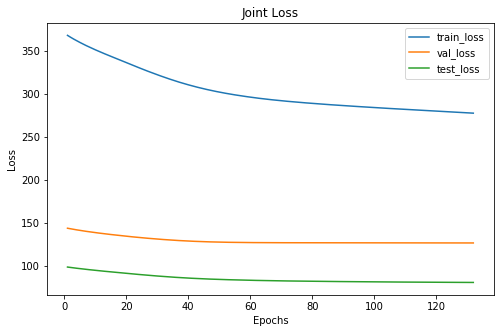

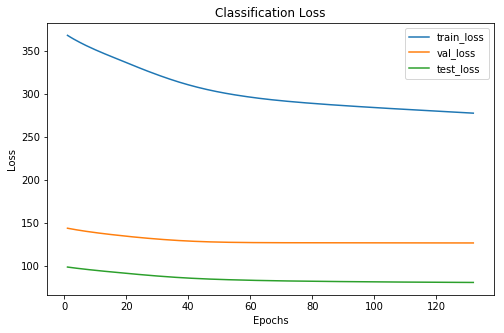

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     57      35
 1      135     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 132 xxxxxxxxxxxxxx


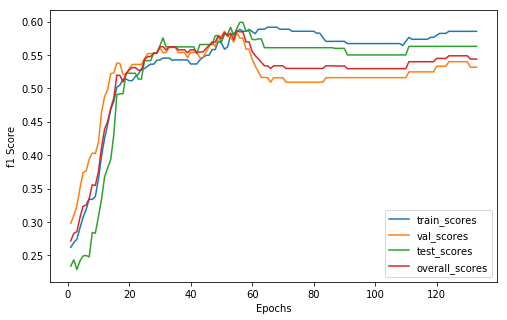

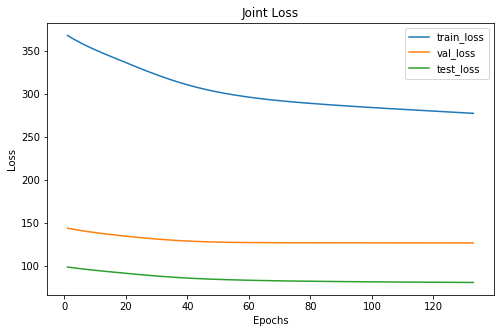

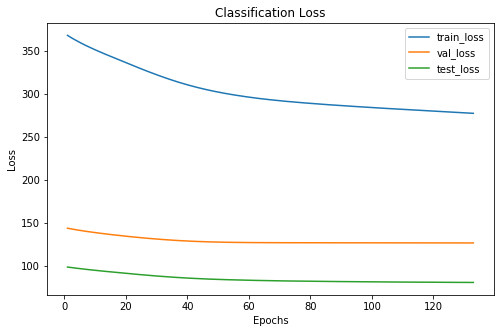

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     57      35
 1      135     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 133 xxxxxxxxxxxxxx


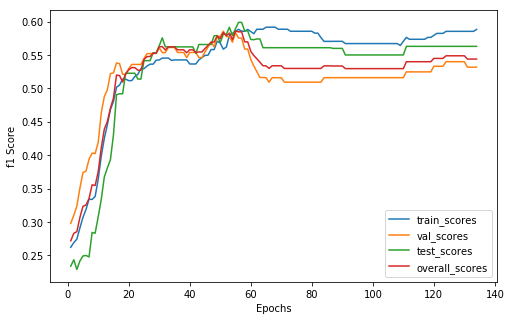

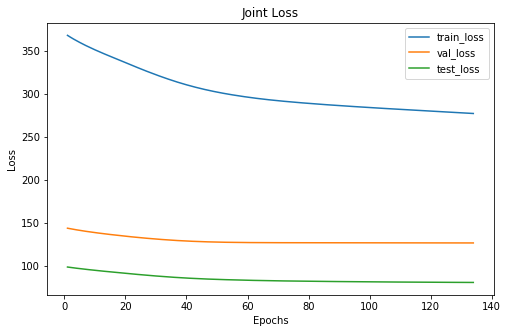

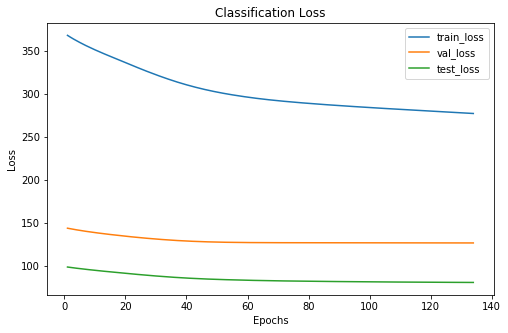

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      125     57      35
 1      136     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 134 xxxxxxxxxxxxxx


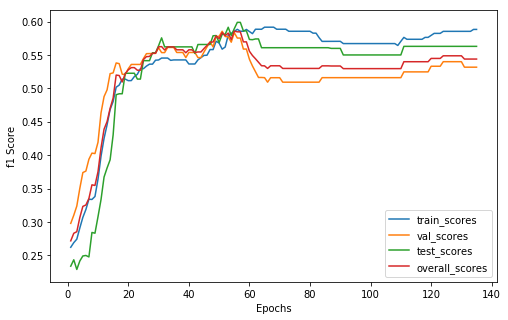

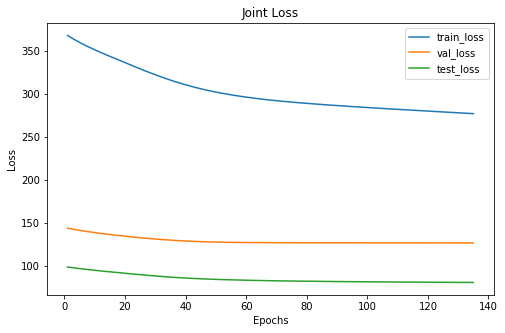

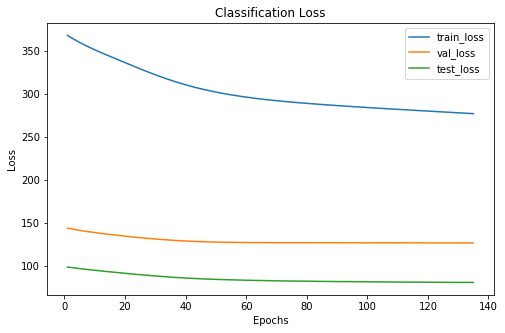

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      125     57      35
 1      136     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 135 xxxxxxxxxxxxxx


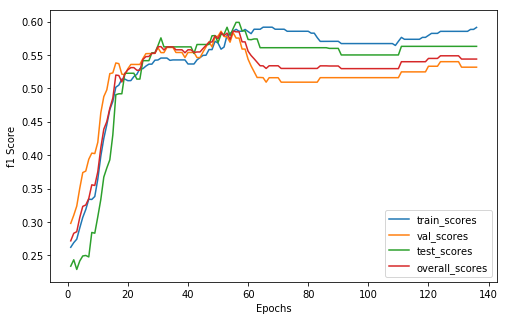

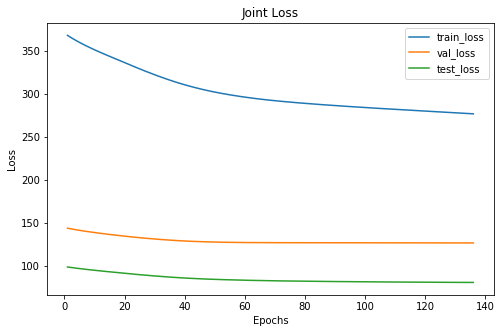

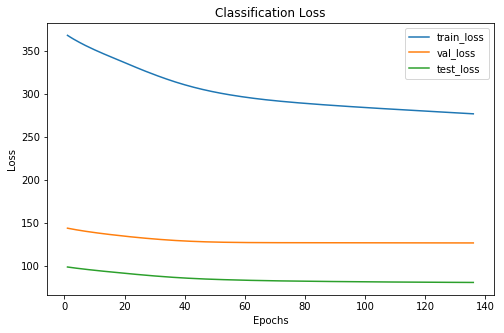

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     57      35
 1      136     47      31
 2       65     26      22
xxxxxxxxxxxxxx epoch: 136 xxxxxxxxxxxxxx


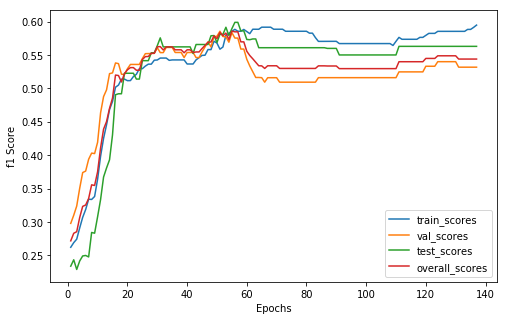

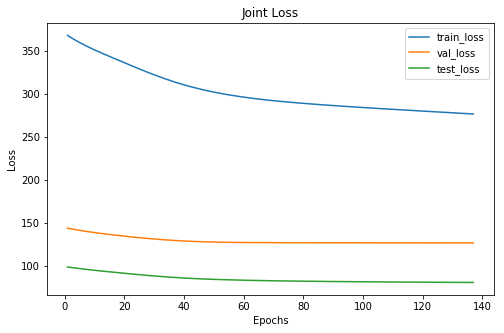

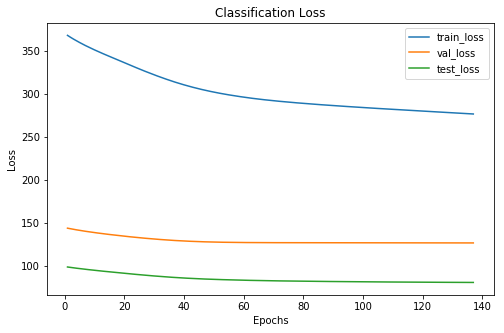

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      125     57      35
 1      136     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 137 xxxxxxxxxxxxxx


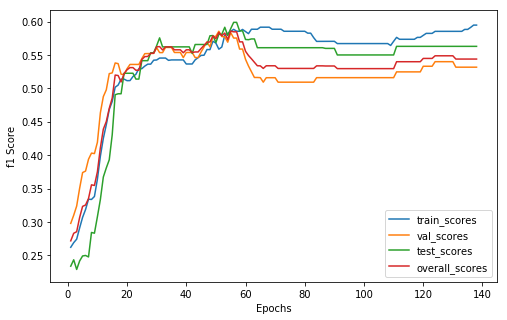

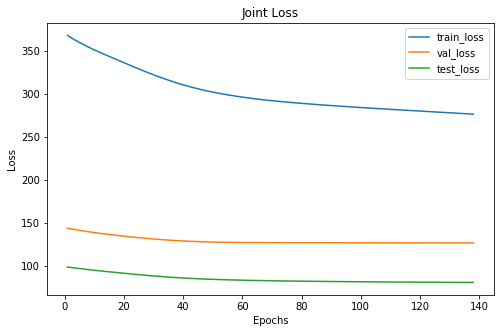

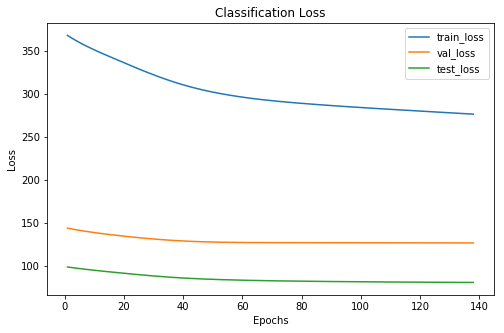

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      125     57      35
 1      136     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 138 xxxxxxxxxxxxxx


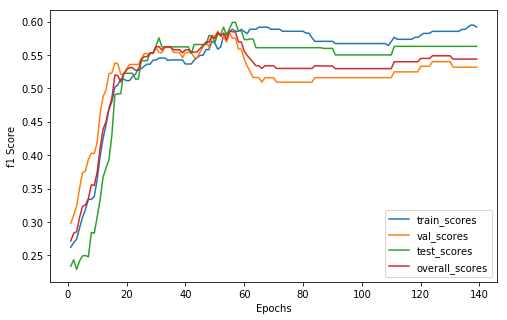

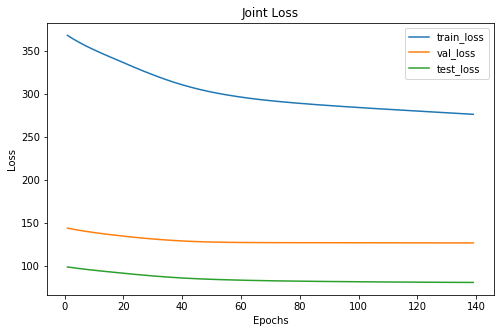

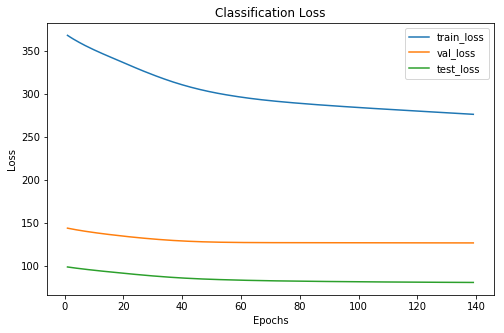

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      124     57      35
 1      137     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 139 xxxxxxxxxxxxxx


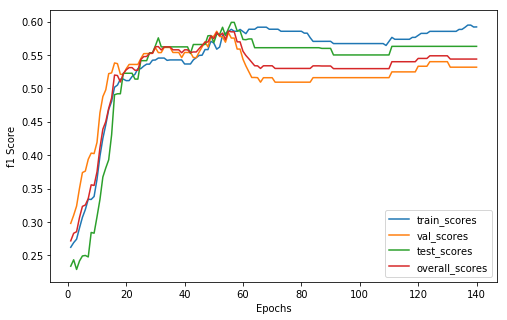

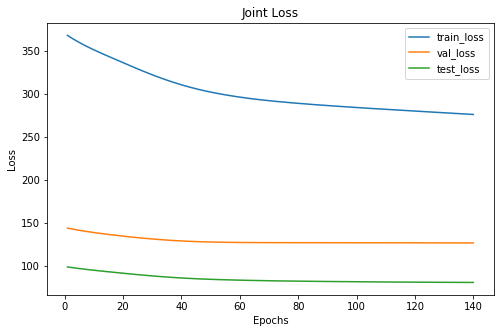

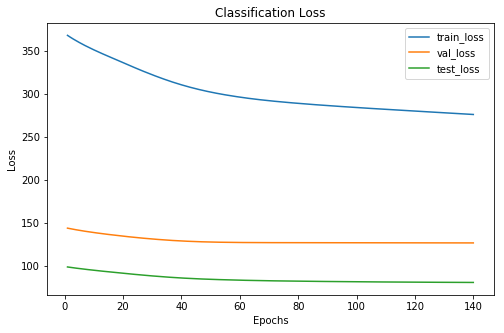

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      125     57      35
 1      137     47      31
 2       65     26      22
xxxxxxxxxxxxxx epoch: 140 xxxxxxxxxxxxxx


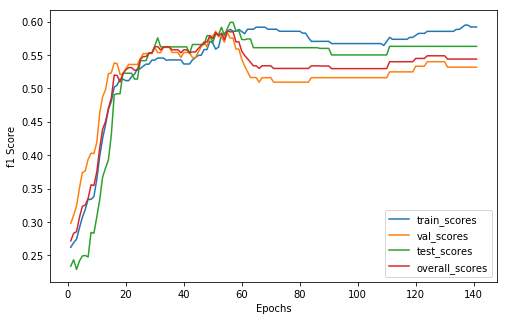

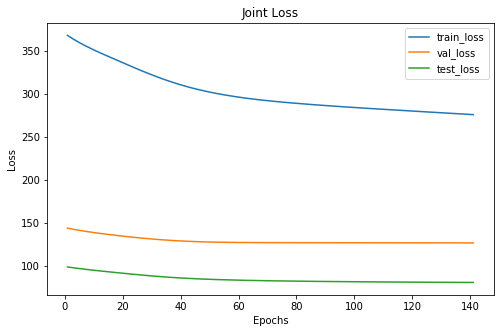

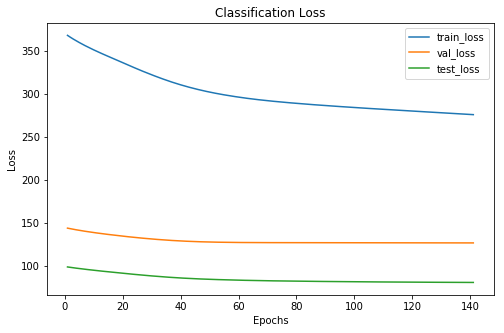

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  24   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      124     57      35
 1      137     47      31
 2       66     26      22
xxxxxxxxxxxxxx epoch: 141 xxxxxxxxxxxxxx


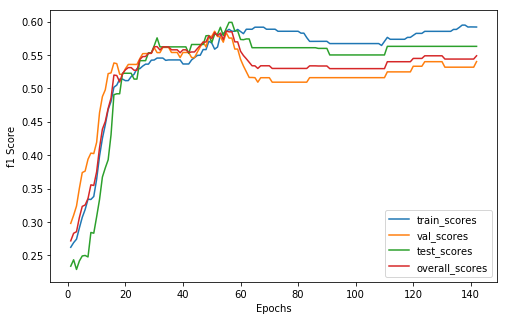

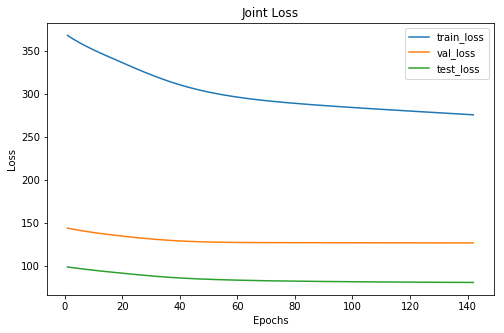

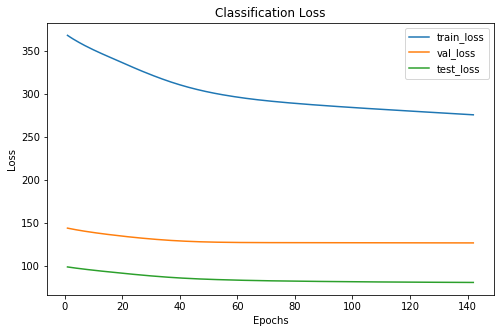

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      124     57      35
 1      137     48      31
 2       66     25      22
xxxxxxxxxxxxxx epoch: 142 xxxxxxxxxxxxxx


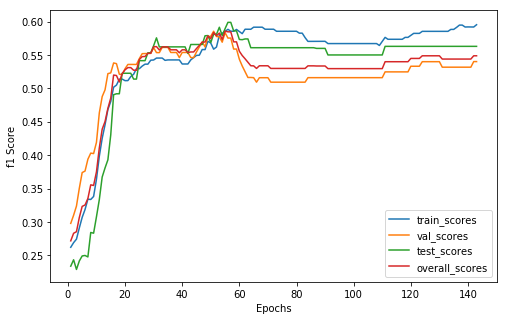

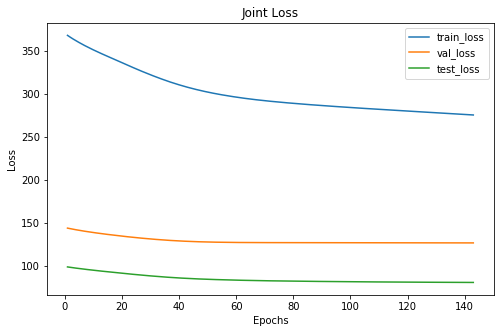

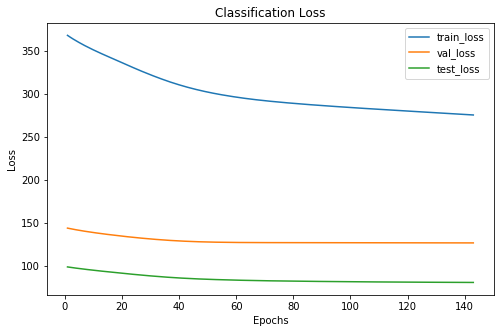

Cofusion Matrix For Val Set: 
--  --  --
32  10   3
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      123     57      35
 1      137     48      31
 2       67     25      22
xxxxxxxxxxxxxx epoch: 143 xxxxxxxxxxxxxx


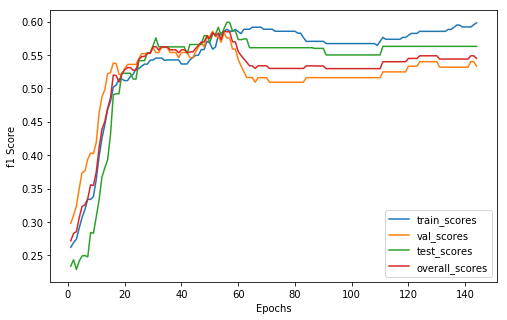

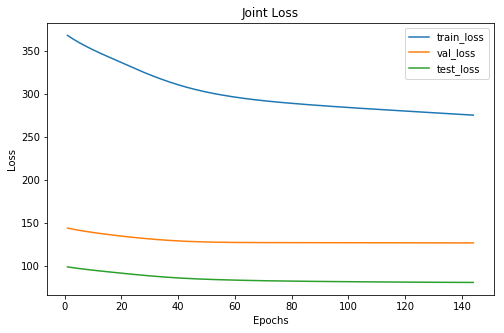

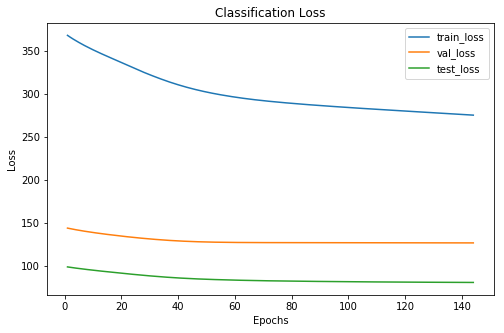

Cofusion Matrix For Val Set: 
--  --  --
31  10   4
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      122     56      35
 1      138     48      31
 2       67     26      22
xxxxxxxxxxxxxx epoch: 144 xxxxxxxxxxxxxx


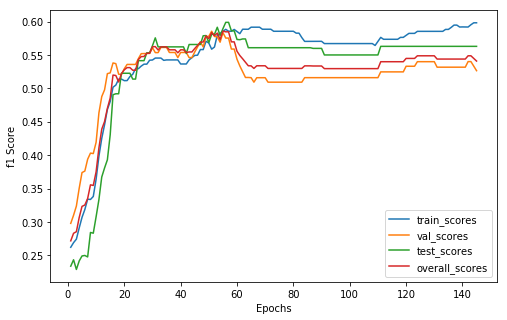

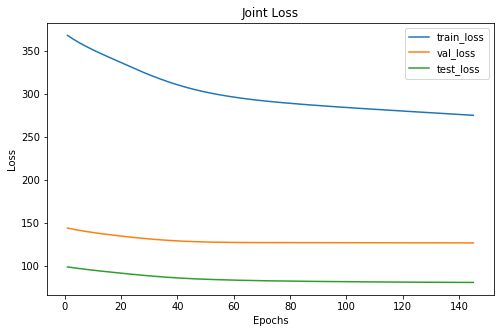

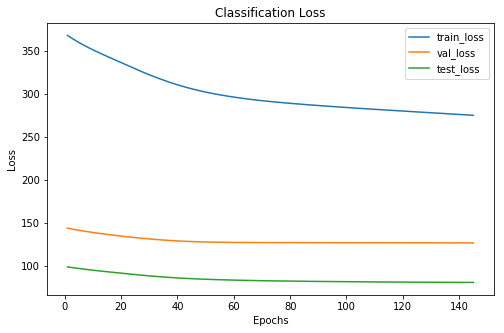

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      122     55      35
 1      138     48      31
 2       67     27      22
xxxxxxxxxxxxxx epoch: 145 xxxxxxxxxxxxxx


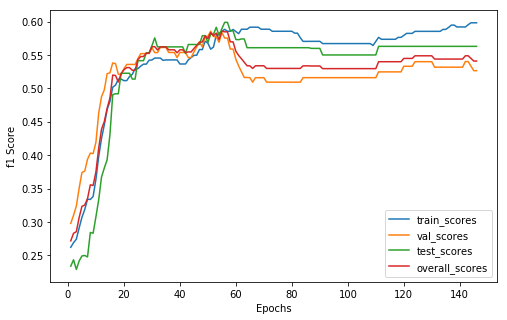

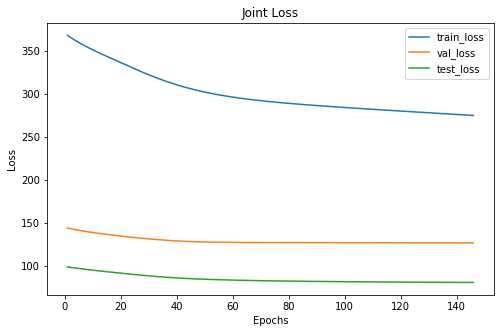

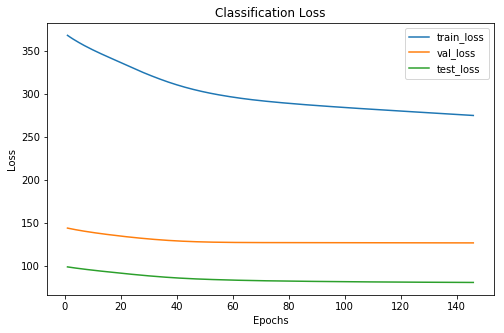

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      122     55      35
 1      138     48      31
 2       67     27      22
xxxxxxxxxxxxxx epoch: 146 xxxxxxxxxxxxxx


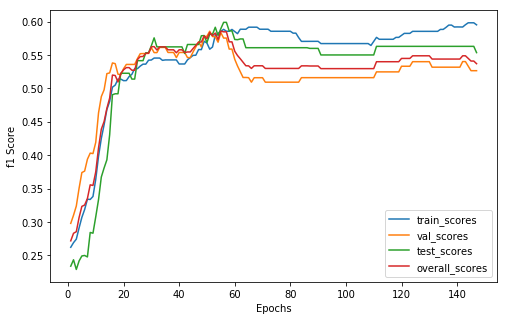

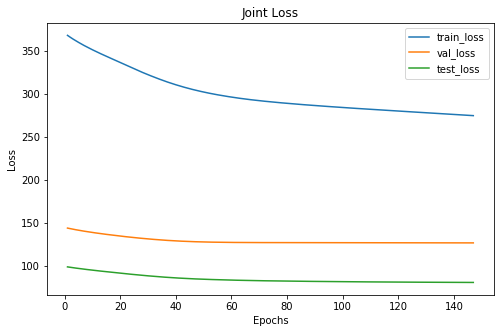

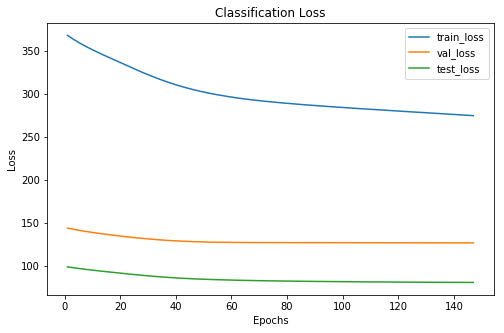

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      121     55      34
 1      138     48      31
 2       68     27      23
xxxxxxxxxxxxxx epoch: 147 xxxxxxxxxxxxxx


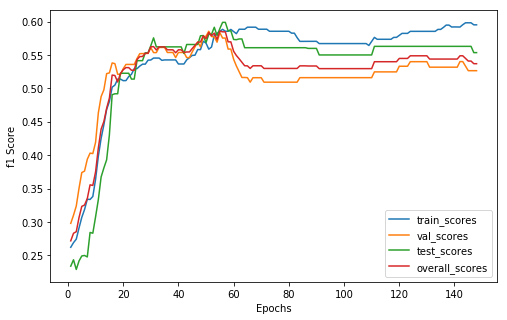

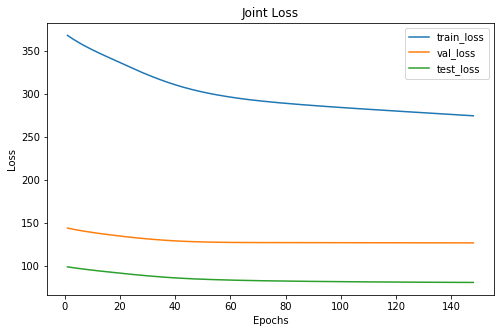

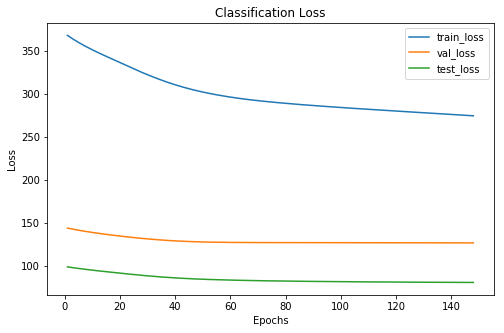

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      121     55      34
 1      138     48      31
 2       68     27      23
xxxxxxxxxxxxxx epoch: 148 xxxxxxxxxxxxxx


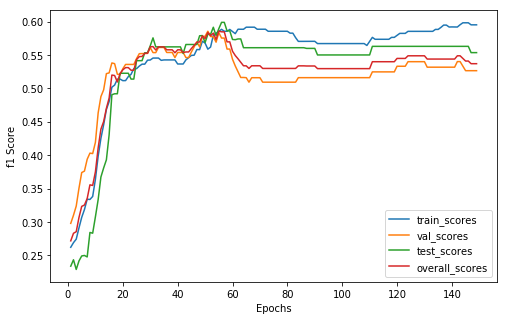

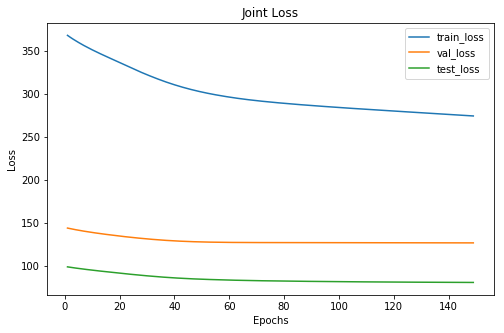

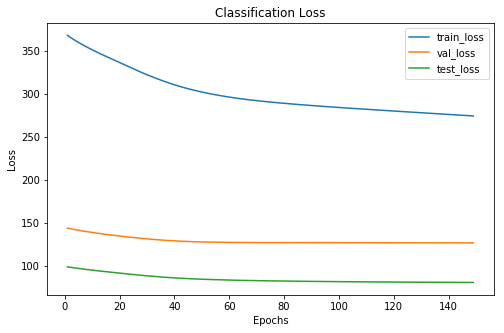

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
22  25   8
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      121     55      34
 1      138     48      31
 2       68     27      23
xxxxxxxxxxxxxx epoch: 149 xxxxxxxxxxxxxx


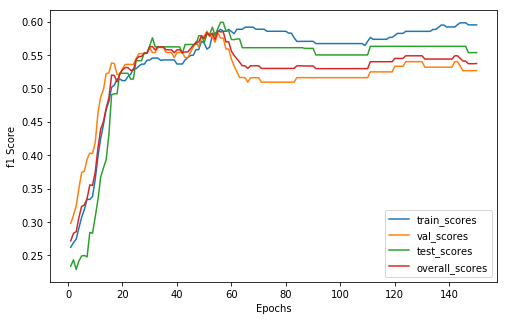

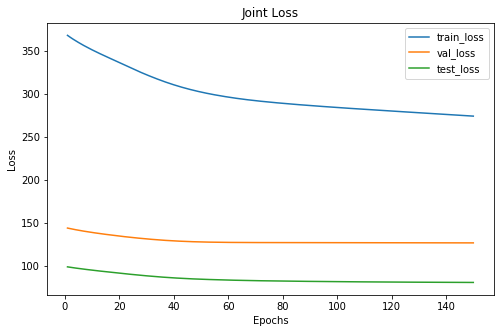

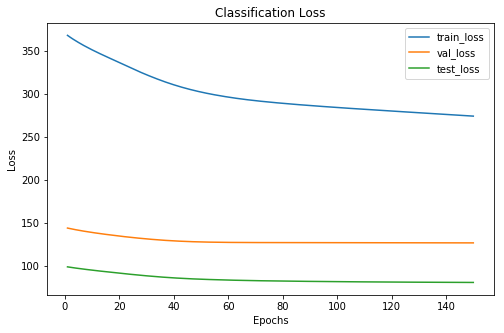

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      120     54      34
 1      138     48      31
 2       69     28      23
xxxxxxxxxxxxxx epoch: 150 xxxxxxxxxxxxxx


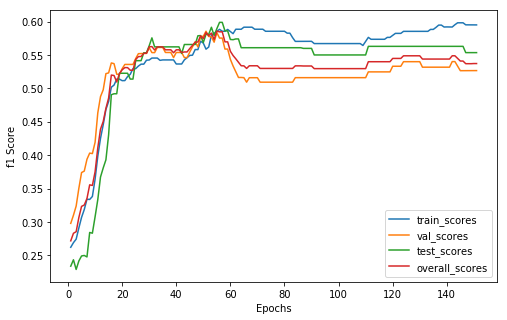

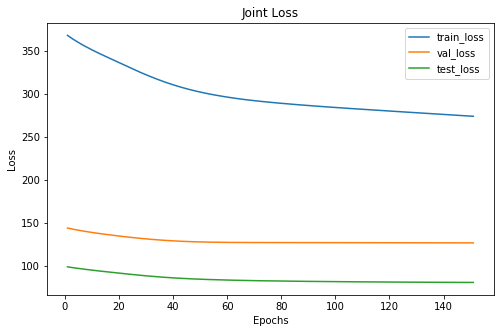

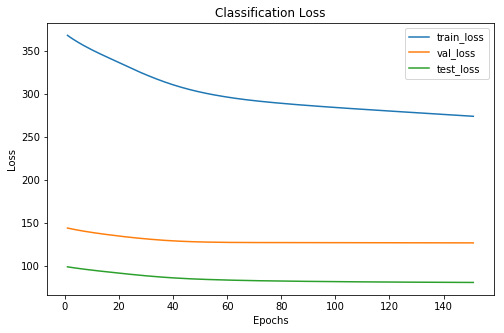

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      120     54      34
 1      138     48      31
 2       69     28      23
xxxxxxxxxxxxxx epoch: 151 xxxxxxxxxxxxxx


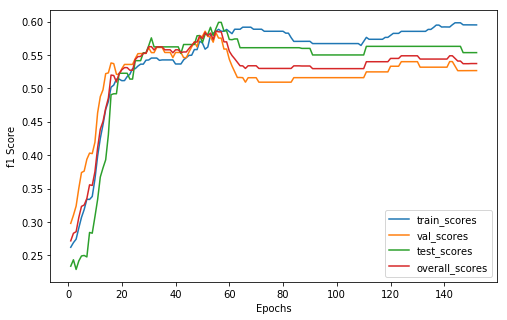

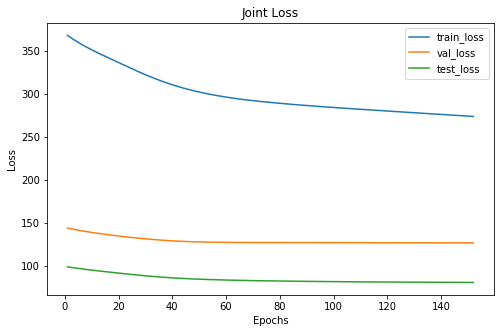

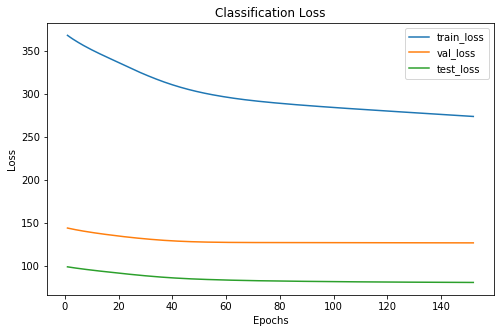

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      120     54      34
 1      138     48      31
 2       69     28      23
xxxxxxxxxxxxxx epoch: 152 xxxxxxxxxxxxxx


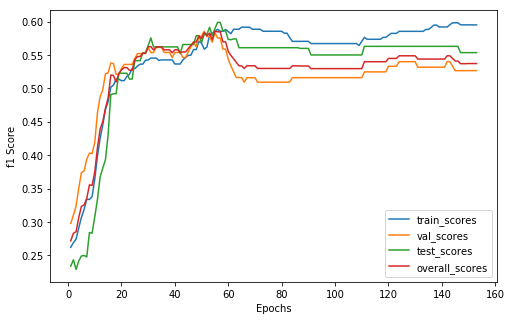

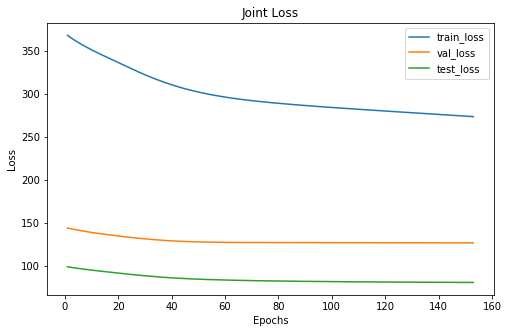

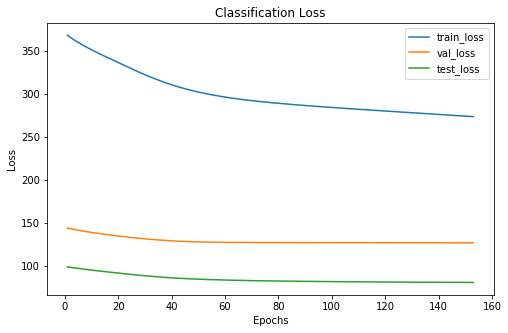

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      120     54      34
 1      138     48      31
 2       69     28      23
xxxxxxxxxxxxxx epoch: 153 xxxxxxxxxxxxxx


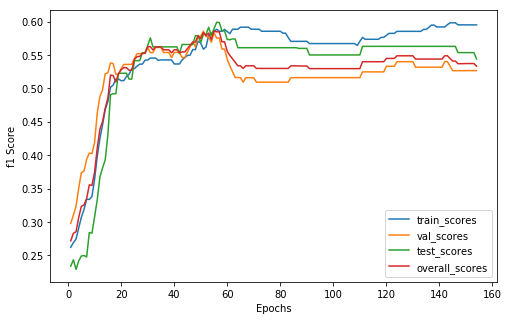

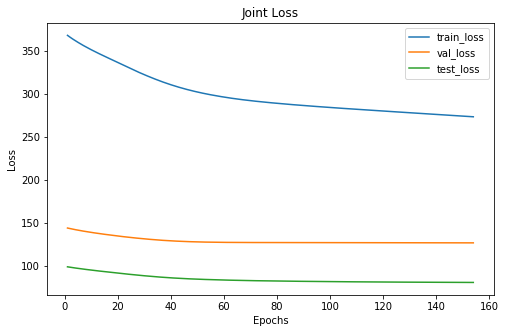

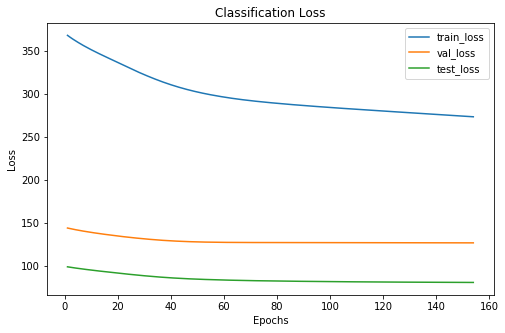

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      120     54      33
 1      138     48      31
 2       69     28      24
xxxxxxxxxxxxxx epoch: 154 xxxxxxxxxxxxxx


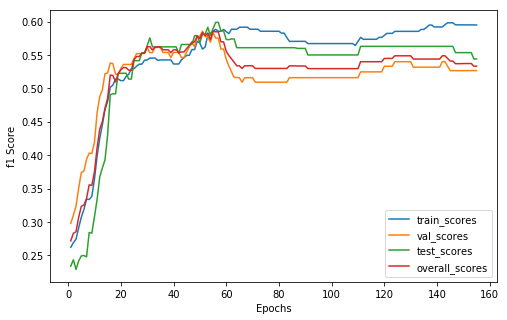

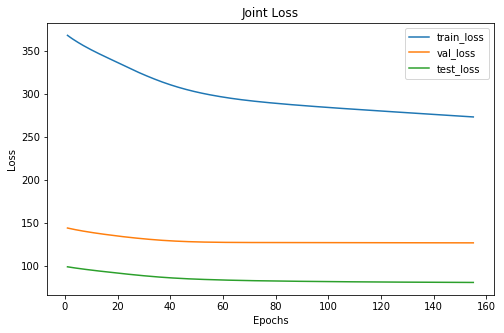

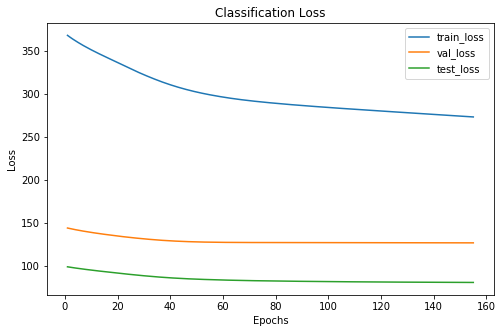

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      119     54      33
 1      138     48      31
 2       70     28      24
xxxxxxxxxxxxxx epoch: 155 xxxxxxxxxxxxxx


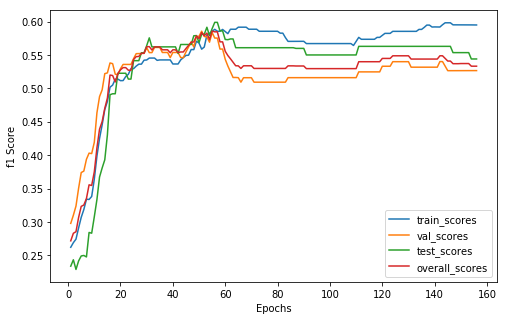

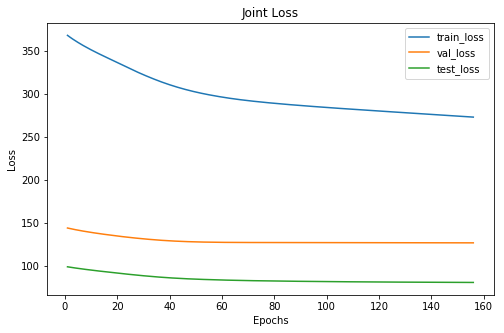

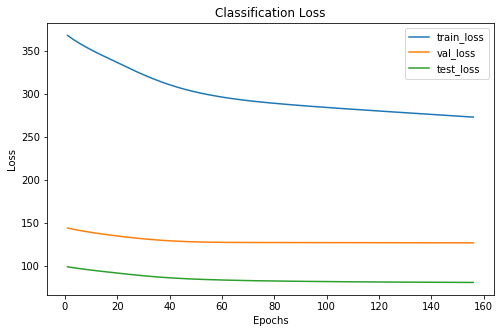

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      119     54      33
 1      138     48      31
 2       70     28      24
xxxxxxxxxxxxxx epoch: 156 xxxxxxxxxxxxxx


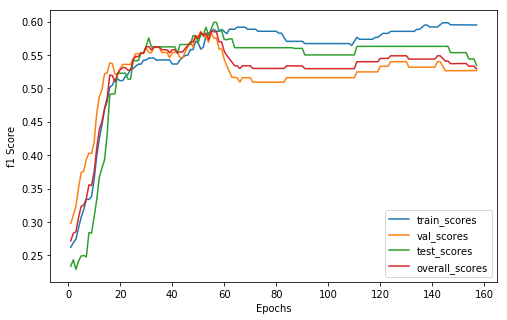

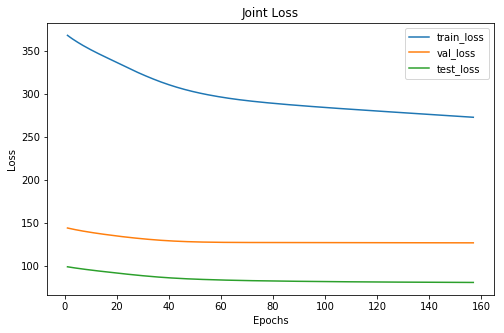

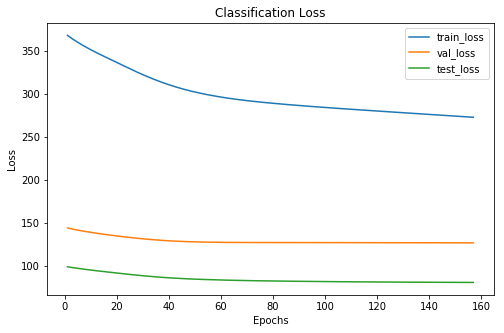

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
21  25   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      118     54      32
 1      139     48      31
 2       70     28      25
xxxxxxxxxxxxxx epoch: 157 xxxxxxxxxxxxxx


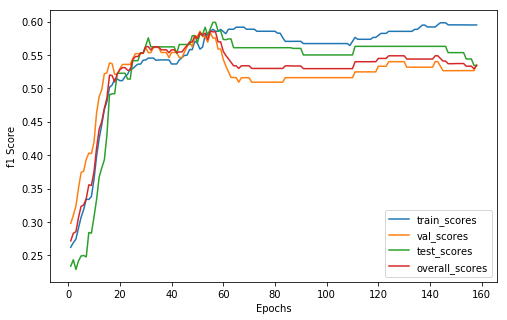

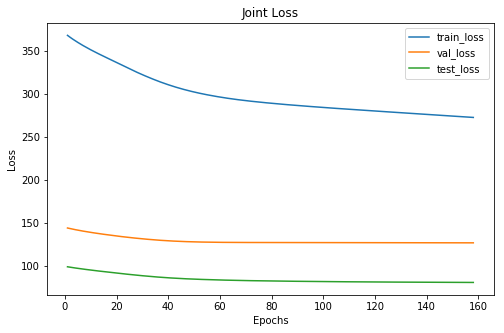

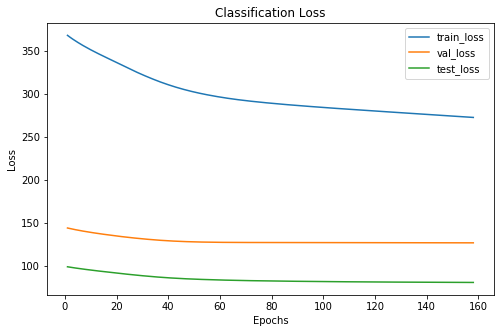

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
20  26   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      118     53      32
 1      139     49      31
 2       70     28      25
xxxxxxxxxxxxxx epoch: 158 xxxxxxxxxxxxxx


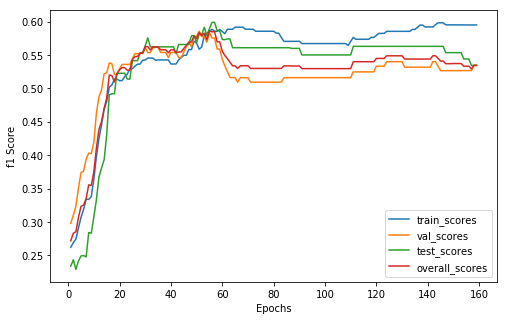

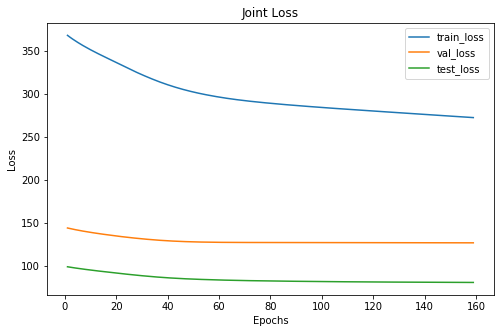

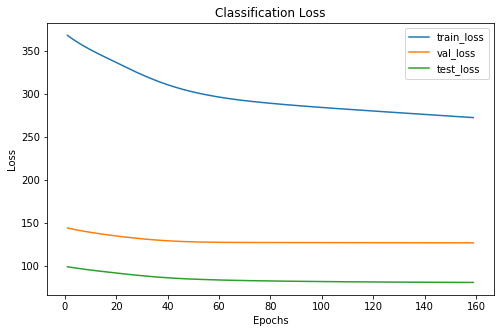

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
20  26   9
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      118     53      32
 1      139     49      31
 2       70     28      25
xxxxxxxxxxxxxx epoch: 159 xxxxxxxxxxxxxx


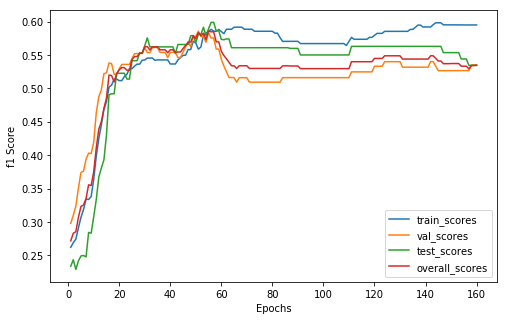

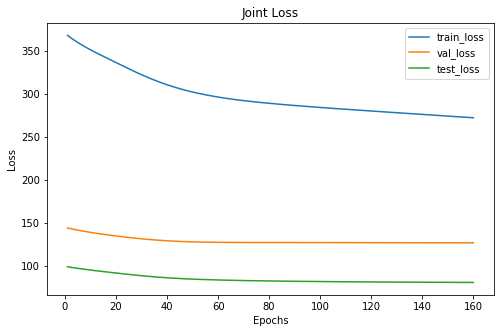

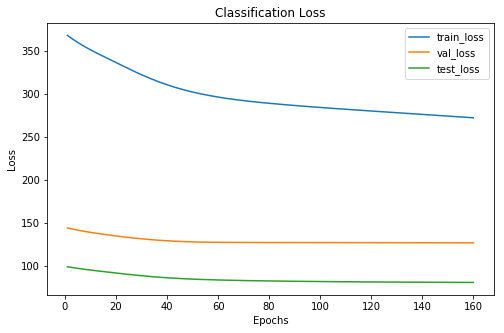

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      118     52      32
 1      139     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 160 xxxxxxxxxxxxxx


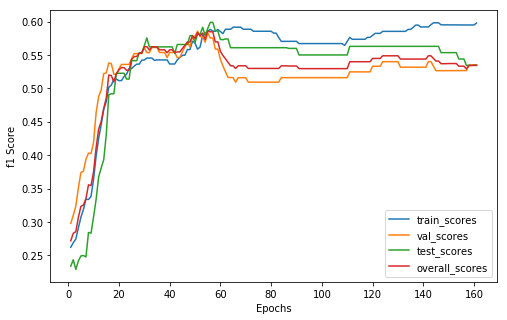

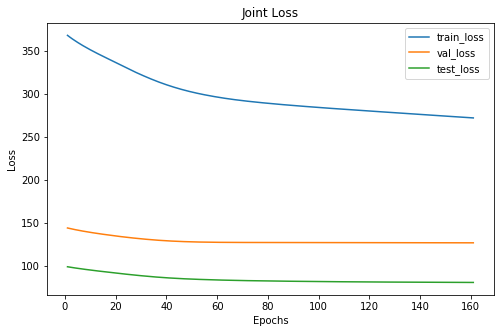

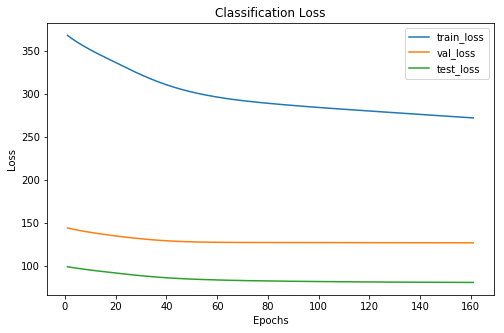

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      117     52      32
 1      140     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 161 xxxxxxxxxxxxxx


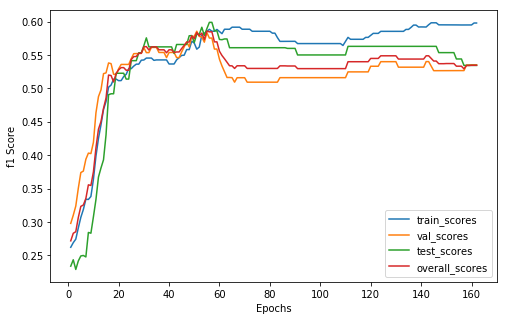

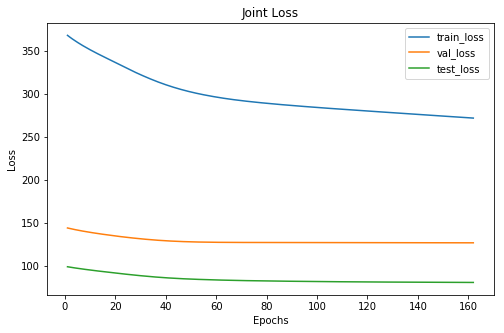

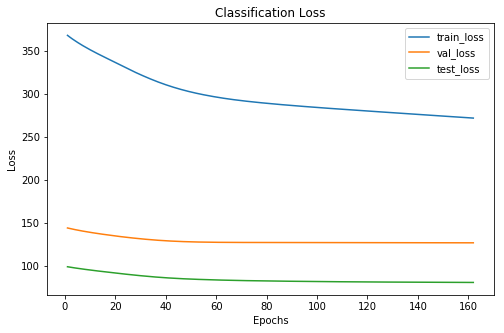

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      117     52      32
 1      140     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 162 xxxxxxxxxxxxxx


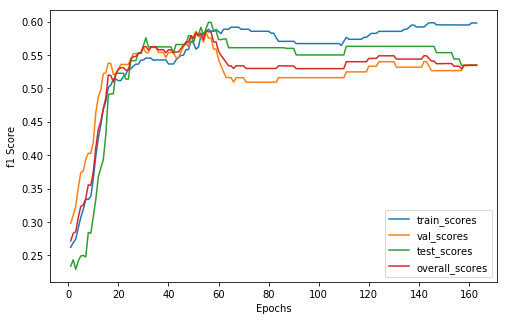

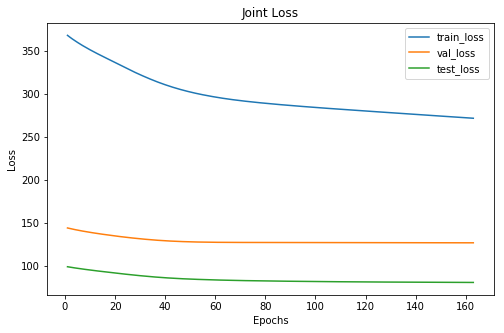

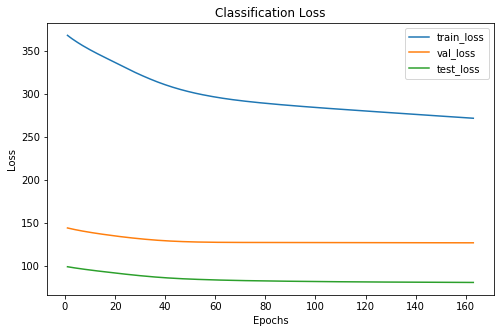

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      117     52      32
 1      140     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 163 xxxxxxxxxxxxxx


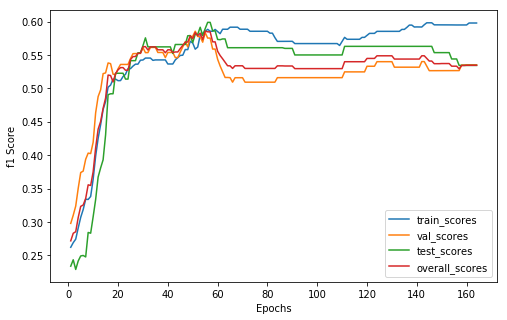

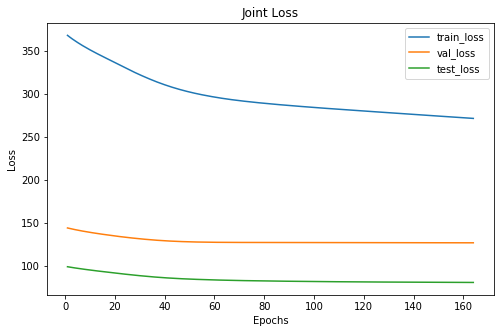

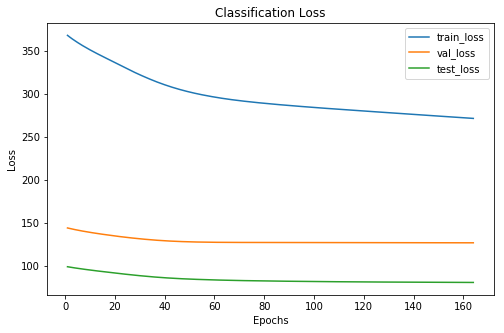

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      117     52      32
 1      140     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 164 xxxxxxxxxxxxxx


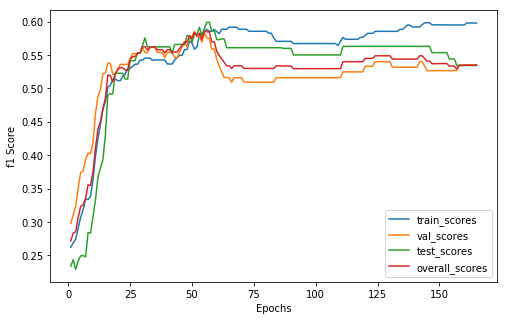

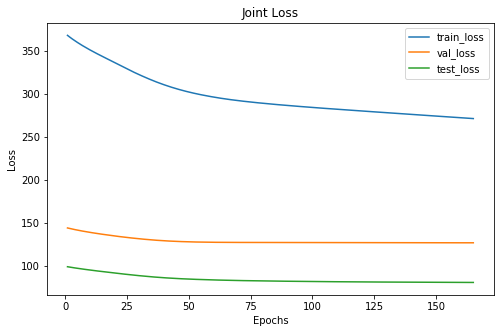

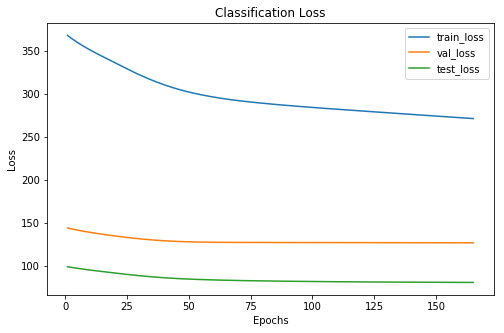

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      117     52      32
 1      140     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 165 xxxxxxxxxxxxxx


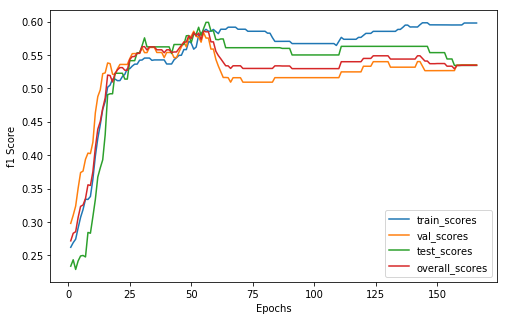

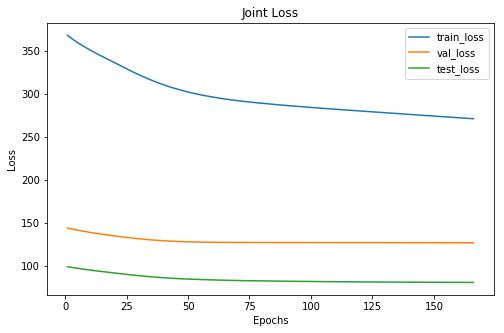

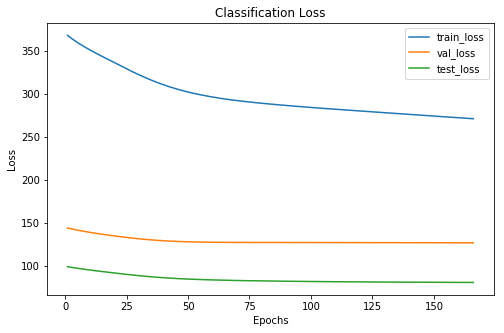

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
19  26  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      117     52      32
 1      140     49      31
 2       70     29      25
xxxxxxxxxxxxxx epoch: 166 xxxxxxxxxxxxxx


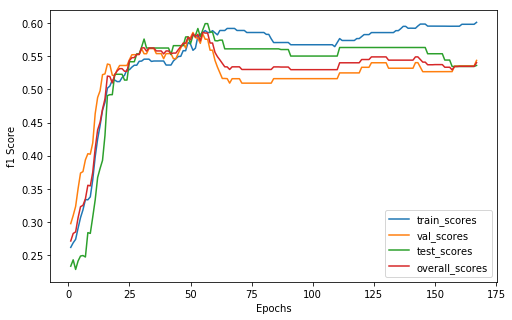

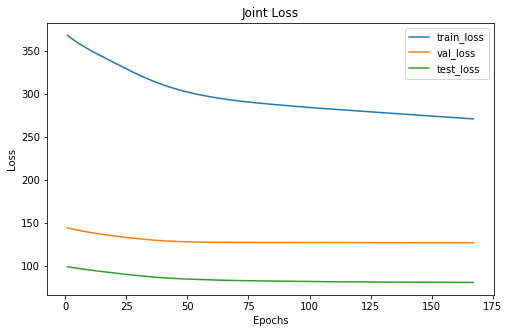

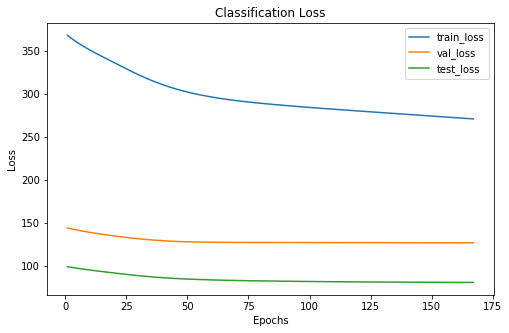

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      116     51      31
 1      141     50      32
 2       70     29      25
xxxxxxxxxxxxxx epoch: 167 xxxxxxxxxxxxxx


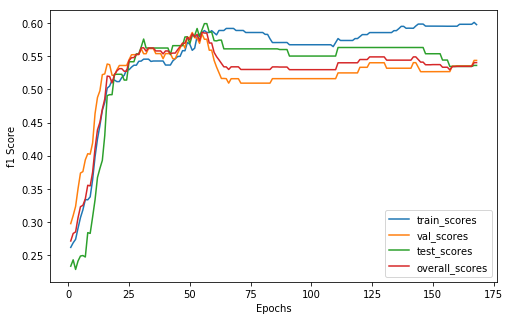

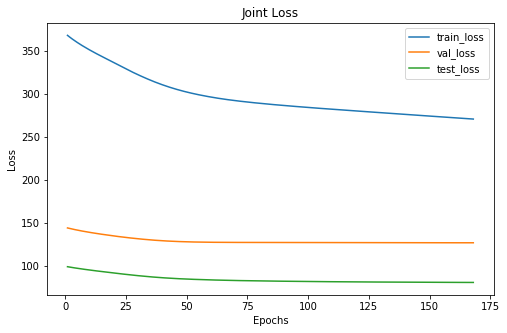

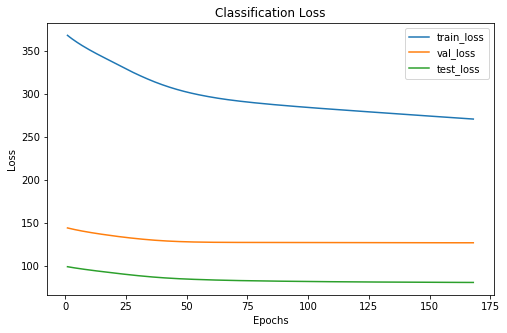

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     51      31
 1      142     50      32
 2       70     29      25
xxxxxxxxxxxxxx epoch: 168 xxxxxxxxxxxxxx


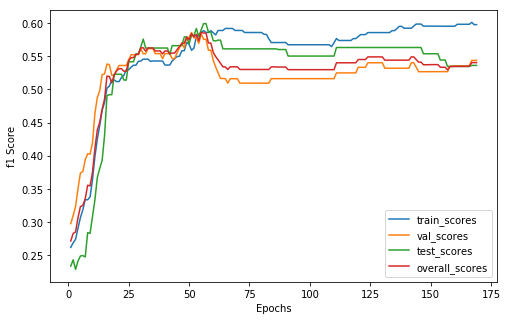

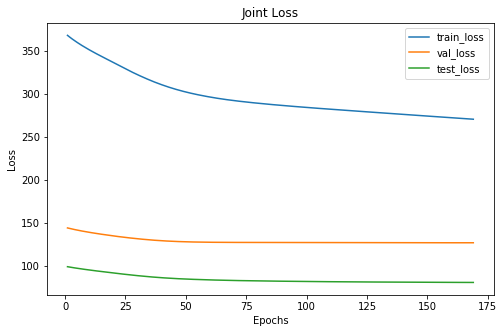

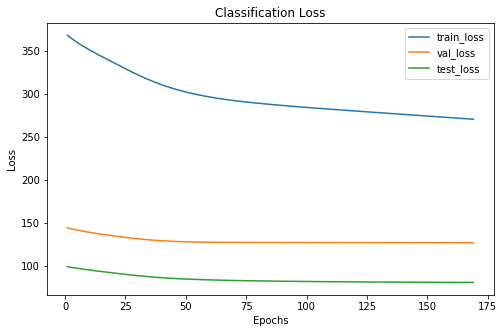

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     51      31
 1      142     50      32
 2       70     29      25
xxxxxxxxxxxxxx epoch: 169 xxxxxxxxxxxxxx


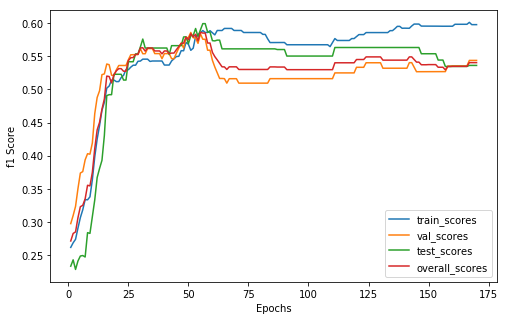

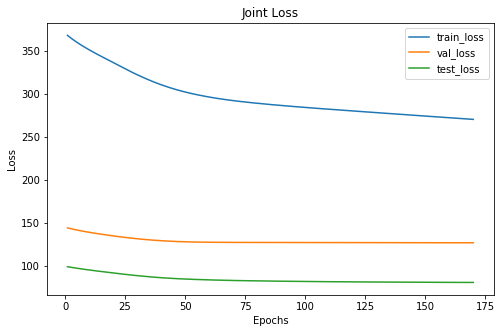

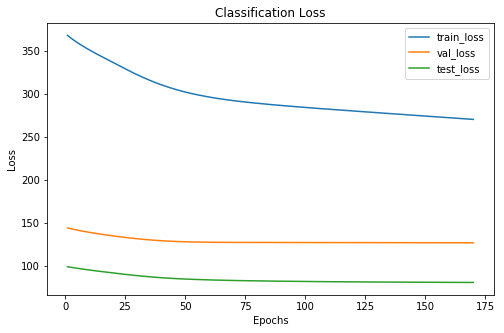

Cofusion Matrix For Val Set: 
--  --  --
30  10   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     51      31
 1      142     50      32
 2       70     29      25
xxxxxxxxxxxxxx epoch: 170 xxxxxxxxxxxxxx


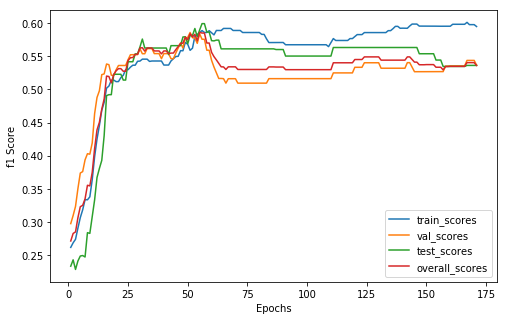

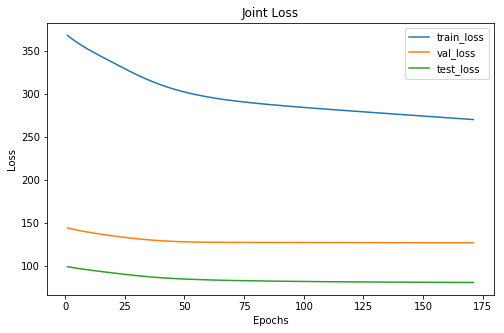

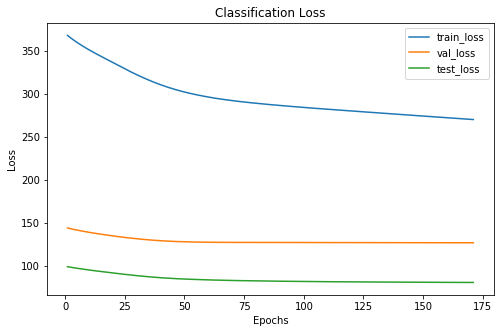

Cofusion Matrix For Val Set: 
--  --  --
29  11   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     50      31
 1      142     51      32
 2       70     29      25
xxxxxxxxxxxxxx epoch: 171 xxxxxxxxxxxxxx


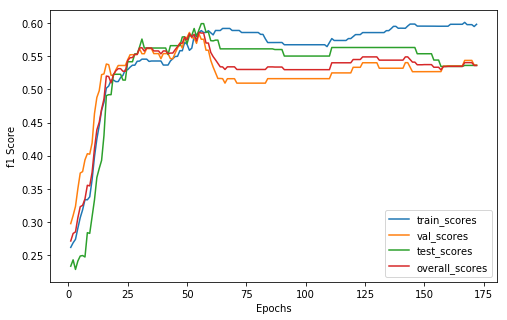

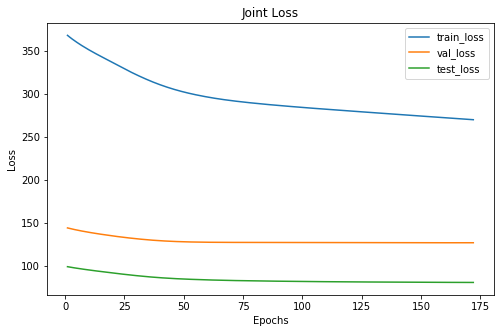

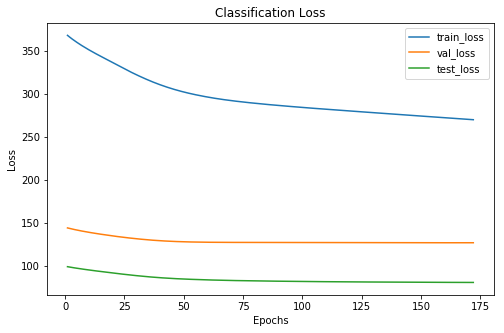

Cofusion Matrix For Val Set: 
--  --  --
29  11   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     50      31
 1      141     51      32
 2       71     29      25
xxxxxxxxxxxxxx epoch: 172 xxxxxxxxxxxxxx


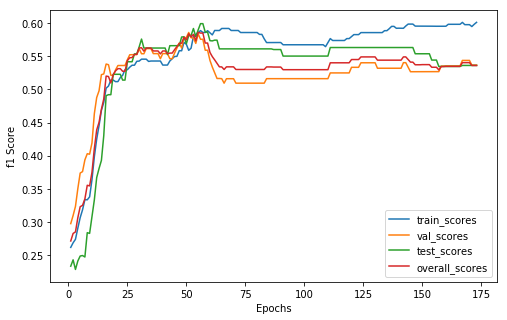

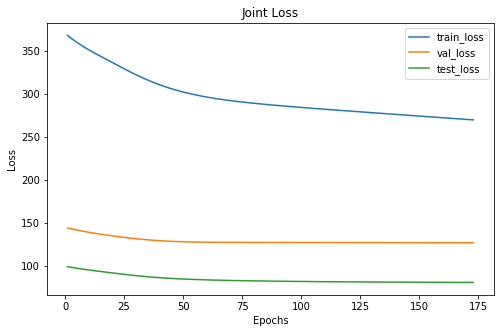

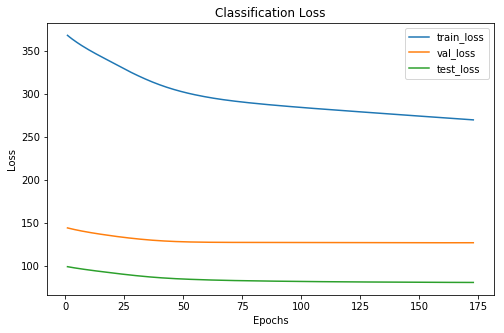

Cofusion Matrix For Val Set: 
--  --  --
29  11   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      116     50      31
 1      140     51      32
 2       71     29      25
xxxxxxxxxxxxxx epoch: 173 xxxxxxxxxxxxxx


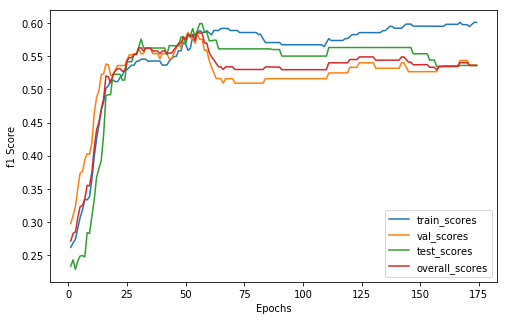

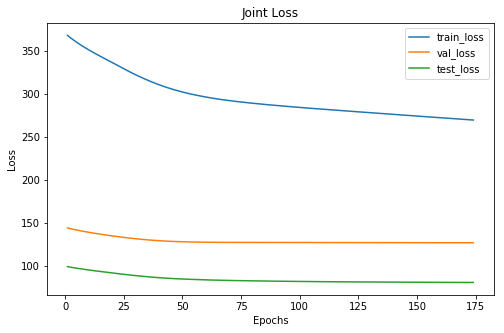

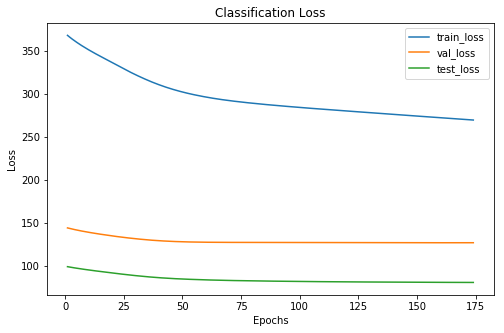

Cofusion Matrix For Val Set: 
--  --  --
29  11   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      116     50      31
 1      140     51      32
 2       71     29      25
xxxxxxxxxxxxxx epoch: 174 xxxxxxxxxxxxxx


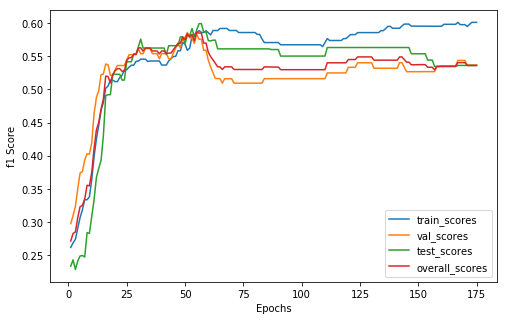

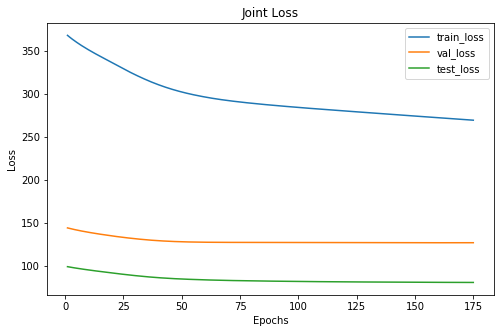

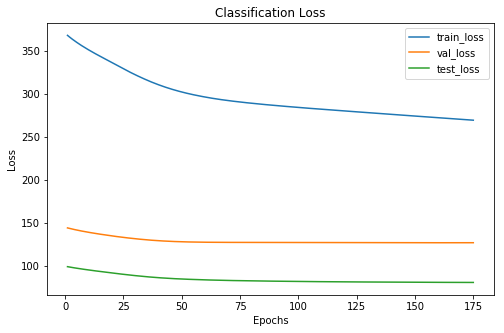

Cofusion Matrix For Val Set: 
--  --  --
29  11   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      116     50      31
 1      140     51      32
 2       71     29      25
xxxxxxxxxxxxxx epoch: 175 xxxxxxxxxxxxxx


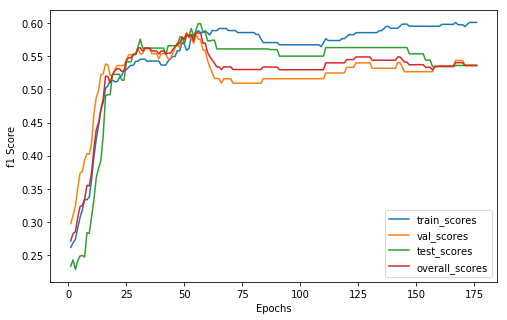

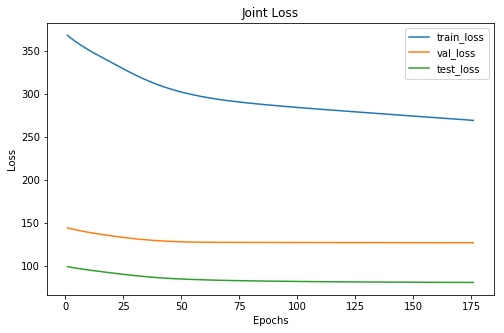

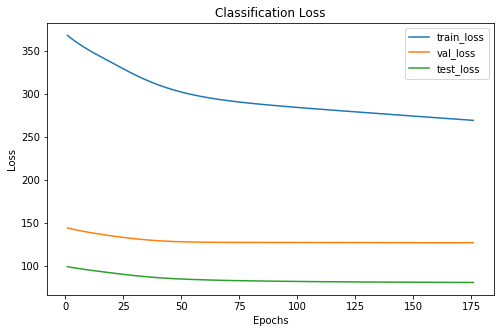

Cofusion Matrix For Val Set: 
--  --  --
29  11   5
18  27  10
 3  13  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     50      31
 1      141     51      32
 2       71     29      25
xxxxxxxxxxxxxx epoch: 176 xxxxxxxxxxxxxx


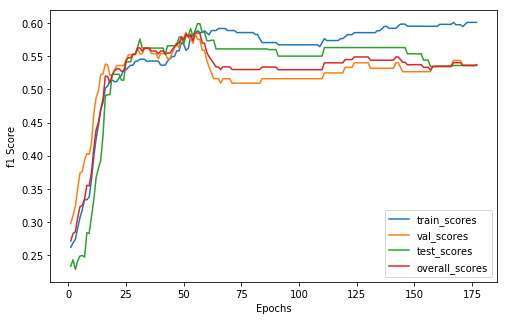

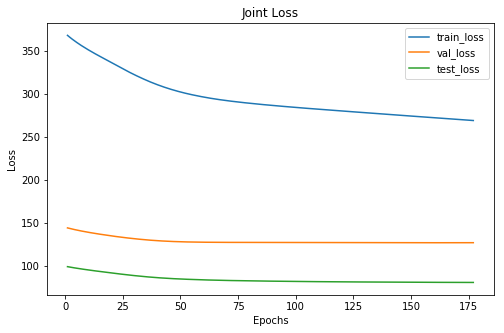

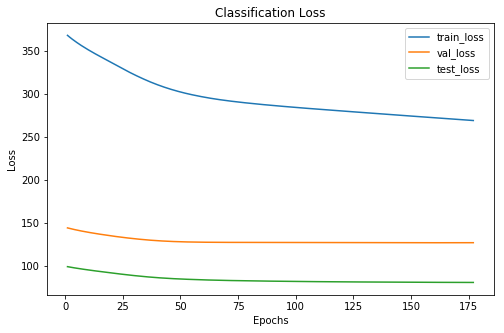

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      141     50      32
 2       71     31      25
xxxxxxxxxxxxxx epoch: 177 xxxxxxxxxxxxxx


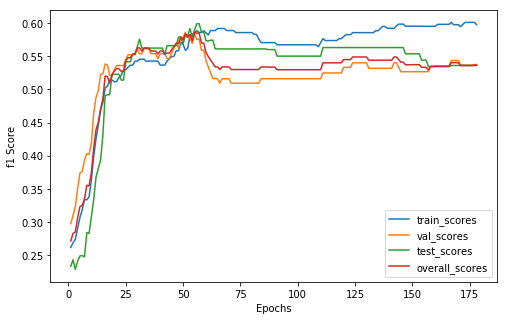

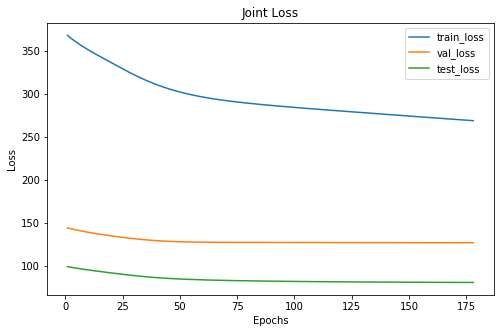

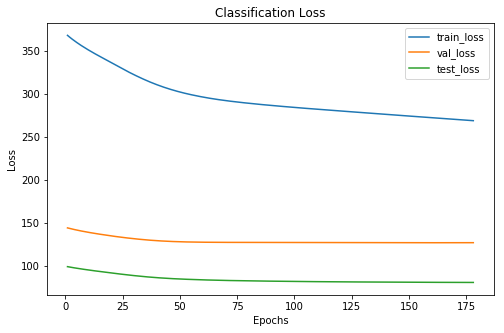

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      142     50      32
 2       70     31      25
xxxxxxxxxxxxxx epoch: 178 xxxxxxxxxxxxxx


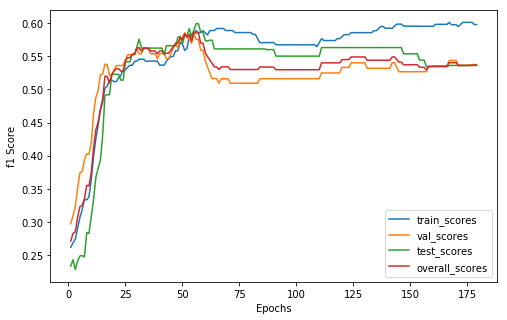

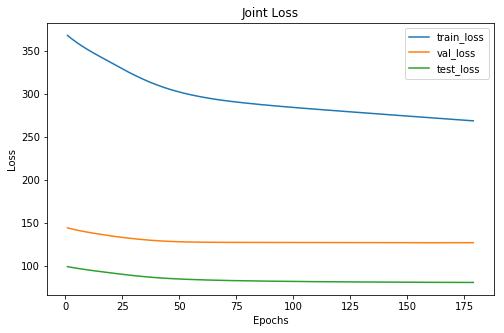

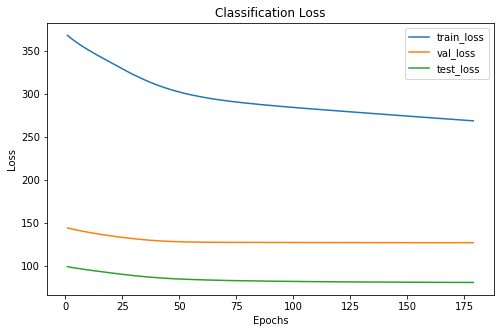

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      142     50      32
 2       70     31      25
xxxxxxxxxxxxxx epoch: 179 xxxxxxxxxxxxxx


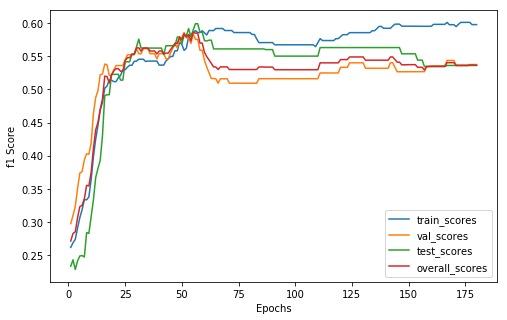

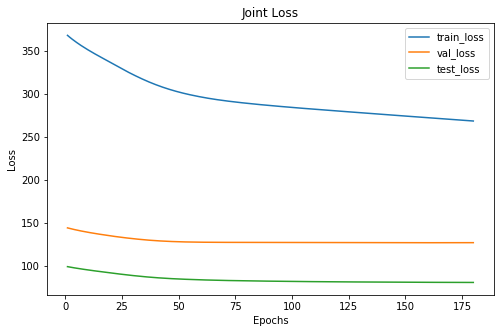

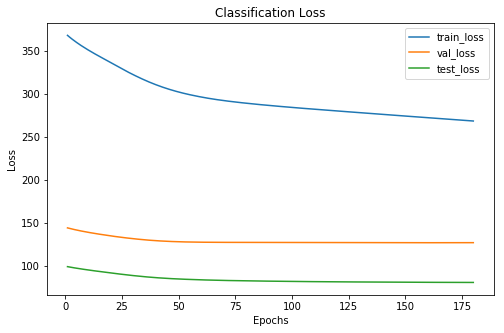

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      142     50      32
 2       70     31      25
xxxxxxxxxxxxxx epoch: 180 xxxxxxxxxxxxxx


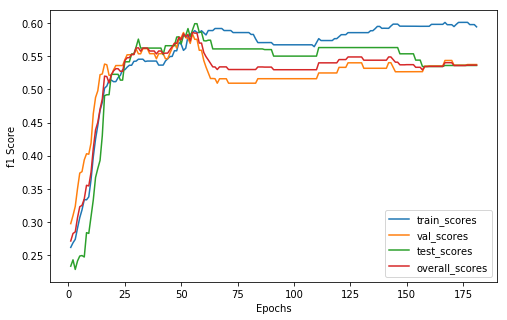

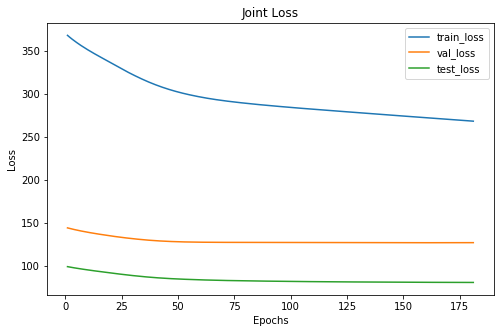

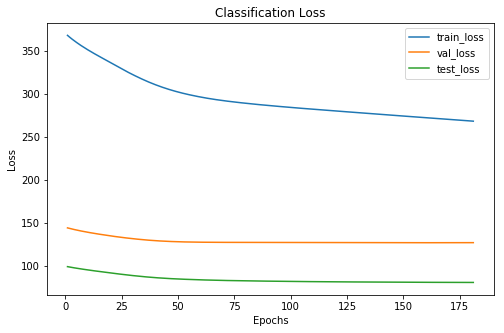

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      143     50      32
 2       69     31      25
xxxxxxxxxxxxxx epoch: 181 xxxxxxxxxxxxxx


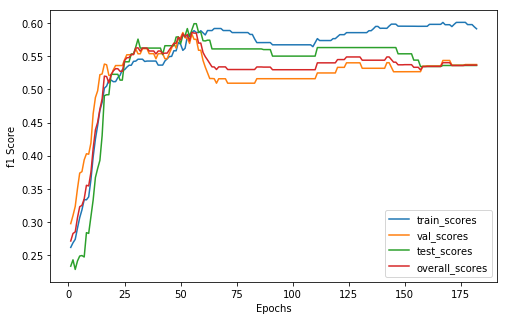

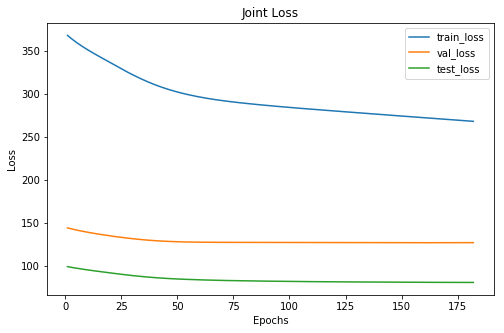

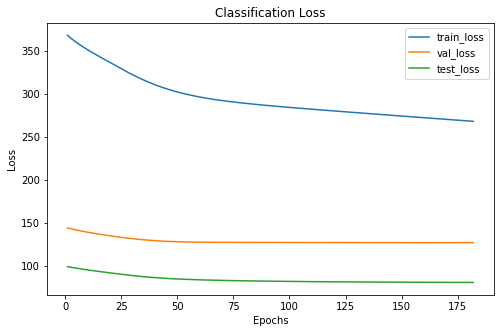

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      142     50      32
 2       70     31      25
xxxxxxxxxxxxxx epoch: 182 xxxxxxxxxxxxxx


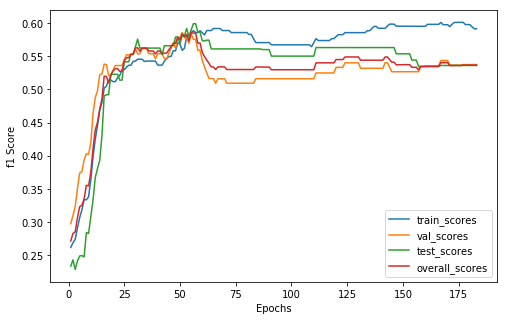

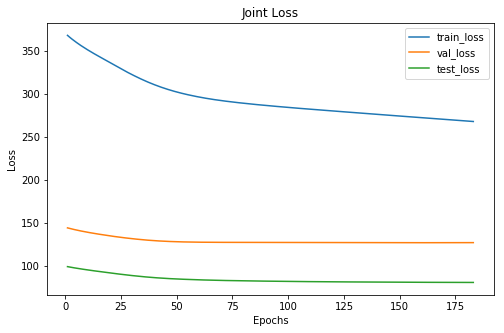

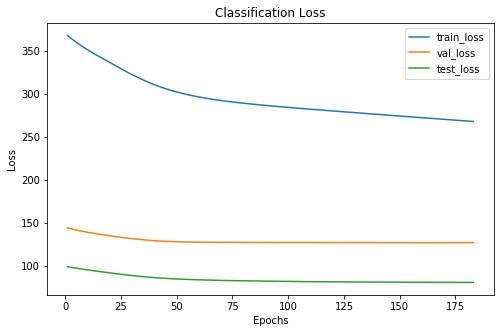

Cofusion Matrix For Val Set: 
--  --  --
28  11   6
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     49      31
 1      142     50      32
 2       70     31      25
xxxxxxxxxxxxxx epoch: 183 xxxxxxxxxxxxxx


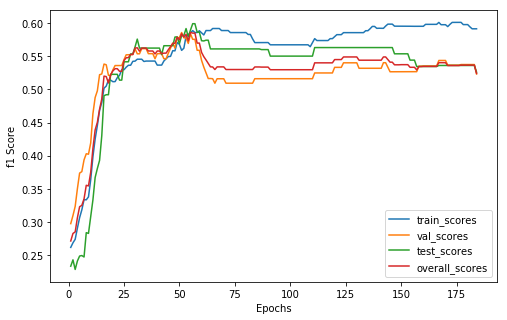

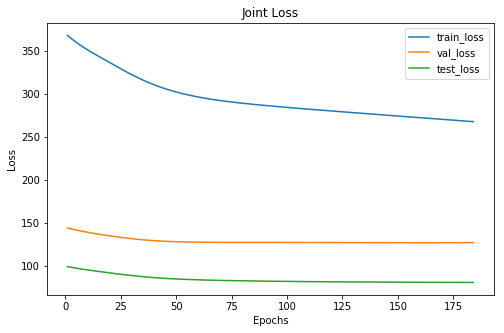

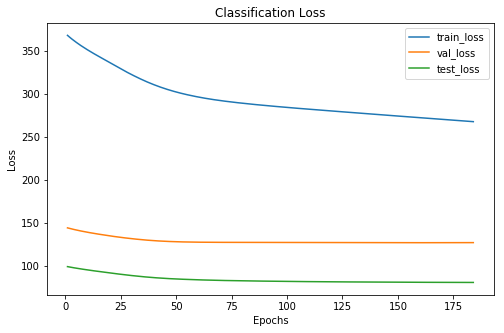

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     47      30
 1      142     50      32
 2       70     33      26
xxxxxxxxxxxxxx epoch: 184 xxxxxxxxxxxxxx


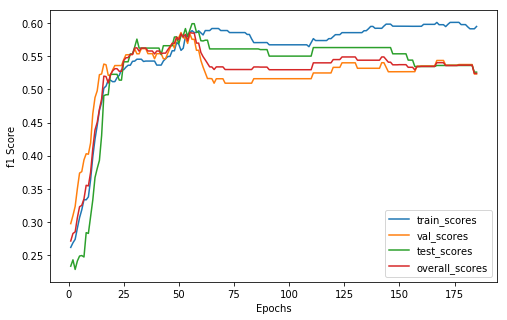

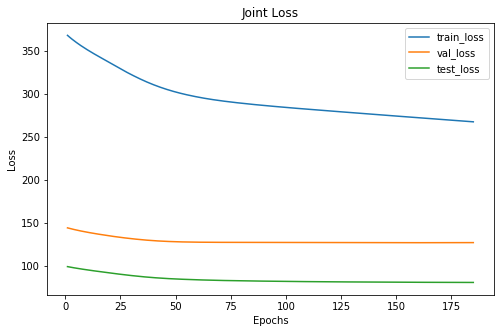

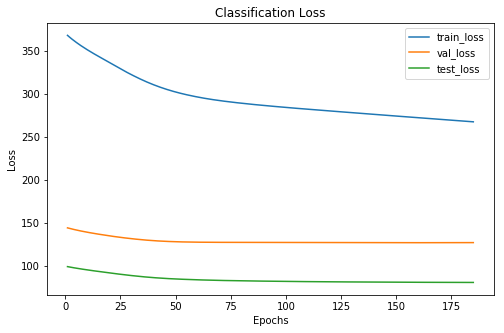

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     47      30
 1      142     50      32
 2       71     33      26
xxxxxxxxxxxxxx epoch: 185 xxxxxxxxxxxxxx


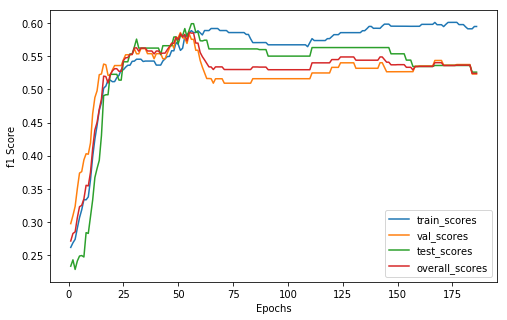

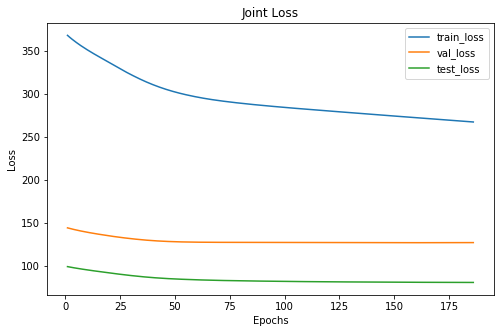

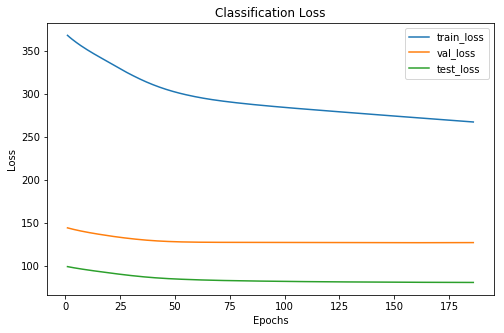

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     47      30
 1      142     50      32
 2       71     33      26
xxxxxxxxxxxxxx epoch: 186 xxxxxxxxxxxxxx


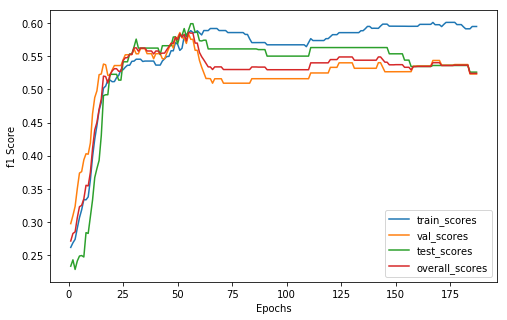

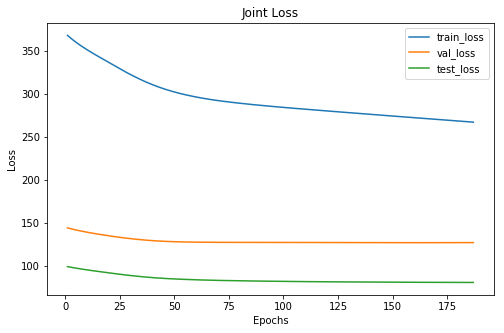

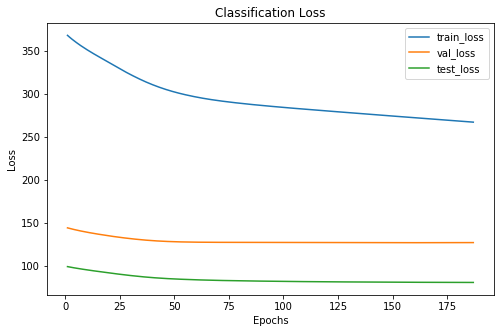

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     47      30
 1      142     50      32
 2       71     33      26
xxxxxxxxxxxxxx epoch: 187 xxxxxxxxxxxxxx


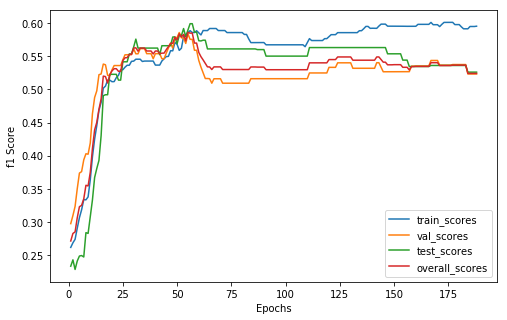

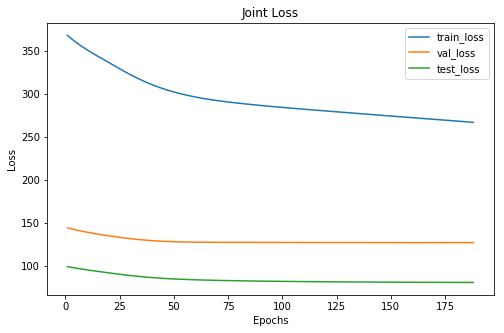

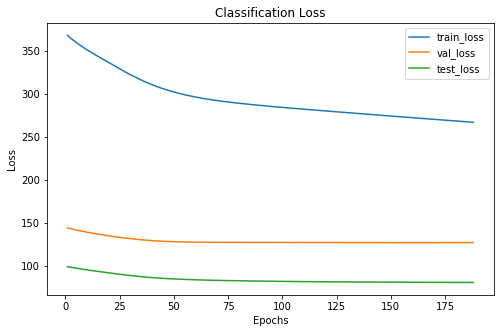

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     47      30
 1      142     50      32
 2       73     33      26
xxxxxxxxxxxxxx epoch: 188 xxxxxxxxxxxxxx


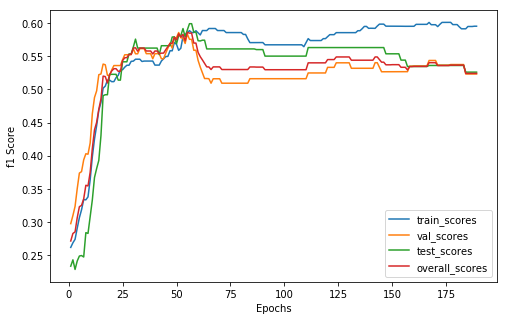

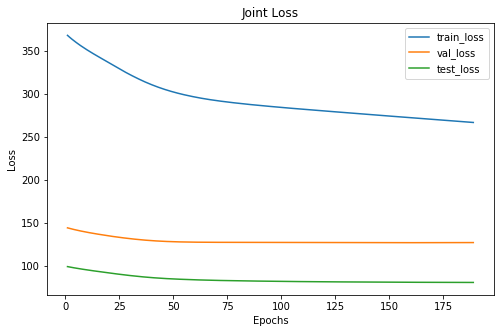

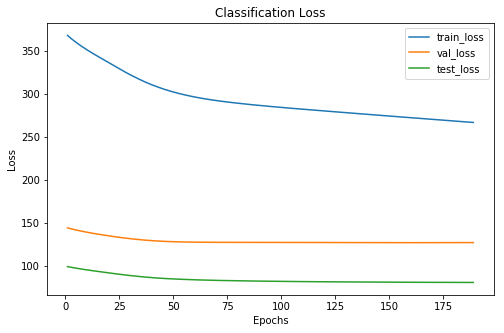

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      112     47      30
 1      142     50      32
 2       73     33      26
xxxxxxxxxxxxxx epoch: 189 xxxxxxxxxxxxxx


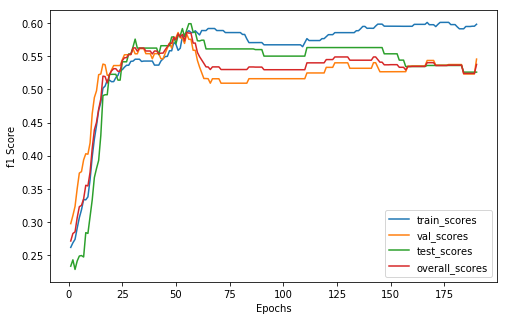

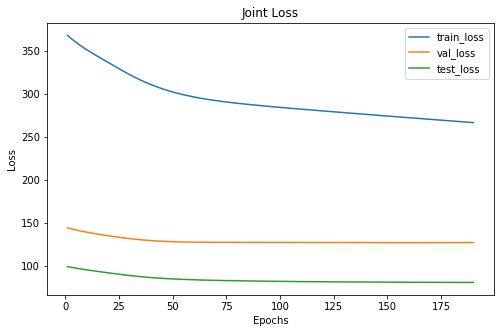

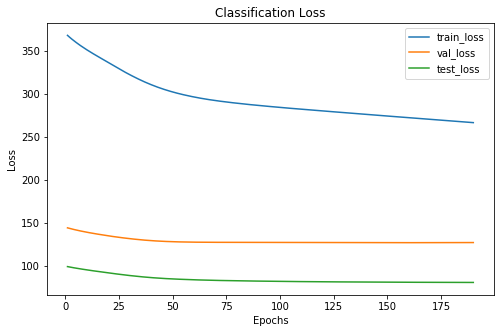

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     47      30
 1      143     47      32
 2       73     36      26
xxxxxxxxxxxxxx epoch: 190 xxxxxxxxxxxxxx


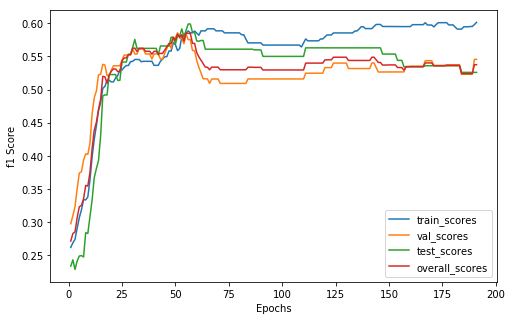

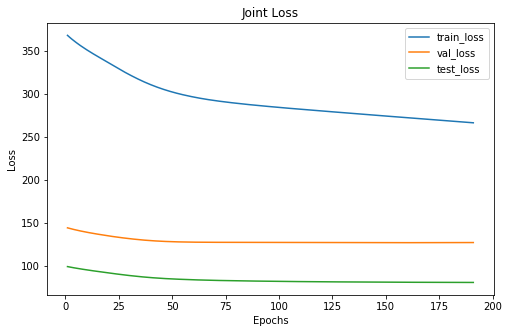

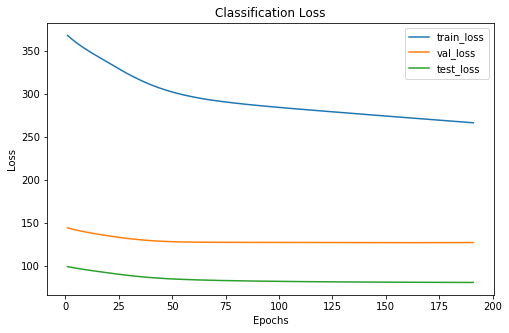

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
18  27  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     47      30
 1      142     47      32
 2       74     36      26
xxxxxxxxxxxxxx epoch: 191 xxxxxxxxxxxxxx


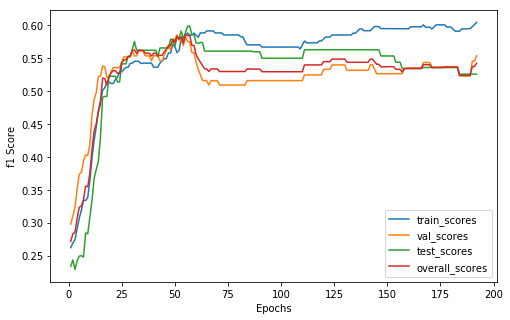

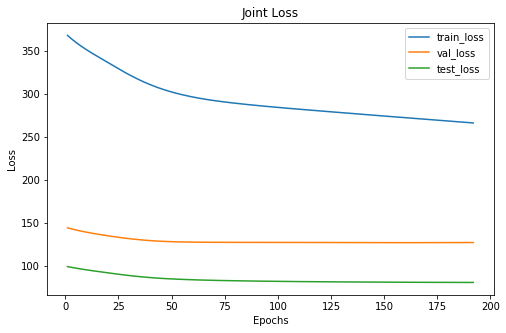

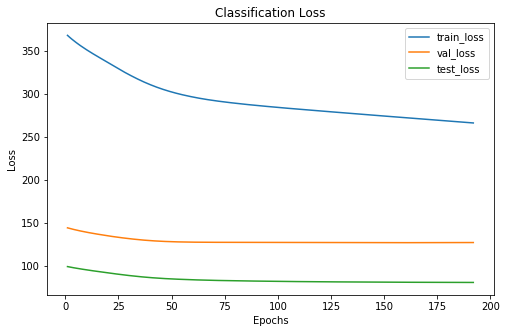

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     46      29
 1      141     48      33
 2       75     36      26
xxxxxxxxxxxxxx epoch: 192 xxxxxxxxxxxxxx


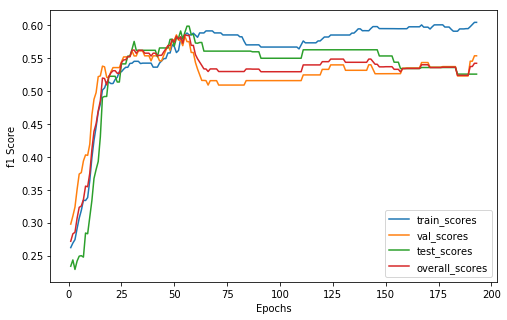

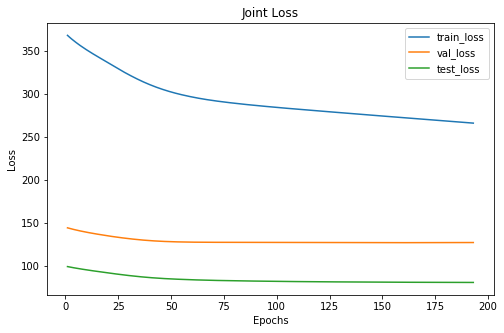

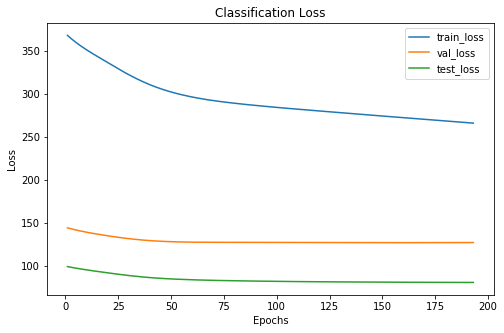

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     46      29
 1      141     48      33
 2       75     36      26
xxxxxxxxxxxxxx epoch: 193 xxxxxxxxxxxxxx


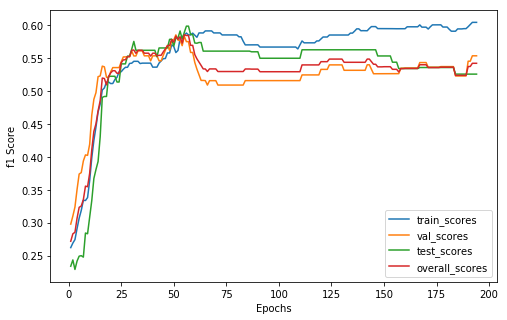

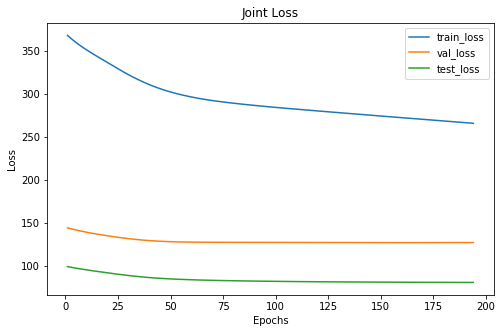

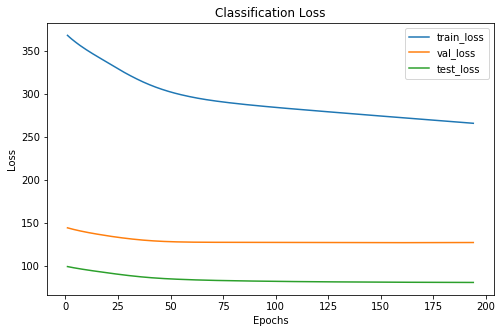

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     46      29
 1      141     48      33
 2       75     36      26
xxxxxxxxxxxxxx epoch: 194 xxxxxxxxxxxxxx


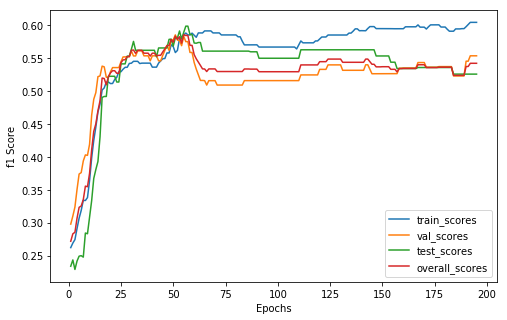

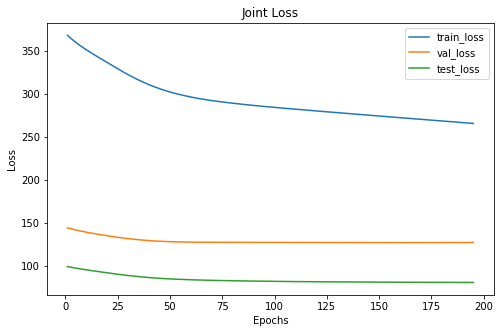

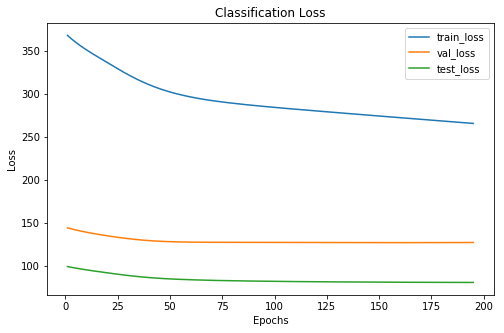

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     46      29
 1      141     48      33
 2       75     36      26
xxxxxxxxxxxxxx epoch: 195 xxxxxxxxxxxxxx


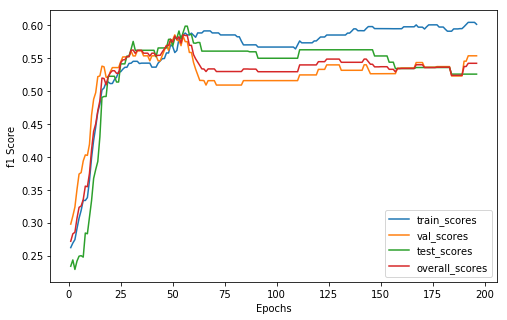

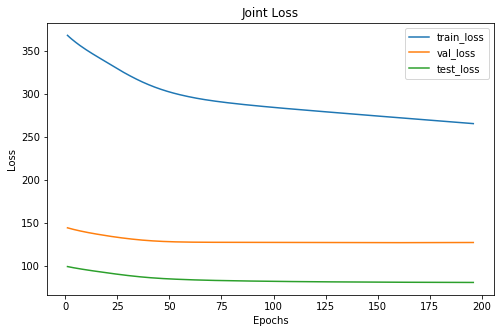

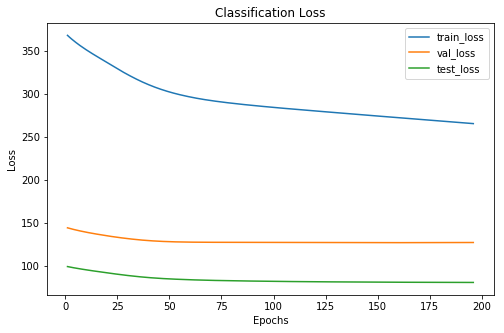

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     46      29
 1      142     48      33
 2       75     36      26
xxxxxxxxxxxxxx epoch: 196 xxxxxxxxxxxxxx


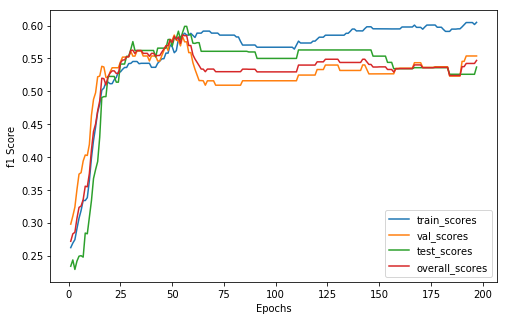

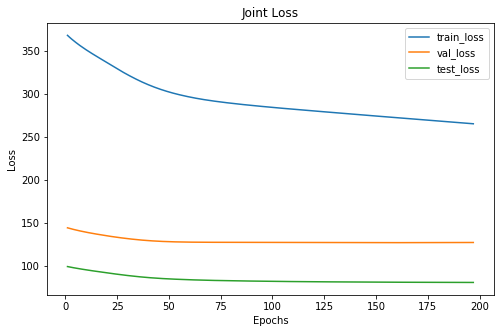

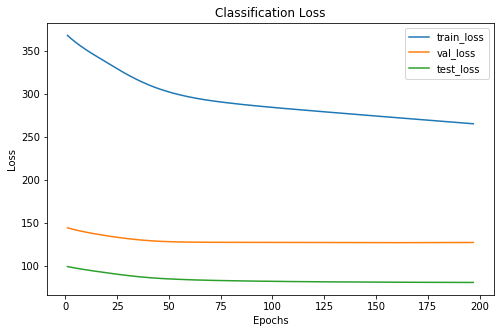

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     46      29
 1      141     48      34
 2       76     36      25
xxxxxxxxxxxxxx epoch: 197 xxxxxxxxxxxxxx


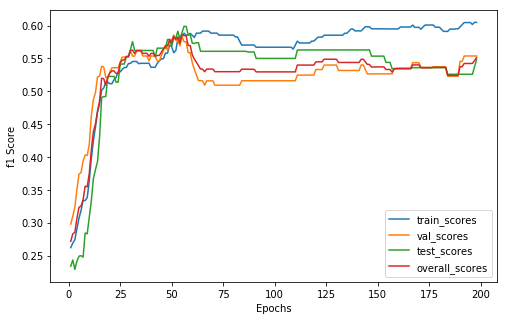

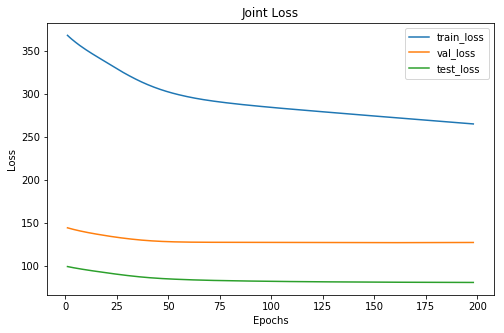

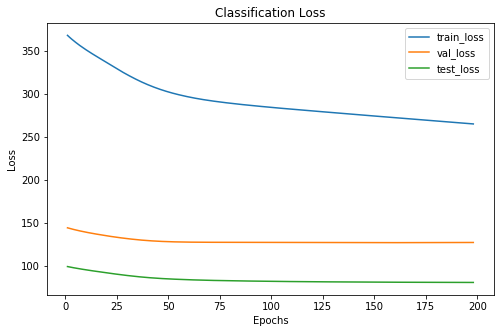

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      110     46      29
 1      141     48      33
 2       76     36      26
xxxxxxxxxxxxxx epoch: 198 xxxxxxxxxxxxxx


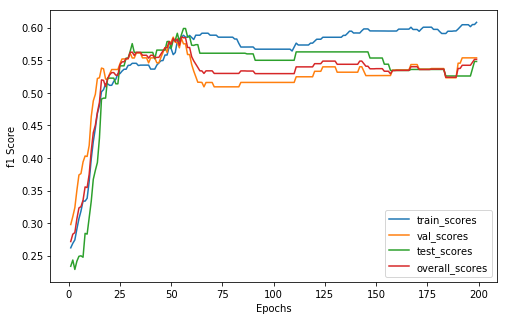

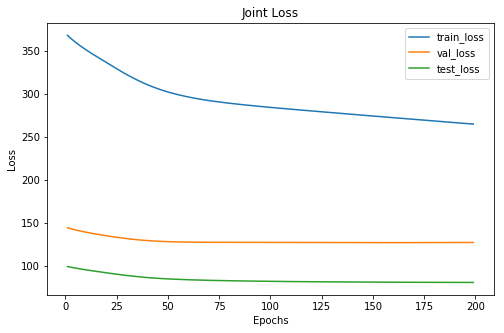

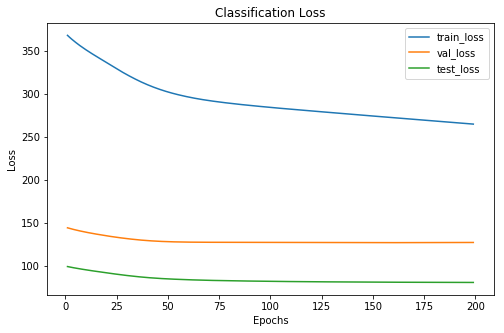

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      109     46      29
 1      141     48      33
 2       77     36      26
xxxxxxxxxxxxxx epoch: 199 xxxxxxxxxxxxxx


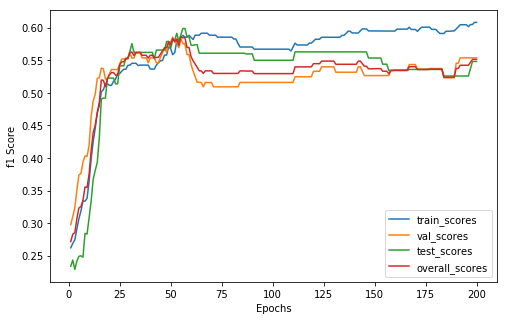

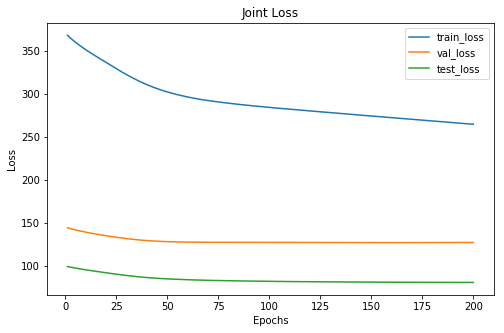

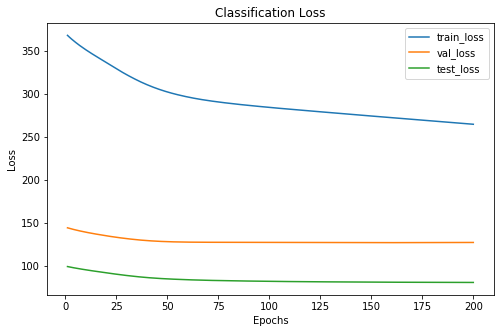

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      109     46      29
 1      141     48      33
 2       77     36      26
xxxxxxxxxxxxxx epoch: 200 xxxxxxxxxxxxxx


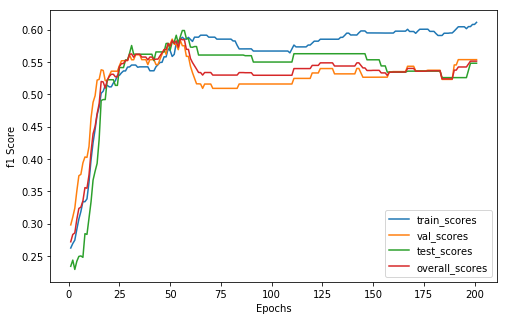

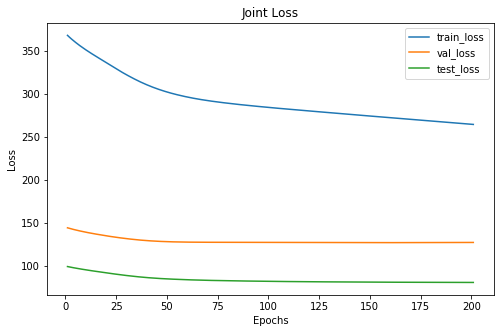

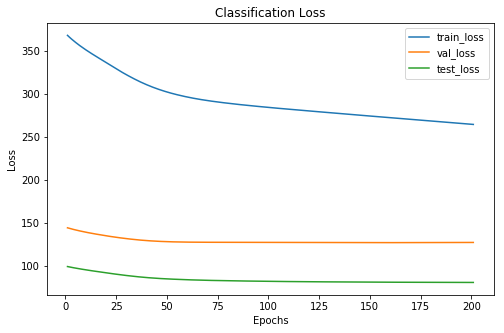

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  28  10
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      109     46      29
 1      140     48      33
 2       78     36      26
xxxxxxxxxxxxxx epoch: 201 xxxxxxxxxxxxxx


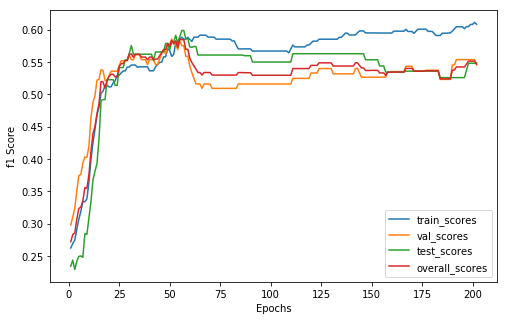

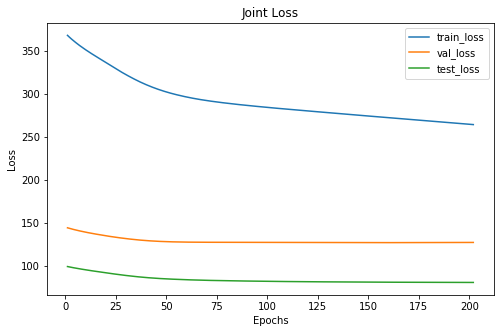

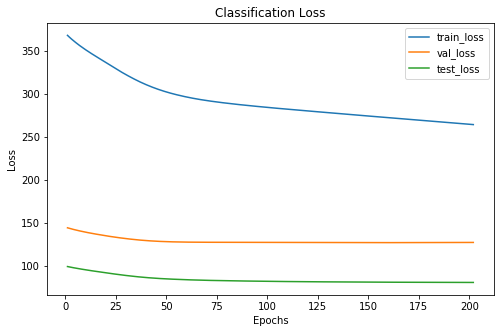

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      141     47      33
 2       78     37      26
xxxxxxxxxxxxxx epoch: 202 xxxxxxxxxxxxxx


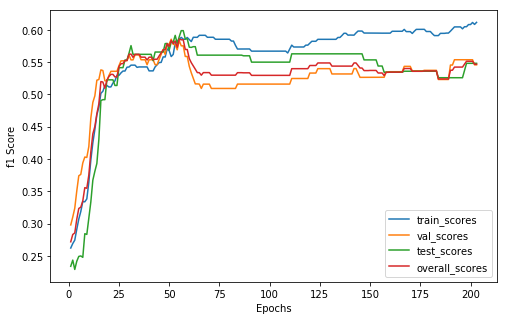

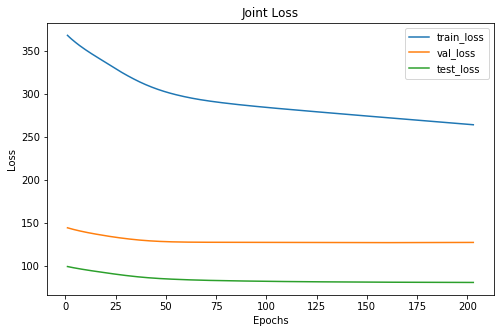

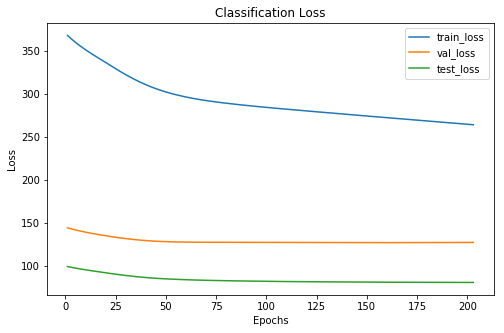

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      140     47      33
 2       79     37      26
xxxxxxxxxxxxxx epoch: 203 xxxxxxxxxxxxxx


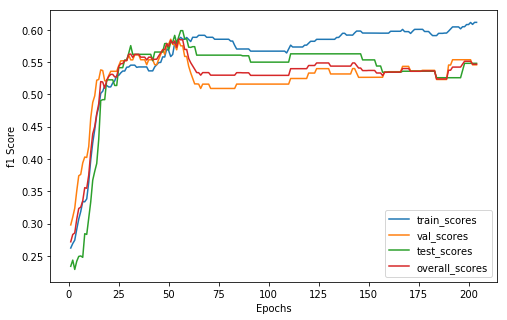

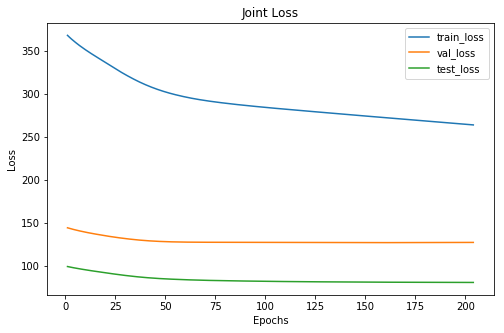

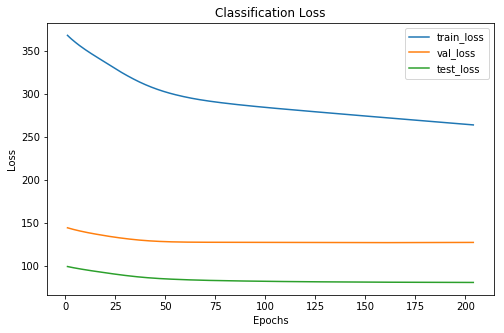

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      140     47      33
 2       79     37      26
xxxxxxxxxxxxxx epoch: 204 xxxxxxxxxxxxxx


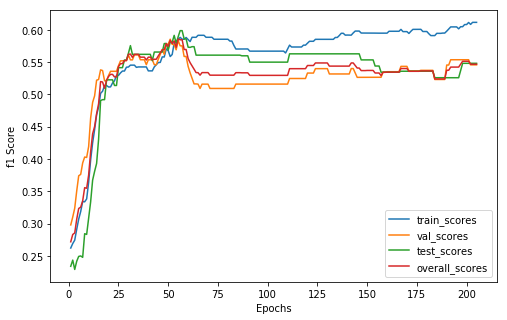

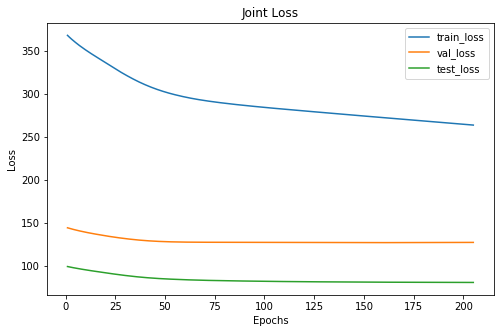

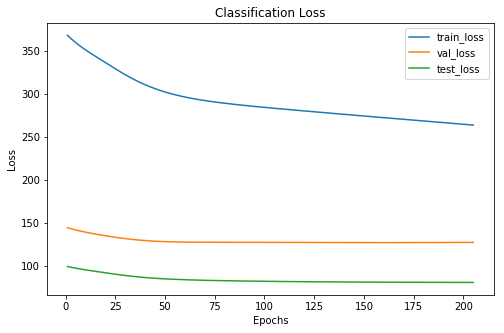

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      140     47      33
 2       79     37      26
xxxxxxxxxxxxxx epoch: 205 xxxxxxxxxxxxxx


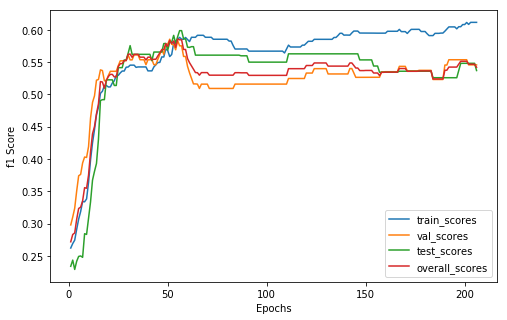

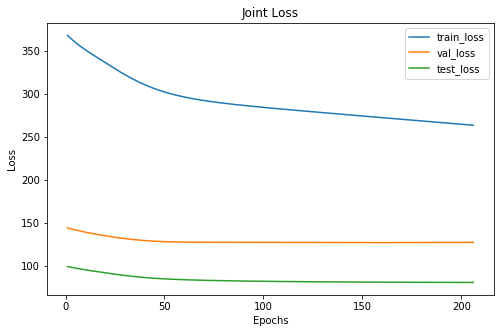

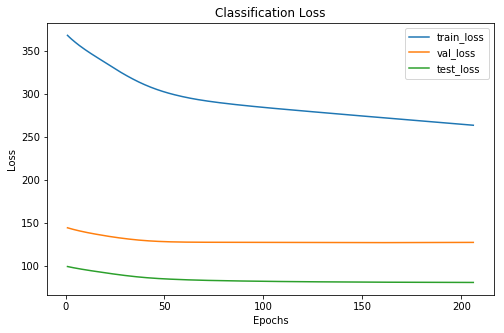

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      140     47      32
 2       79     37      27
xxxxxxxxxxxxxx epoch: 206 xxxxxxxxxxxxxx


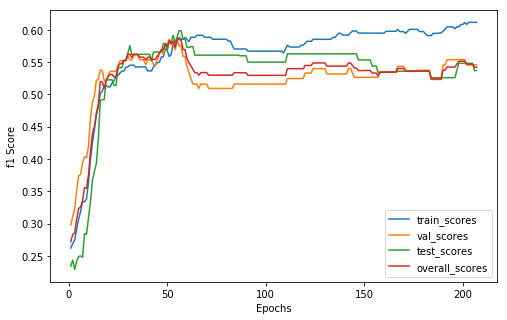

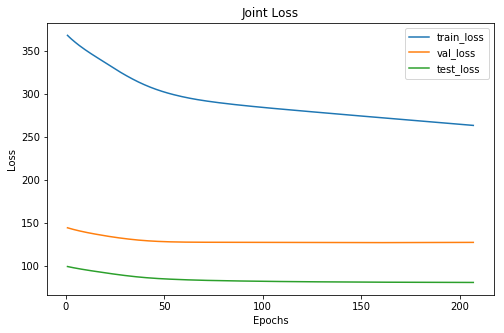

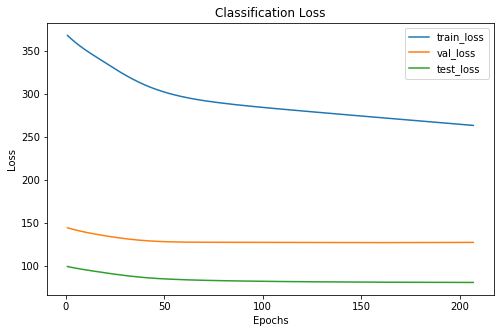

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      140     47      32
 2       79     37      27
xxxxxxxxxxxxxx epoch: 207 xxxxxxxxxxxxxx


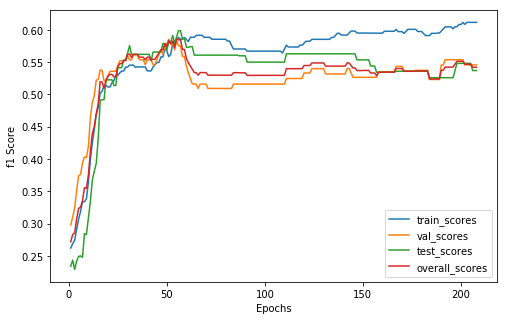

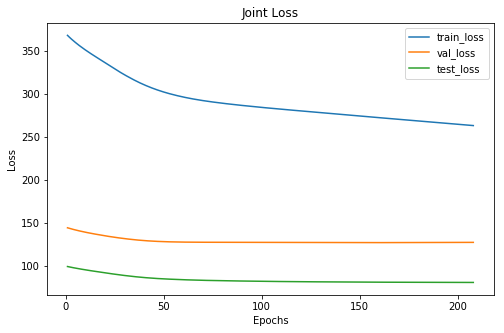

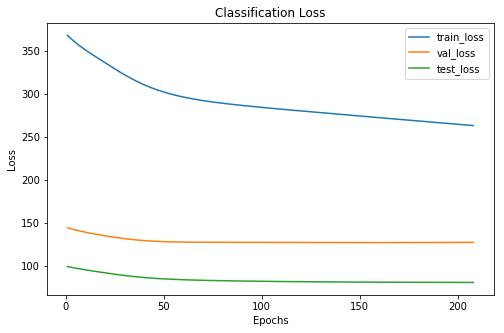

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      140     47      32
 2       79     37      27
xxxxxxxxxxxxxx epoch: 208 xxxxxxxxxxxxxx


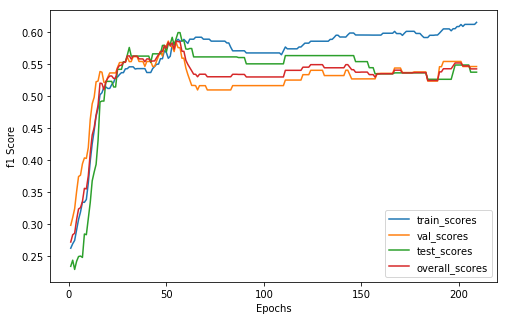

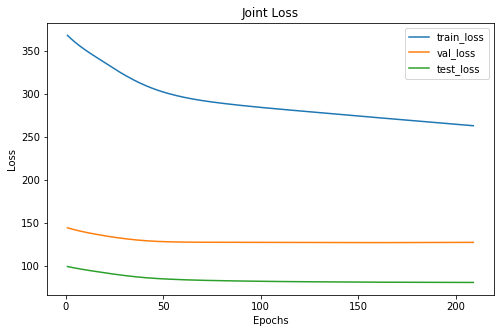

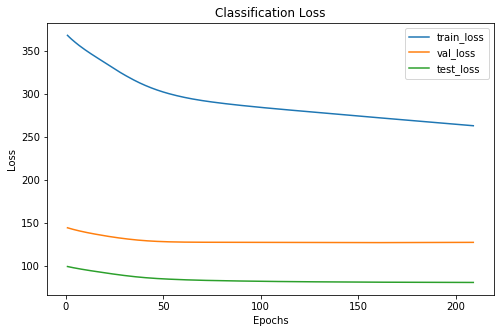

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      139     47      32
 2       80     37      27
xxxxxxxxxxxxxx epoch: 209 xxxxxxxxxxxxxx


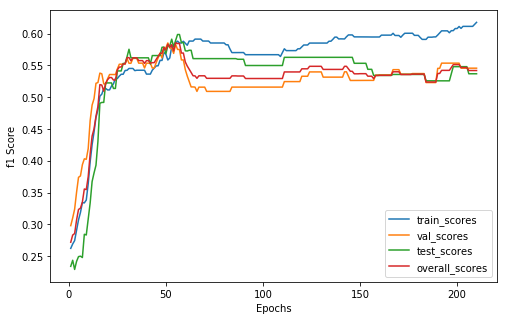

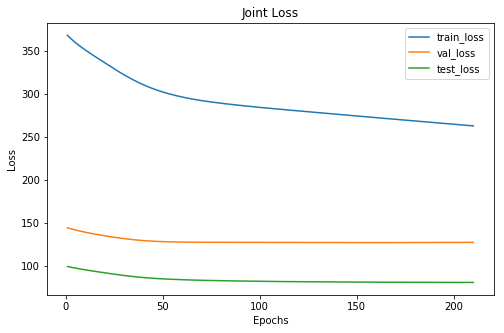

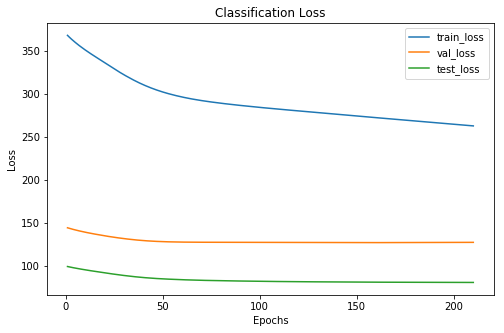

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      138     47      32
 2       81     37      27
xxxxxxxxxxxxxx epoch: 210 xxxxxxxxxxxxxx


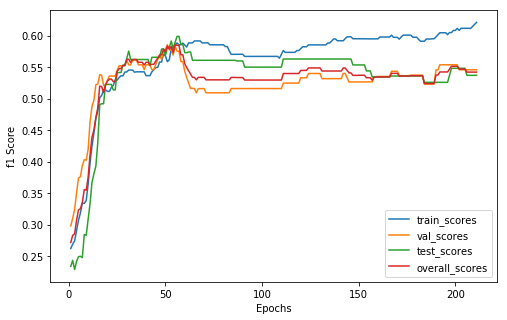

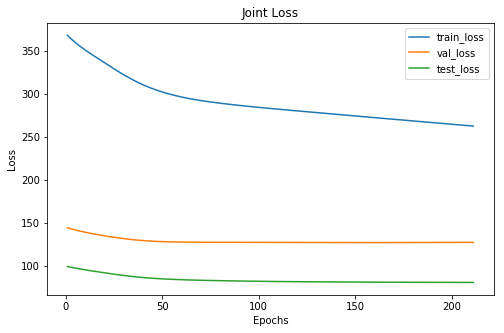

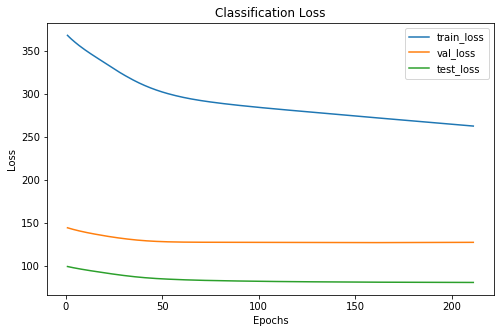

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      137     47      32
 2       82     37      27
xxxxxxxxxxxxxx epoch: 211 xxxxxxxxxxxxxx


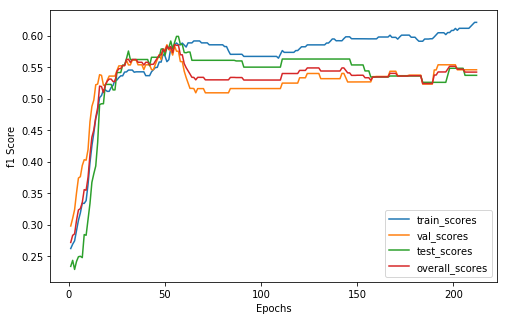

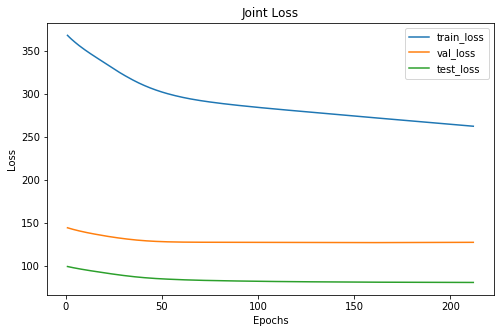

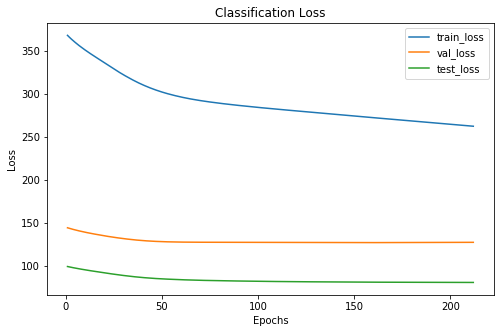

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      137     47      32
 2       82     37      27
xxxxxxxxxxxxxx epoch: 212 xxxxxxxxxxxxxx


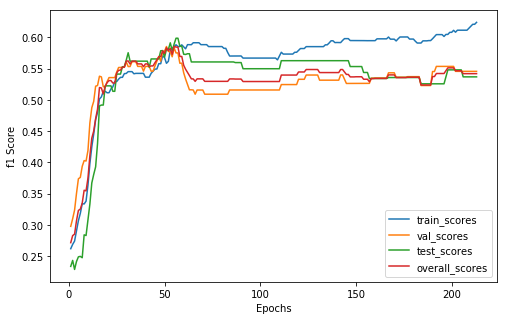

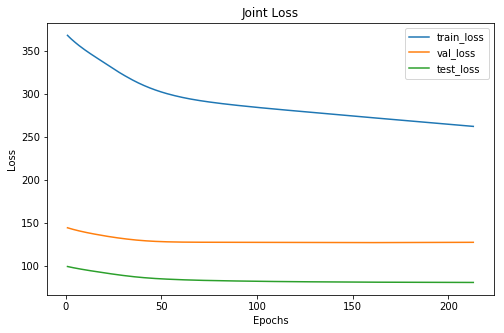

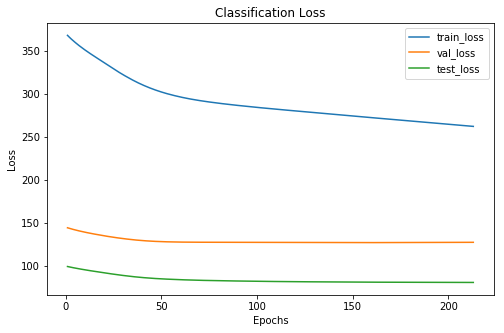

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      136     47      32
 2       83     37      27
xxxxxxxxxxxxxx epoch: 213 xxxxxxxxxxxxxx


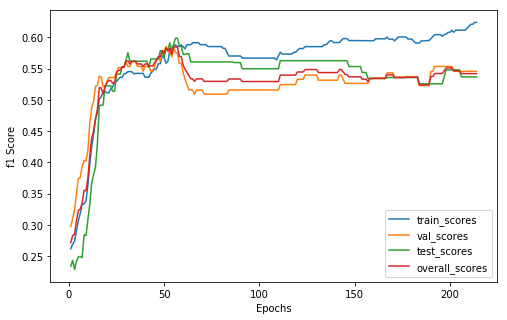

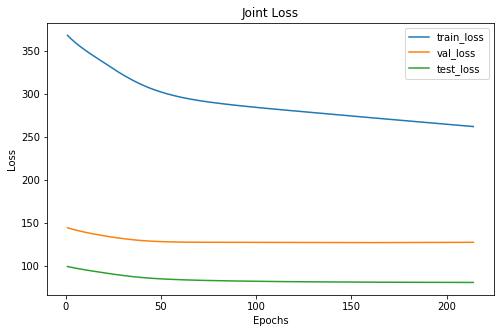

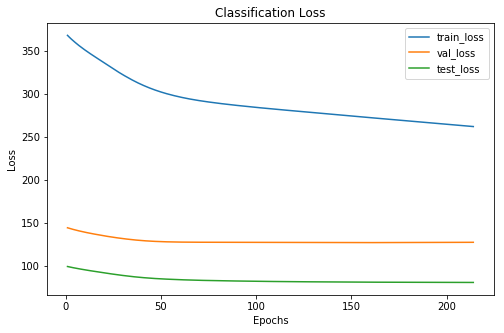

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      136     47      32
 2       83     37      27
xxxxxxxxxxxxxx epoch: 214 xxxxxxxxxxxxxx


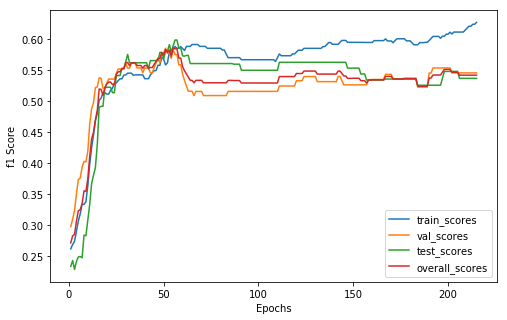

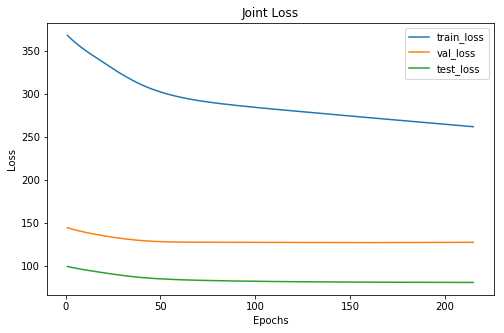

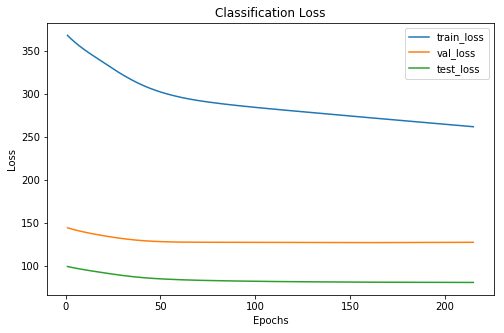

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      108     46      29
 1      135     47      32
 2       84     37      27
xxxxxxxxxxxxxx epoch: 215 xxxxxxxxxxxxxx


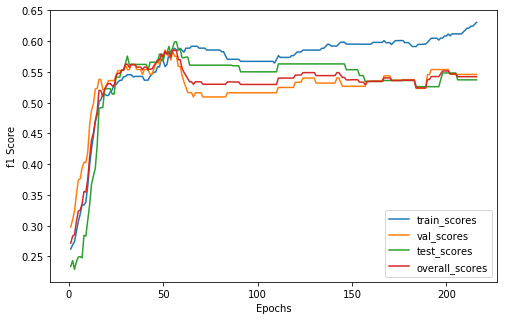

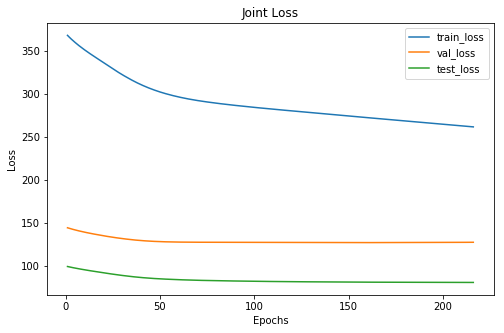

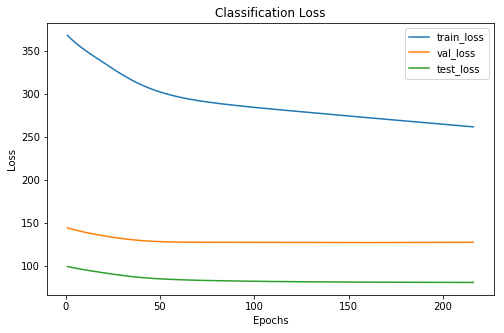

Cofusion Matrix For Val Set: 
--  --  --
26  11   8
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      107     46      29
 1      135     47      32
 2       85     37      27
xxxxxxxxxxxxxx epoch: 216 xxxxxxxxxxxxxx


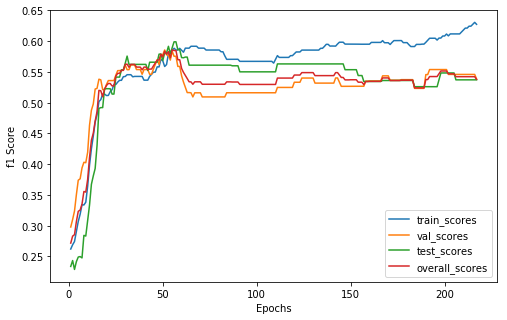

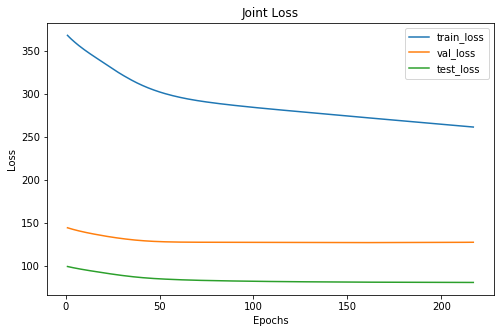

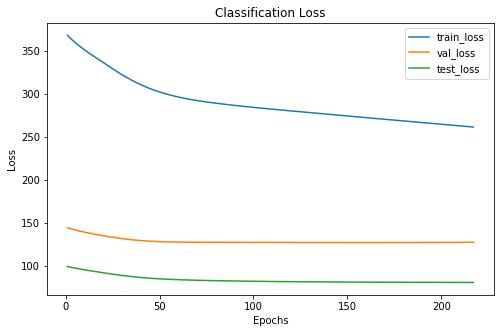

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      135     47      32
 2       86     38      27
xxxxxxxxxxxxxx epoch: 217 xxxxxxxxxxxxxx


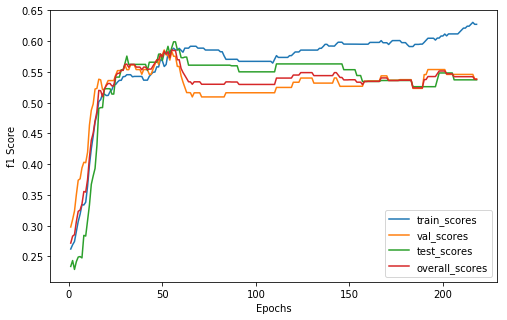

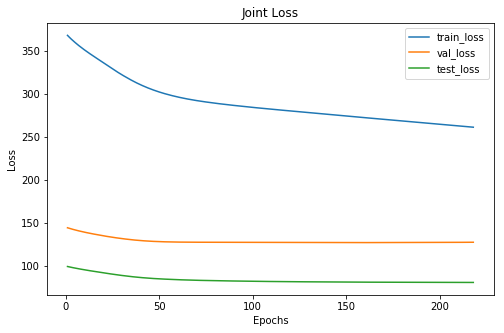

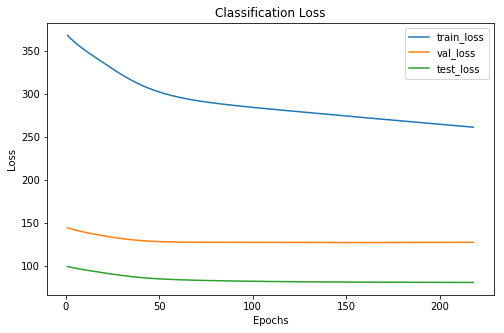

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      135     47      32
 2       86     38      27
xxxxxxxxxxxxxx epoch: 218 xxxxxxxxxxxxxx


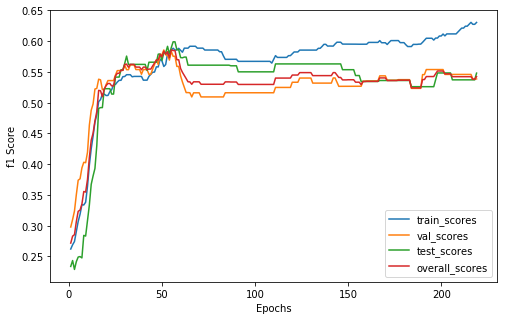

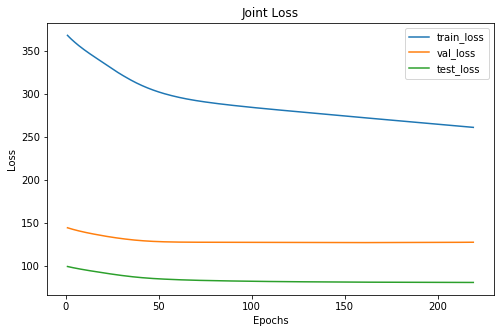

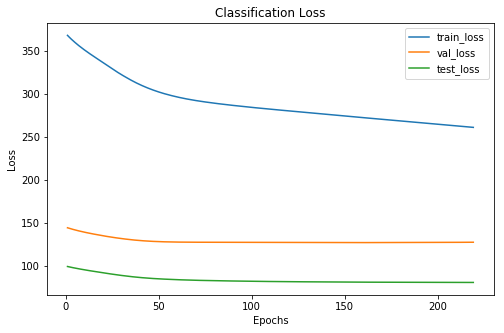

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      134     47      31
 2       87     38      28
xxxxxxxxxxxxxx epoch: 219 xxxxxxxxxxxxxx


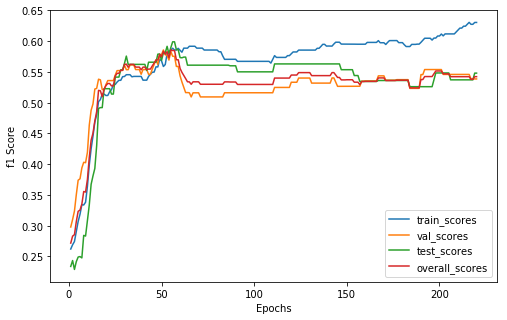

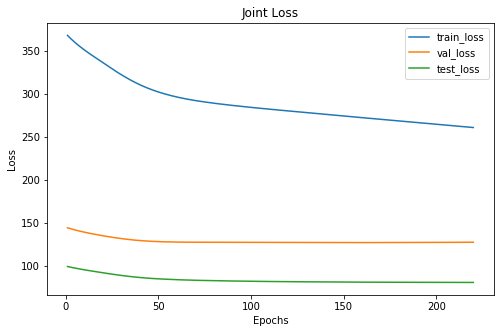

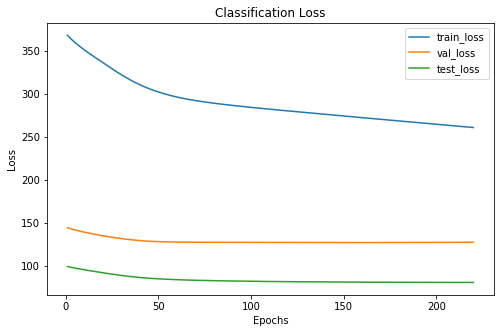

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      134     47      31
 2       87     38      28
xxxxxxxxxxxxxx epoch: 220 xxxxxxxxxxxxxx


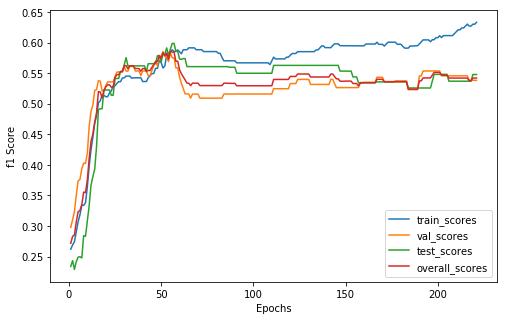

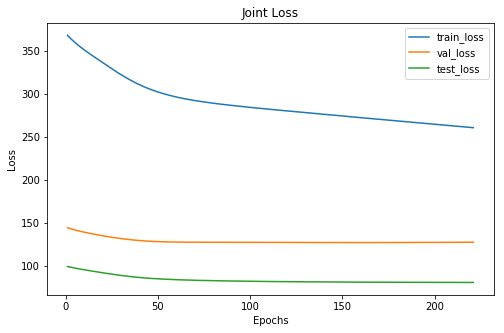

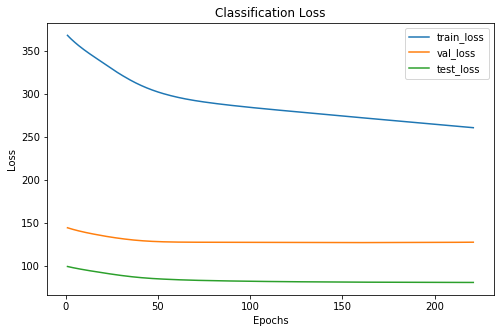

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      133     47      31
 2       88     38      28
xxxxxxxxxxxxxx epoch: 221 xxxxxxxxxxxxxx


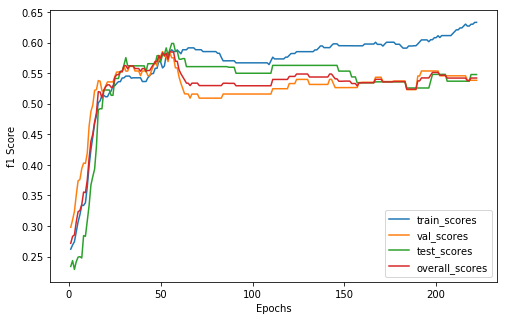

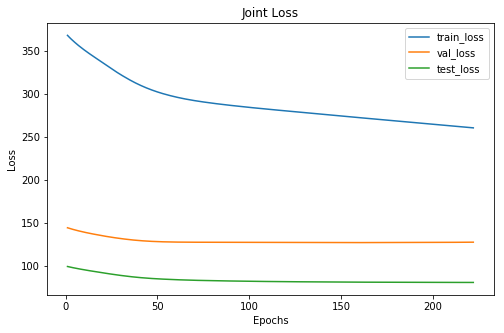

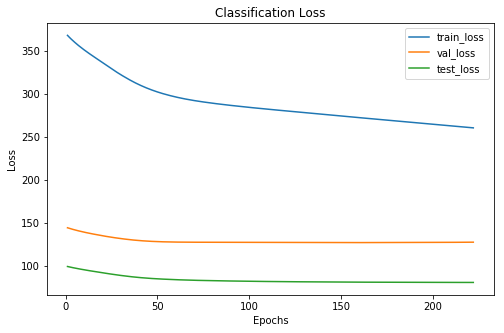

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      133     47      31
 2       88     38      28
xxxxxxxxxxxxxx epoch: 222 xxxxxxxxxxxxxx


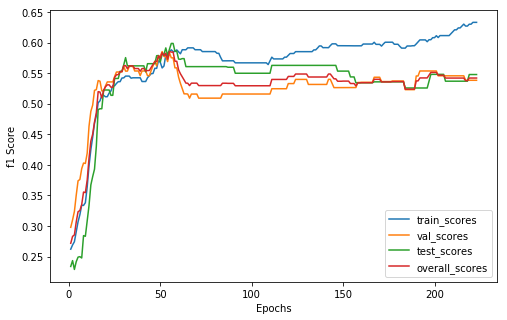

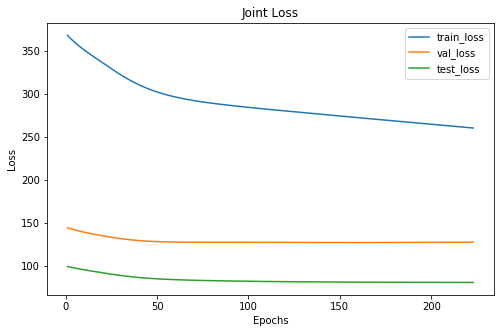

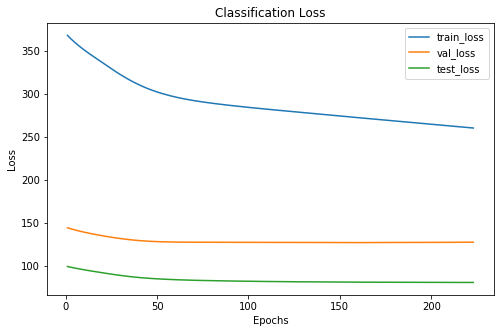

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      133     47      31
 2       88     38      28
xxxxxxxxxxxxxx epoch: 223 xxxxxxxxxxxxxx


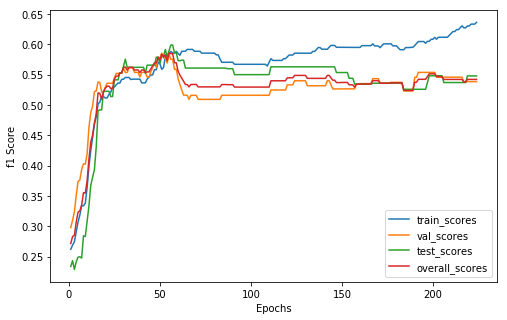

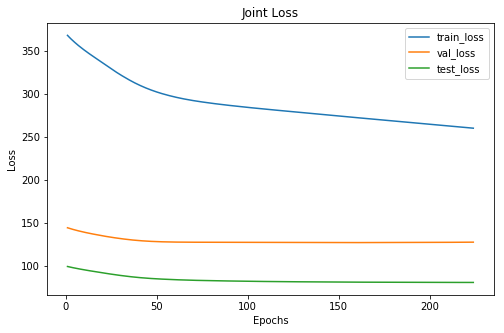

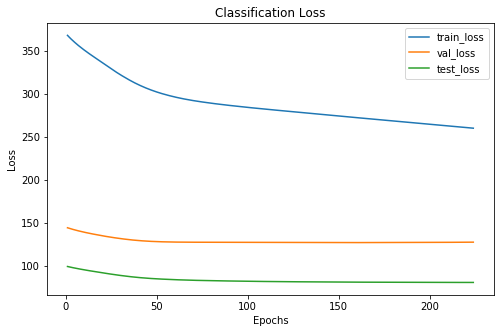

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3   9  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      131     47      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 224 xxxxxxxxxxxxxx


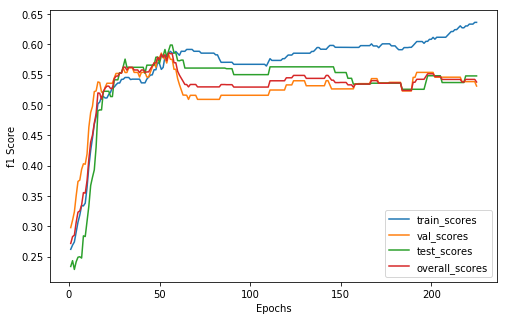

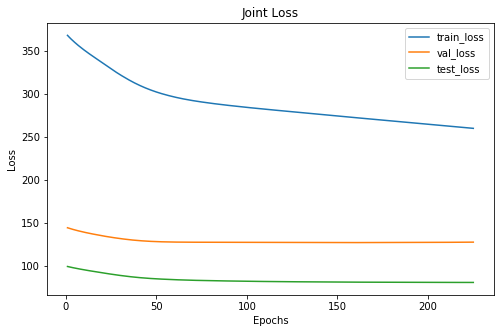

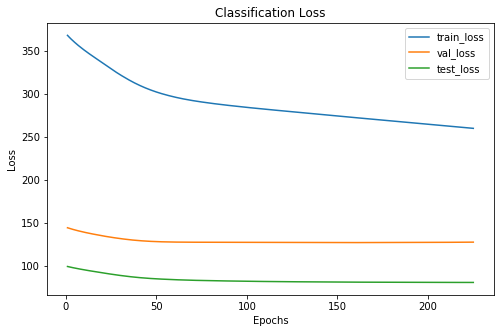

Cofusion Matrix For Val Set: 
--  --  --
25  11   9
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     45      29
 1      131     48      31
 2       90     37      28
xxxxxxxxxxxxxx epoch: 225 xxxxxxxxxxxxxx


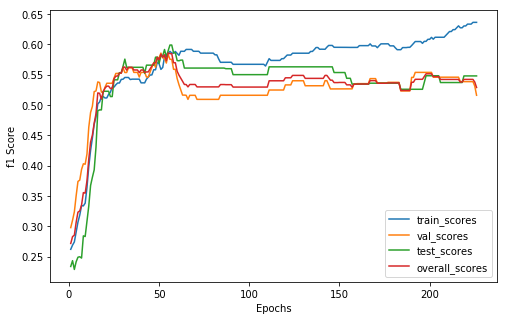

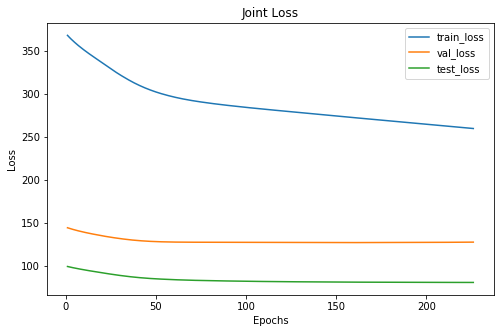

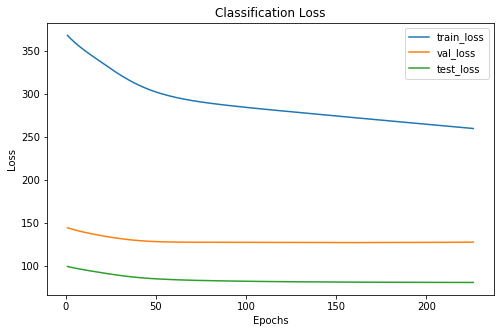

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 226 xxxxxxxxxxxxxx


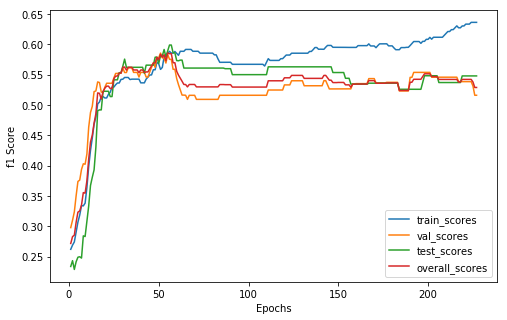

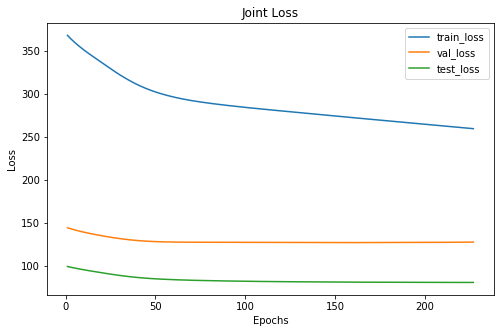

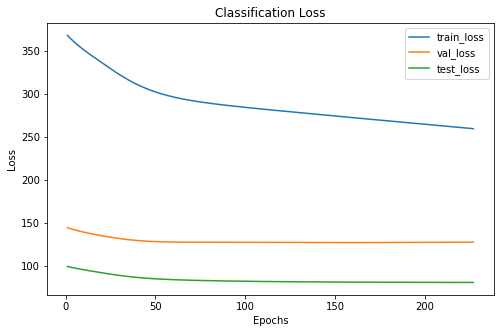

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 227 xxxxxxxxxxxxxx


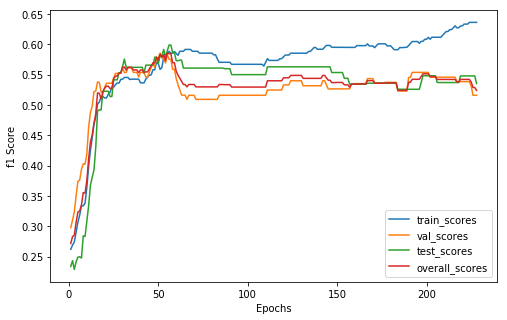

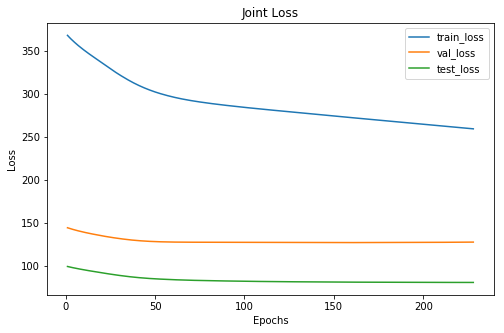

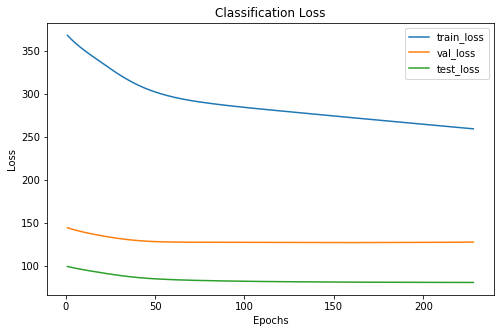

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      30
 1      131     49      30
 2       90     38      28
xxxxxxxxxxxxxx epoch: 228 xxxxxxxxxxxxxx


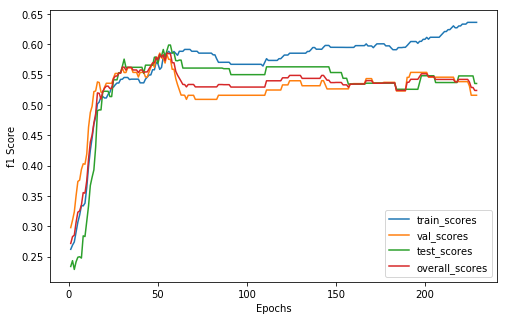

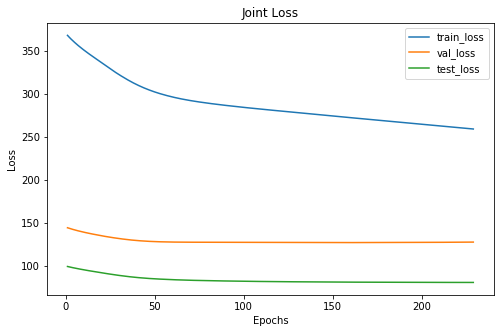

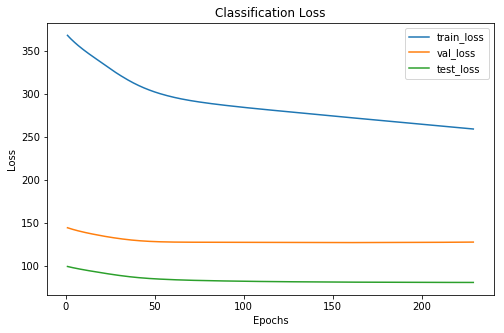

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      30
 1      131     49      30
 2       90     38      28
xxxxxxxxxxxxxx epoch: 229 xxxxxxxxxxxxxx


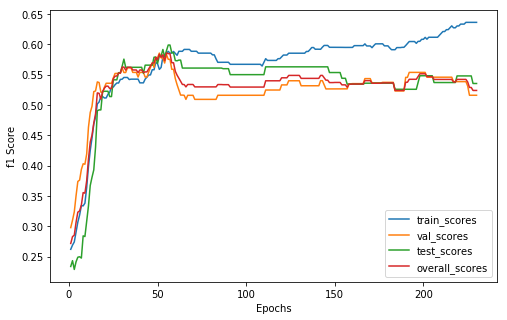

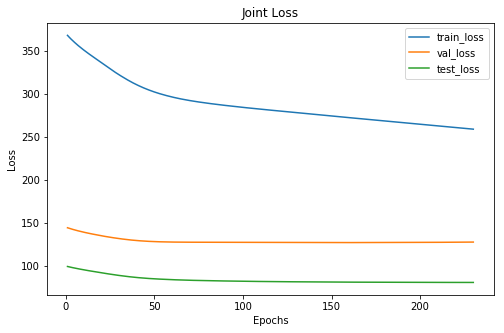

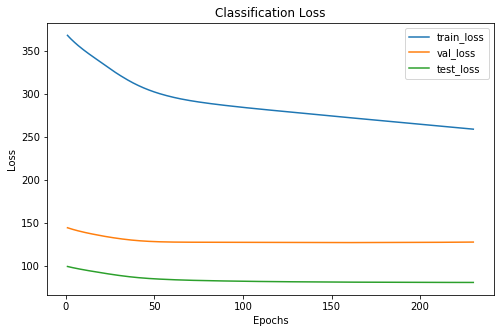

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      30
 1      131     49      30
 2       90     38      28
xxxxxxxxxxxxxx epoch: 230 xxxxxxxxxxxxxx


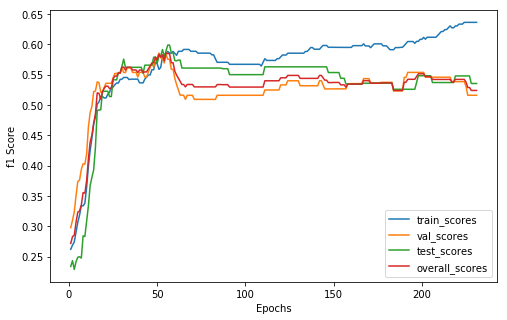

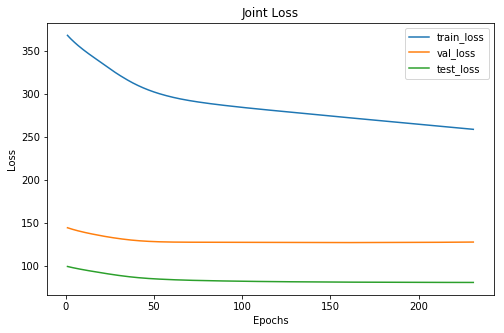

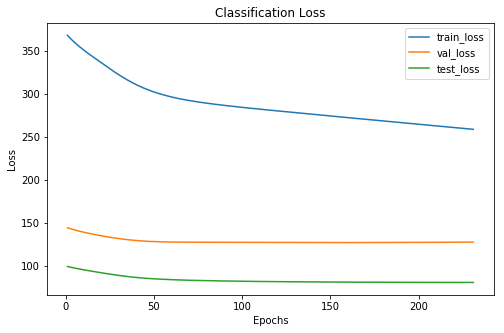

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      30
 1      131     49      30
 2       90     38      28
xxxxxxxxxxxxxx epoch: 231 xxxxxxxxxxxxxx


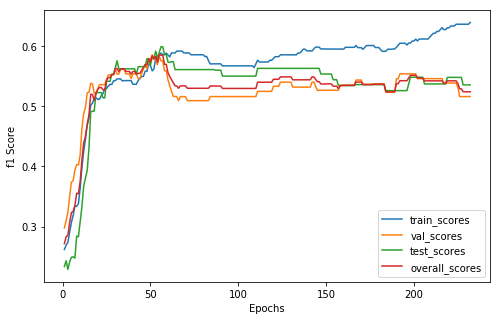

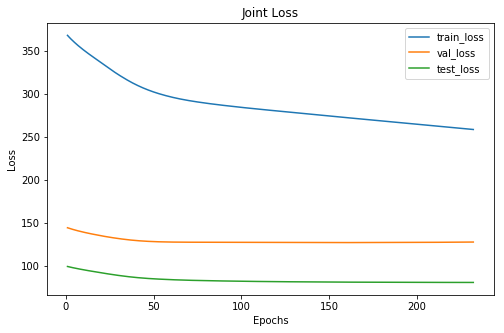

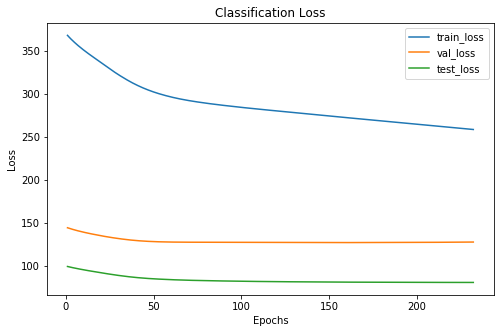

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      107     43      30
 1      130     49      30
 2       90     38      28
xxxxxxxxxxxxxx epoch: 232 xxxxxxxxxxxxxx


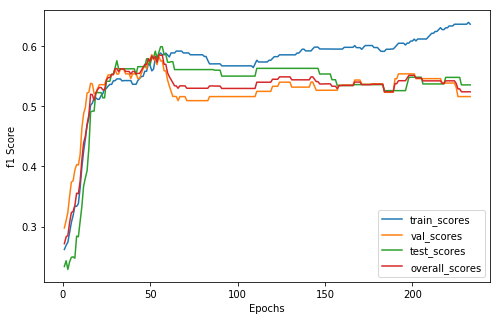

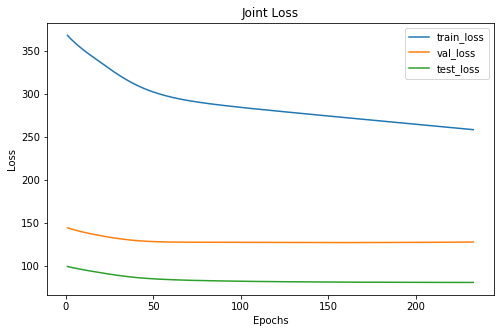

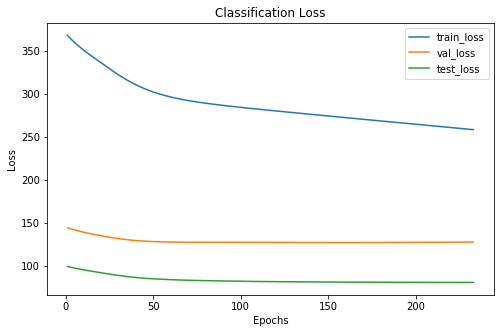

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      30
 1      131     49      30
 2       90     38      28
xxxxxxxxxxxxxx epoch: 233 xxxxxxxxxxxxxx


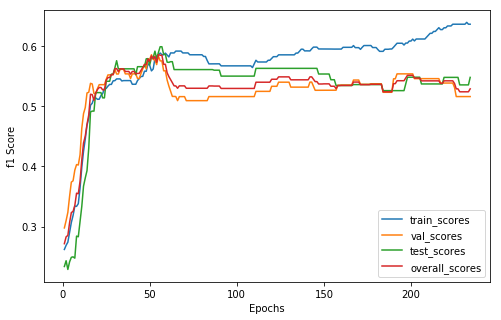

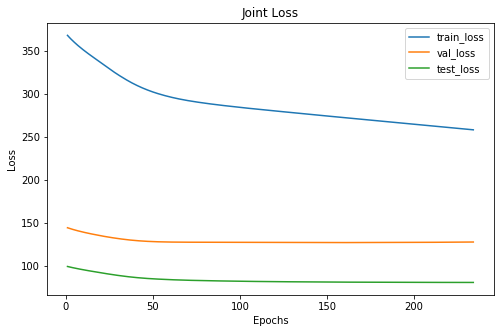

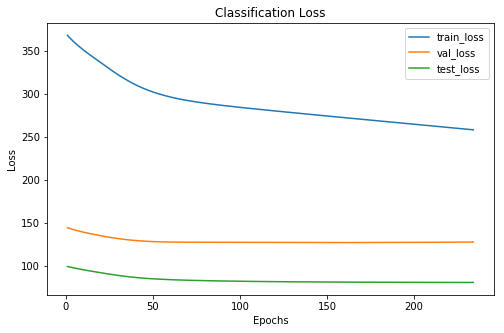

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 234 xxxxxxxxxxxxxx


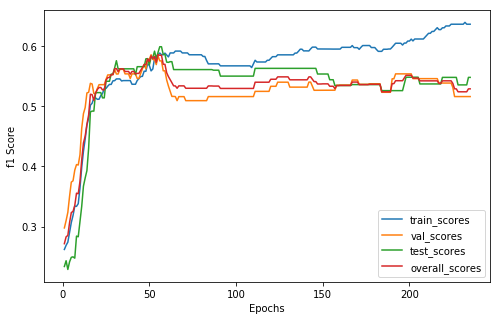

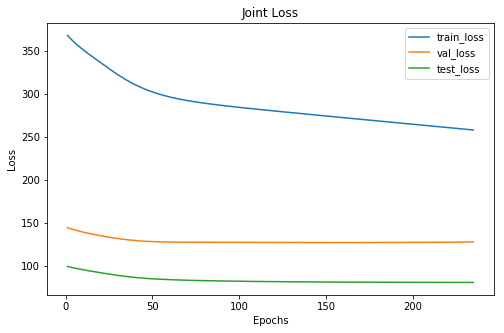

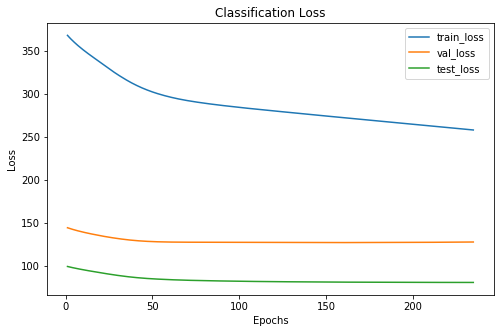

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 235 xxxxxxxxxxxxxx


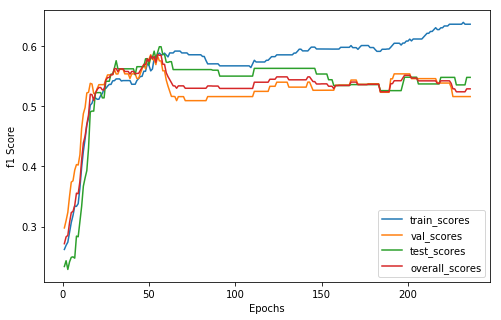

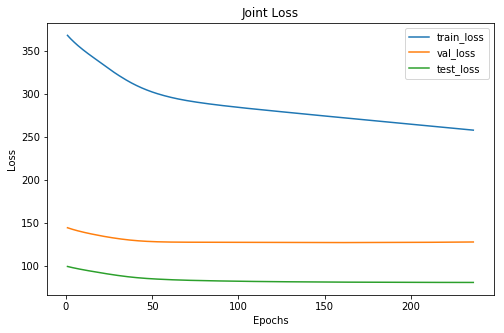

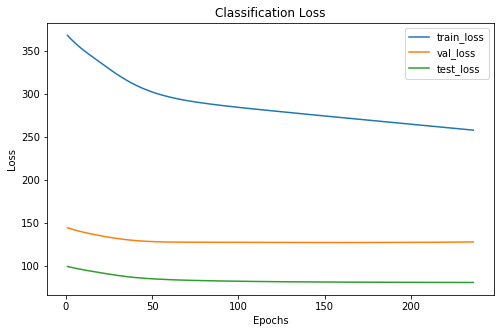

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 236 xxxxxxxxxxxxxx


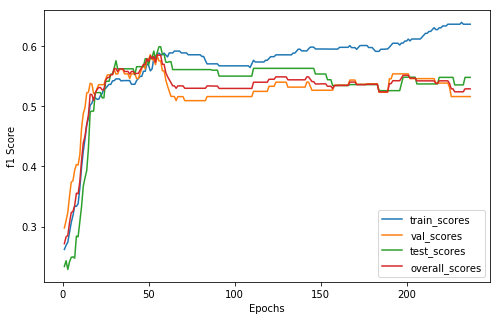

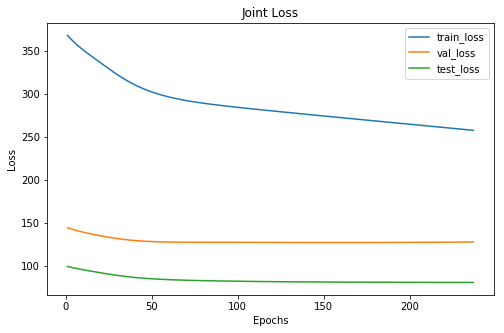

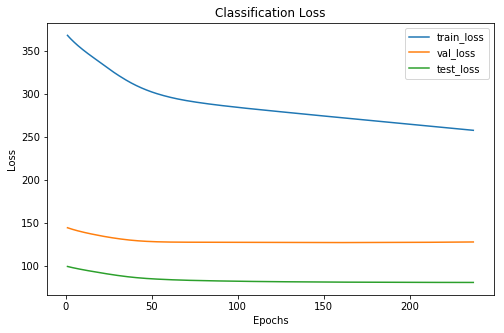

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      31
 2       90     38      28
xxxxxxxxxxxxxx epoch: 237 xxxxxxxxxxxxxx


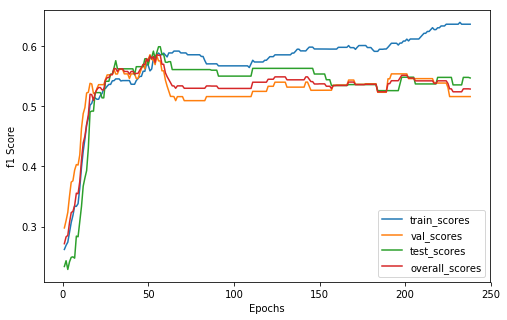

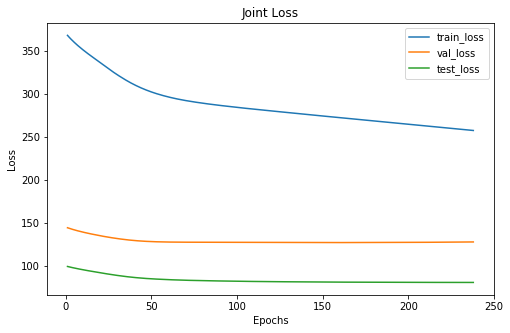

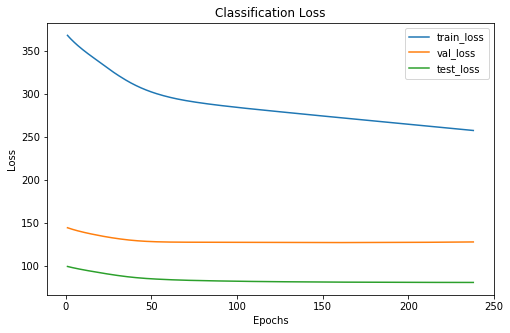

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      131     49      32
 2       90     38      27
xxxxxxxxxxxxxx epoch: 238 xxxxxxxxxxxxxx


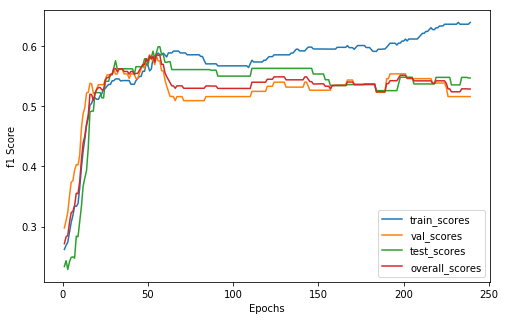

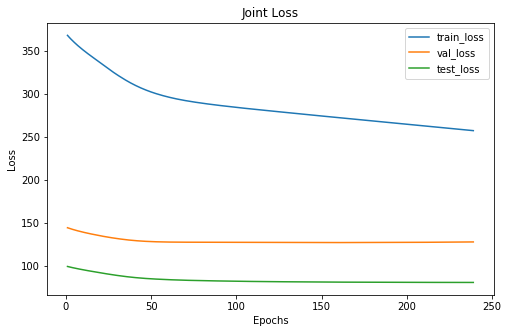

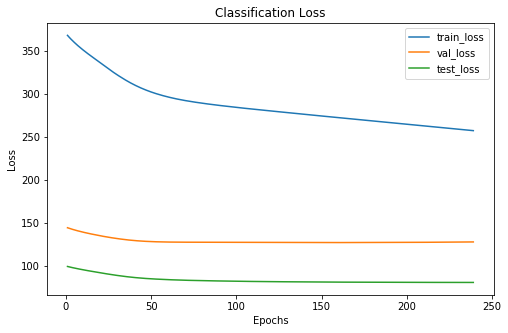

Cofusion Matrix For Val Set: 
--  --  --
23  12  10
17  27  11
 3  10  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      106     43      29
 1      130     49      32
 2       91     38      27


In [ ]:
total_loss_over_epochs, scores_over_epochs = plotting.get_empty_stat_over_n_epoch_dictionaries()
reconstruction_loss_over_epochs = deepcopy(total_loss_over_epochs)
classification_loss_over_epochs = deepcopy(total_loss_over_epochs)
validation_user_statistics_over_epochs = []


for epoch in range(n_epochs):
    
    (train_total_loss, train_total_reconstruction_loss , train_total_classification_loss, 
     train_labels, train_preds, train_users) = trainer.evaluate_multitask_learner(data, 
                                                                      'train_ids',
                                                                      num_classes,
                                                                      model,
                                                                      reconstruction_criterion ,
                                                                      classification_criterion,
                                                                      device,
                                                                      optimizer=optimizer,
                                                                      alpha=alpha,
                                                                      beta=beta,
                                                                      use_histogram=use_historgram,
                                                                      use_covariates=use_covariates)
    
    (val_total_loss, val_total_reconstruction_loss , val_total_classification_loss, 
     val_labels, val_preds, val_users) =  trainer.evaluate_multitask_learner(data,
                                                                  'val_ids',
                                                                  num_classes,
                                                                  model,
                                                                  reconstruction_criterion,
                                                                  classification_criterion,
                                                                  device,
                                                                  alpha=alpha,
                                                                  beta=beta,
                                                                  use_histogram=use_historgram,
                                                                  use_covariates=use_covariates)
    
    (test_total_loss, test_total_reconstruction_loss , test_total_classification_loss, 
     test_labels, test_preds, test_users) =  trainer.evaluate_multitask_learner(data, 
                                                                    'test_ids',
                                                                    num_classes,
                                                                    model,
                                                                    reconstruction_criterion,
                                                                    classification_criterion,
                                                                    device,
                                                                    alpha=alpha,
                                                                    beta=beta,
                                                                    use_histogram=use_historgram,
                                                                    use_covariates=use_covariates)
    
    ######## Appending losses ######## 
    total_loss_over_epochs['train_loss'].append(train_total_loss)
    total_loss_over_epochs['val_loss'].append(val_total_loss)
    total_loss_over_epochs['test_loss'].append(test_total_loss)
    
    reconstruction_loss_over_epochs['train_loss'].append(train_total_reconstruction_loss)
    reconstruction_loss_over_epochs['val_loss'].append(val_total_reconstruction_loss)
    reconstruction_loss_over_epochs['test_loss'].append(test_total_reconstruction_loss)
    
    classification_loss_over_epochs['train_loss'].append(train_total_classification_loss)
    classification_loss_over_epochs['val_loss'].append(val_total_classification_loss)
    classification_loss_over_epochs['test_loss'].append(test_total_classification_loss)

    
    ######## Appending Metrics ######## 
    val_label_list = conversions.tensor_list_to_int_list(val_labels)
    test_label_list = conversions.tensor_list_to_int_list(test_labels)
    val_pred_list = conversions.tensor_list_to_int_list(val_preds)
    test_pred_list = conversions.tensor_list_to_int_list(test_preds)
    over_all_label_list = val_label_list + test_label_list
    over_all_pred_list = val_pred_list + test_pred_list
    
    train_scores = metrics.precision_recall_fscore_support(conversions.tensor_list_to_int_list(train_labels),
                                                           conversions.tensor_list_to_int_list(train_preds), average='weighted')
    val_scores = metrics.precision_recall_fscore_support(val_label_list, val_pred_list, average='weighted')
    test_scores = metrics.precision_recall_fscore_support(test_label_list, test_pred_list, average='weighted')
    overall_scores = metrics.precision_recall_fscore_support(over_all_label_list, over_all_pred_list, average='weighted')

    scores_over_epochs['train_scores'].append(train_scores)
    scores_over_epochs['val_scores'].append(val_scores)
    scores_over_epochs['test_scores'].append(test_scores)
    scores_over_epochs['overall_scores'].append(overall_scores)
    
    validation_user_statistics_over_epochs.append(statistics.generate_training_statistics_for_user(val_labels, 
                                                                                                val_preds, 
                                                                                                val_users))

    if epoch%1 == 0:
        print("xxxxxxxxxxxxxx epoch: {} xxxxxxxxxxxxxx".format(epoch))
        plotting.plot_score_over_n_epochs(scores_over_epochs, score_type='f1', fig_size=(8,5))
        plotting.plot_loss_over_n_epochs(total_loss_over_epochs, fig_size=(8, 5), title="Joint Loss")
#         plotting.plot_loss_over_n_epochs(reconstruction_loss_over_epochs, fig_size=(8, 5), title="Reconstruction Loss")
        plotting.plot_loss_over_n_epochs(classification_loss_over_epochs, fig_size=(8, 5), title="Classification Loss")
        
        print("Cofusion Matrix For Val Set: ")
        print(tabulate( metrics.confusion_matrix(conversions.tensor_list_to_int_list(val_labels), 
                                                 conversions.tensor_list_to_int_list(val_preds))))
        print("Predicted Label Distribution:")
        print(statistics.get_train_test_val_label_counts_from_predictions(train_preds, val_preds, test_preds))
